**1. Upload the dataset and drop the duplicates**

In [2]:
# Importing pandas to read and display a CSV file
import pandas as pd

csv_file_path = "Data/ebay_comments.csv"

df = pd.read_csv(csv_file_path)

df


,Search,Product Title,Condition,Price,Seller,Review,Review - Title,Review - Star,Review - Author,Review - Date,Review - Verified Purchase
0,Iphone,Apple iPhone 13 Pro Max - 128GB - Alpine Green...,musicmagpie,£634.99,NaN,Probably as I had hoped for as the phone is in...,Great but heavy.,4 stars,stickyprobs,28.Jun.23,Yes
1,Iphone,Apple iPhone 13 Pro Max - 128GB - Alpine Green...,new,£634.99,ssa2234ssa,"Fantastic,new and sealed as described. It come...",Fantastic,5 stars,helwa1078-voxze...,29.Sep.22,Yes
2,Iphone,Apple iPhone 13 Pro Max - 128GB - Alpine Green...,pre-owned,£634.99,phones2gadgets,It’s a good phone.. Had a new 13 model but fo...,Will do for me for a few years.. hopefully..,5 stars,paulprior249,20.Jun.23,Yes
3,Iphone,Apple iPhone 13 Pro Max - 128GB - Alpine Green...,phonesdirect_com,£634.99,NaN,Perfect quality as if its new and it has 100% ...,Goood,5 stars,88s275,16.Aug.23,Yes
4,Iphone,Apple iPhone 13 Pro Max - 128GB - Alpine Green...,new,£634.99,sell-phones,I love it fantastic phone,Perfect 👍,5 stars,sarolga,4.Jun.22,Yes
...,...,...,...,...,...,...,...,...,...,...,...
67181,iPad,"Apple iPad 64 GB 25.9 cm (10.2"") Wi-Fi 5 (802....",new,£531.62,dealsonetwothree,Excellent product had two previously and alway...,ipad 9th generation,5 stars,allan5328,11.Mar.22,Yes
67182,iPad,"Apple iPad 64 GB 25.9 cm (10.2"") Wi-Fi 5 (802....",pre-owned,£531.62,paulhaggis1970,Loved this item great value for money would re...,iPad 9th generation excellent product,5 stars,bilyprops1962,12.Jun.22,Yes
67183,iPad,"Apple iPad 64 GB 25.9 cm (10.2"") Wi-Fi 5 (802....",new,£531.62,awol_1_1,"Robust software, easy to set up and easy to use.",States exactly what the product is.,5 stars,ashrafkhan2005,6.Sep.22,Yes
67184,iPad,"Apple iPad 64 GB 25.9 cm (10.2"") Wi-Fi 5 (802....",new,£531.62,ainsey2003,Light weight hd graphics sound not to good but...,Ipad9,5 stars,tonyrath2010,22.Apr.23,Yes


In [3]:
# Filter 'df' for rows with 'Apple' in 'Product Title' and count unique values in 'Search' column.
df = df[df['Product Title'].str.contains('Apple', na=False, case=False)]
df['Search'].value_counts()


Iphone         49349
AirPods         4891
Apple Watch     3609
Macbook         2846
iPad            2797
Name: Search, dtype: int64

In [4]:
# Remove duplicate rows based on 'Search' and 'Review' columns, and display count of unique values in 'Search'
df = df.drop_duplicates(subset=['Search', 'Review'])
df['Search'].value_counts()


Iphone         14731
AirPods         1920
iPad            1656
Macbook         1476
Apple Watch     1420
Name: Search, dtype: int64

**2. Drop unnecessary columns**

In [5]:
#Display a concise summary of the df.
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21203 entries, 0 to 67164
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Search                      21203 non-null  object
 1   Product Title               21203 non-null  object
 2   Condition                   16902 non-null  object
 3   Price                       21203 non-null  object
 4   Seller                      15924 non-null  object
 5   Review                      21198 non-null  object
 6   Review - Title              21202 non-null  object
 7   Review - Star               21203 non-null  object
 8   Review - Author             21203 non-null  object
 9   Review - Date               21203 non-null  object
 10  Review - Verified Purchase  17767 non-null  object
dtypes: object(11)
memory usage: 1.9+ MB


In [6]:
# Count the frequency of each unique value in the 'Condition' column of the dataframe 'df'.
df['Condition'].value_counts()

pre-owned       12078
new              3413
refurbished       433
musicmagpie        75
wjd-store          74
                ...  
sznjim              1
7553mike            1
govnor9             1
cash4gadgets        1
frsan-778           1
Name: Condition, Length: 289, dtype: int64

In [7]:
# Rename columns, drop specific columns, and display summary of DataFrame 'df'.
df.rename(columns={'Review': 'Comment_Body', 'Review - Date': 'Date', 'Review - Author': 'Author'}, inplace=True)
df.drop(['Product Title', 'Seller', 'Review - Title', 'Review - Star', 'Review - Verified Purchase'], axis=1, inplace=True)
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 21203 entries, 0 to 67164
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Search        21203 non-null  object
 1   Condition     16902 non-null  object
 2   Price         21203 non-null  object
 3   Comment_Body  21198 non-null  object
 4   Author        21203 non-null  object
 5   Date          21203 non-null  object
dtypes: object(6)
memory usage: 1.1+ MB


**3. Adjust the type of the columns**

In [8]:
# Convert 'Date' column to datetime and display dataframe information
df['Date'] = pd.to_datetime(df['Date'])
df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 21203 entries, 0 to 67164
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Search        21203 non-null  object        
 1   Condition     16902 non-null  object        
 2   Price         21203 non-null  object        
 3   Comment_Body  21198 non-null  object        
 4   Author        21203 non-null  object        
 5   Date          21203 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(5)
memory usage: 1.1+ MB


**3. Check the duplicates**

In [9]:
# Remove duplicates from the DataFrame 'df' and display the updated DataFrame
df = df.drop_duplicates()
df


,Search,Condition,Price,Comment_Body,Author,Date
0,Iphone,musicmagpie,£634.99,Probably as I had hoped for as the phone is in...,stickyprobs,2023-06-28
1,Iphone,new,£634.99,"Fantastic,new and sealed as described. It come...",helwa1078-voxze...,2022-09-29
2,Iphone,pre-owned,£634.99,It’s a good phone.. Had a new 13 model but fo...,paulprior249,2023-06-20
3,Iphone,phonesdirect_com,£634.99,Perfect quality as if its new and it has 100% ...,88s275,2023-08-16
4,Iphone,new,£634.99,I love it fantastic phone,sarolga,2022-06-04
...,...,...,...,...,...,...
67158,iPad,on.trading,US $529.99,Best,fresh_light,2019-10-19
67159,iPad,frsan-778,US $529.99,Good job,chitrun48,2023-02-15
67162,iPad,pre-owned,US $529.99,Well!,toton8,2019-09-17
67163,iPad,pre-owned,US $565.00,You get the M1 chip 8gb ram like the iPad Pro ...,isonrober,2023-01-10


**5. Anonymize the comments**

In [10]:
# Drop the 'Author' column from the dataframe 'df' and display the modified dataframe
df = df.drop('Author', axis=1)
df


,Search,Condition,Price,Comment_Body,Date
0,Iphone,musicmagpie,£634.99,Probably as I had hoped for as the phone is in...,2023-06-28
1,Iphone,new,£634.99,"Fantastic,new and sealed as described. It come...",2022-09-29
2,Iphone,pre-owned,£634.99,It’s a good phone.. Had a new 13 model but fo...,2023-06-20
3,Iphone,phonesdirect_com,£634.99,Perfect quality as if its new and it has 100% ...,2023-08-16
4,Iphone,new,£634.99,I love it fantastic phone,2022-06-04
...,...,...,...,...,...
67158,iPad,on.trading,US $529.99,Best,2019-10-19
67159,iPad,frsan-778,US $529.99,Good job,2023-02-15
67162,iPad,pre-owned,US $529.99,Well!,2019-09-17
67163,iPad,pre-owned,US $565.00,You get the M1 chip 8gb ram like the iPad Pro ...,2023-01-10


**6. Detect the language and drop null values**

In [11]:
# This script detects the language of comments in a dataframe using the langdetect library
from langdetect import detect

def detect_language(comment):
    try:
        return detect(comment)
    except:
        return None

df['Language'] = df['Comment_Body'].apply(detect_language)
df['Language'].value_counts()


en       19626
af         249
fr         161
ca         147
ro         118
so         100
es          79
it          73
de          63
cy          60
pt          46
tl          43
et          41
nl          37
ru          36
no          31
hu          29
sw          28
da          26
sl          26
hr          25
fi          23
pl          22
id          21
sv          18
vi          11
cs           8
sk           7
sq           4
bg           2
el           2
lv           2
tr           2
zh-cn        1
uk           1
ar           1
Name: Language, dtype: int64

In [12]:
# Remove all rows in the dataframe 'df' that contain missing values (NaN).
df.dropna(inplace=True)

df['Search'].value_counts()


Iphone         11409
AirPods         1612
Apple Watch     1322
iPad            1287
Macbook         1241
Name: Search, dtype: int64

In [13]:
# Count the occurrences of each unique value in the 'Search' column of the dataframe 'df' and display the counts.
df['Language'].value_counts()

en    15574
af      213
fr      136
ca      135
ro      108
so       75
es       64
de       52
it       52
cy       46
et       37
pt       37
tl       35
nl       31
ru       29
hu       28
sw       26
no       25
hr       24
sl       22
da       22
pl       21
id       20
fi       16
sv       13
vi        9
cs        6
sk        5
bg        2
sq        2
lv        2
tr        2
el        1
uk        1
Name: Language, dtype: int64

In [14]:
# Display the rows with the value in the 'Language' column is equal to 'uk'
df[df['Language']=='uk']

,Search,Condition,Price,Comment_Body,Date,Language
37922,Iphone,new,£255.00,IPHONE 11,2019-12-25,uk


In [15]:
df[df['Language']=='el']

,Search,Condition,Price,Comment_Body,Date,Language
25385,Iphone,pre-owned,£5.99,λειτουργει τελεια μαρεσει ειμαι πολυ ευχαριστ...,2020-03-04,el


In [16]:
df[df['Language']=='tr']

,Search,Condition,Price,Comment_Body,Date,Language
61047,Apple Watch,new,£200.00,Yes,2023-05-12,tr
65319,Apple Watch,pre-owned,US $189.99,Thank you,2021-11-02,tr


In [17]:
# Replace all occurrences of 'tr' with 'en' in the 'Language' column of the DataFrame 'df'
df['Language'] = df['Language'].replace('tr', 'en')

# Select and display rows from DataFrame 'df' where the 'Language' column is equal to 'tr'
df[df['Language']=='tr']


,Search,Condition,Price,Comment_Body,Date,Language


In [18]:
df[df['Language']=='lv']

,Search,Condition,Price,Comment_Body,Date,Language
31733,Iphone,pre-owned,£0.99,Man patīk. Protams ir nedaudz savādi pēc Andro...,2019-04-03,lv
63580,Macbook,new,£430.00,Laptop is amazing,2022-02-27,lv


In [19]:
# This line searches for rows where the 'Comment_Body' column contains the phrase 'Laptop is amazing', and sets the value of the 'Language' column to 'en'.
df.loc[df['Comment_Body'].str.contains('Laptop is amazing'), 'Language'] = 'en'

# This line filters the DataFrame to include only those rows where the 'Language' column is equal to 'lv'.
df[df['Language'] == 'lv']


,Search,Condition,Price,Comment_Body,Date,Language
31733,Iphone,pre-owned,£0.99,Man patīk. Protams ir nedaudz savādi pēc Andro...,2019-04-03,lv


In [20]:
df[df['Language']=='bg']

,Search,Condition,Price,Comment_Body,Date,Language
1844,Iphone,pre-owned,£20.99,отлично,2016-08-29,bg
14935,Iphone,bsimarketing,£29.99,"Товар согласно описанию, ни каких претензий,оч...",2017-12-11,bg


In [21]:
df[df['Language']=='sq']

,Search,Condition,Price,Comment_Body,Date,Language
9268,Iphone,new,£269.98,Like it a lot,2020-01-07,sq
38870,Iphone,pre-owned,£89.99,Amazing quality Like new,2022-06-03,sq


In [22]:
df['Language'] = df['Language'].replace('sq', 'en')
df[df['Language']=='sq']

,Search,Condition,Price,Comment_Body,Date,Language


In [23]:
df[df['Language']=='sk']

,Search,Condition,Price,Comment_Body,Date,Language
3614,Iphone,pre-owned,£39.99,ok,2018-03-14,sk
6415,Iphone,pre-owned,£89.99 each,Tudo ok,2020-05-13,sk
8845,Iphone,pre-owned,£100.00,Bravo,2021-03-12,sk
56986,AirPods,new,£69.99 each,Love my I pods,2021-09-06,sk
65563,Apple Watch,pre-owned,US $78.00,súper,2023-07-21,sk


In [24]:
df.loc[df['Comment_Body'].str.contains('Love my I pods'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('very slick'), 'Language'] = 'en'
df[df['Language']=='sk']

,Search,Condition,Price,Comment_Body,Date,Language
3614,Iphone,pre-owned,£39.99,ok,2018-03-14,sk
6415,Iphone,pre-owned,£89.99 each,Tudo ok,2020-05-13,sk
8845,Iphone,pre-owned,£100.00,Bravo,2021-03-12,sk
65563,Apple Watch,pre-owned,US $78.00,súper,2023-07-21,sk


In [25]:
df[df['Language']=='cs']

,Search,Condition,Price,Comment_Body,Date,Language
7217,Iphone,pre-owned,£53.00,ًvery nice,2018-11-07,cs
64194,Macbook,pre-owned,US $569.99,very nice,2021-03-14,cs
64298,Macbook,pre-owned,"US $1,900.00",Nice notebook,2021-03-17,cs
65502,Apple Watch,pre-owned,US $374.99,very nice,2021-10-06,cs
66650,Apple Watch,pre-owned,US $219.99,Very nice!!!!,2019-11-21,cs


In [26]:
df.loc[df['Comment_Body'].str.contains('Very nice'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('very slick'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('very nice'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Nice notebook'), 'Language'] = 'en'
df[df['Language']=='cs']

,Search,Condition,Price,Comment_Body,Date,Language


In [27]:
df[df['Language']=='vi']

,Search,Condition,Price,Comment_Body,Date,Language
374,Iphone,pre-owned,£34.00,H,2020-02-05,vi
3261,Iphone,pre-owned,£39.99,#NAME?,2019-06-12,vi
6417,Iphone,pre-owned,£89.99 each,NICE PHONE A BIT BIGGER THAN MY I PHONE 5,2019-05-15,vi
12096,Iphone,pre-owned,£44.99,í cαmє frσm uѕíng phσnєѕ wíth much híghєr ѕtσr...,2019-11-19,vi
13033,Iphone,pre-owned,£114.95 each,N/c,2018-11-22,vi
41431,Iphone,pre-owned,£180.00,Gréât big,2018-07-31,vi
54444,iPad,pre-owned,£5.00,Muy FELIZ,2020-03-30,vi
55702,AirPods,new,£69.99 each,#NAME?,2020-12-23,vi
63753,Macbook,pre-owned,£137.41,Thx,2022-06-02,vi


In [28]:
df.loc[df['Comment_Body'].str.contains('NICE PHONE A BIT BIGGER THAN MY I PHONE 5'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('í cαmє frσm uѕíng phσnєѕ wíth much híghєr'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Gréât big'), 'Language'] = 'en'
df[df['Language']=='vi']


,Search,Condition,Price,Comment_Body,Date,Language
374,Iphone,pre-owned,£34.00,H,2020-02-05,vi
3261,Iphone,pre-owned,£39.99,#NAME?,2019-06-12,vi
13033,Iphone,pre-owned,£114.95 each,N/c,2018-11-22,vi
54444,iPad,pre-owned,£5.00,Muy FELIZ,2020-03-30,vi
55702,AirPods,new,£69.99 each,#NAME?,2020-12-23,vi
63753,Macbook,pre-owned,£137.41,Thx,2022-06-02,vi


In [29]:
df[df['Language']=='sv']

,Search,Condition,Price,Comment_Body,Date,Language
354,Iphone,pre-owned,£34.00,Well happy,2022-07-06,sv
4895,Iphone,pre-owned,£395.00,Smart,2023-10-04,sv
6207,Iphone,new,£89.99 each,All ok,2019-01-02,sv
8179,Iphone,pre-owned,£254.99,Great upgrade,2021-08-17,sv
8473,Iphone,pre-owned,£339.99,upgrade,2021-02-17,sv
9439,Iphone,mywit_uk,£464.99,brill,2022-07-04,sv
10837,Iphone,pre-owned,£5.00,5 stars,2017-12-20,sv
17292,Iphone,pre-owned,£29.00,all ok,2021-03-25,sv
49978,Iphone,pre-owned,£184.95 each,I’m happy,2018-01-18,sv
54029,iPad,pre-owned,£5.00,id locked,2020-04-02,sv


In [30]:
df.loc[df['Comment_Body'].str.contains('Smart'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('upgrade'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('all ok'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('5 stars'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('id locked'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('I am happy'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('All ok'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('I’m happy'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Bad battery'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Just great 5stars'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Black sceen after setting up'), 'Language'] = 'en'
df[df['Language']=='sv']

,Search,Condition,Price,Comment_Body,Date,Language
354,Iphone,pre-owned,£34.00,Well happy,2022-07-06,sv
9439,Iphone,mywit_uk,£464.99,brill,2022-07-04,sv
67018,iPad,pre-owned,US $149.99,famtastoc,2020-10-27,sv


In [31]:
df[df['Language']=='fi']

,Search,Condition,Price,Comment_Body,Date,Language
306,Iphone,pre-owned,£34.00,Happy,2018-10-10,fi
5767,Iphone,pre-owned,£9.00,Best value,2021-10-13,fi
6455,Iphone,pre-owned,£99.99,Great value,2019-06-05,fi
8010,Iphone,pre-owned,£170.00,Happy punter,2021-01-15,fi
8176,Iphone,pre-owned,£254.99,Thank youuu love it!,2020-05-07,fi
12718,Iphone,new,£225.00,happy,2020-05-06,fi
14952,Iphone,pre-owned,£29.99,Hyvä,2018-07-17,fi
21162,Iphone,pre-owned,£49.99,Brilliant value,2021-07-19,fi
54179,iPad,pre-owned,£5.00,Brilliant,2020-12-16,fi
54447,iPad,pre-owned,£5.00,Happy,2020-12-02,fi


In [32]:
df['Language'] = df['Language'].replace('fi', 'en')
df[df['Language']=='fi']

,Search,Condition,Price,Comment_Body,Date,Language


In [33]:
df[df['Language']=='sl']

,Search,Condition,Price,Comment_Body,Date,Language
882,Iphone,pre-owned,£35.00,great phone no problems,2022-12-22,sl
929,Iphone,pre-owned,£35.00,Love it,2020-12-22,sl
1989,Iphone,pre-owned,£300.00,i love it !,2021-08-25,sl
3226,Iphone,pre-owned,£39.99,love it,2016-07-10,sl
4832,Iphone,pre-owned,£339.99,Good value not to big,2023-03-17,sl
6511,Iphone,repairoutletuk,£329.99,I love it!,2022-07-21,sl
6977,Iphone,pre-owned,£1.30,No problems,2019-09-12,sl
10955,Iphone,pre-owned,£85.00,I love it:),2018-10-09,sl
17731,Iphone,pre-owned,£100.00,i love it,2021-04-07,sl
32831,Iphone,pre-owned,£200.00,I love it..,2021-01-12,sl


In [34]:
df.loc[df['Comment_Body'].str.contains('Brzo se prazni baterija i nereagira dobro'), 'Language'] = 'hr'
df['Language'] = df['Language'].replace('sl', 'en')
df[df['Language']=='sl']

,Search,Condition,Price,Comment_Body,Date,Language


In [35]:
df[df['Language']=='da']

,Search,Condition,Price,Comment_Body,Date,Language
7717,Iphone,pre-owned,£34.99,I didn't received my delivery,2017-07-28,da
8808,Iphone,pre-owned,£100.00,"Good value, delivered on time",2020-03-11,da
11984,Iphone,pre-owned,£44.99,I regret byuing an iPhone. Android devices are...,2019-02-27,da
12101,Iphone,pre-owned,£44.99,i'm verry satisfied,2018-08-08,da
12106,Iphone,pre-owned,£44.99,Fraud seller never delivered the product,2017-07-13,da
12380,Iphone,pre-owned,£155.99 each,Delightful,2021-12-07,da
14819,Iphone,pre-owned,£29.99,Well looked after,2016-07-06,da
15554,Iphone,pre-owned,£7.50,Well designed,2021-07-06,da
25369,Iphone,pre-owned,£5.99,Delivered before date and iPhone looks like ne...,2016-12-03,da
41319,Iphone,pre-owned,£29.00,Delivered on time,2021-03-17,da


In [36]:
df['Language'] = df['Language'].replace('da', 'en')
df[df['Language']=='da']

,Search,Condition,Price,Comment_Body,Date,Language


In [37]:
df[df['Language']=='id']

,Search,Condition,Price,Comment_Body,Date,Language
343,Iphone,new,£34.00,Super,2019-08-19,id
627,Iphone,pre-owned,£79.99,Great buy bargain,2019-11-19,id
4082,Iphone,pre-owned,£315.00,Super B,2020-04-21,id
6748,Iphone,pre-owned,£200.00,I,2020-08-04,id
6842,Iphone,pre-owned,£200.00,Thank you 😊,2020-07-22,id
7412,Iphone,pre-owned,£63.00,Thank you:),2018-05-09,id
12636,Iphone,new,£55.00,Superb!,2017-12-14,id
13503,Iphone,pre-owned,£19.50,superb,2020-05-28,id
14733,Iphone,pre-owned,£29.99,Great bargain,2020-01-18,id
17713,Iphone,pre-owned,£100.00,Fabulous,2022-02-12,id


In [38]:
df['Language'] = df['Language'].replace('id', 'en')
df[df['Language']=='id']

,Search,Condition,Price,Comment_Body,Date,Language


In [39]:
df[df['Language']=='sw']

,Search,Condition,Price,Comment_Body,Date,Language
356,Iphone,pre-owned,£34.00,Amazing,2018-11-15,sw
645,Iphone,pre-owned,£79.99,Amaizing,2019-12-11,sw
779,Iphone,pre-owned,£79.99,amazing,2021-05-04,sw
2892,Iphone,pre-owned,£245.99,Amazing. Thank you,2019-12-11,sw
2920,Iphone,new,£729.99,Amazing !,2022-11-27,sw
6346,Iphone,pre-owned,£89.99 each,Smashing,2019-04-16,sw
7028,Iphone,pre-owned,£1.30,WORKING,2020-09-29,sw
7661,Iphone,pre-owned,£34.99,Amazing.,2018-12-25,sw
8476,Iphone,new,£339.99,"Amazing, thank you! Haha",2021-10-05,sw
8856,Iphone,pre-owned,£100.00,Tank you,2022-11-03,sw


In [40]:
df.loc[(df['Language'] == 'sw') & ~df['Comment_Body'].str.contains('ULOUS', case=False, na=False), 'Language'] = 'en'
df[df['Language']=='sw']


,Search,Condition,Price,Comment_Body,Date,Language
51949,Macbook,new,£407.00,ULOUS,2021-04-23,sw


In [41]:
df[df['Language']=='pl']

,Search,Condition,Price,Comment_Body,Date,Language
4894,Iphone,new,£395.00,Wow 😇,2021-01-20,pl
6875,Iphone,pre-owned,£200.00,nice,2018-04-25,pl
9363,Iphone,pre-owned,£269.95 each,nice pocket size iphone,2021-07-15,pl
12346,Iphone,pre-owned,£155.99 each,Z,2019-06-05,pl
12406,Iphone,new,£155.99 each,"Spełnia moje oczekiwania, polecam",2020-05-07,pl
15065,Iphone,pre-owned,£29.99,iphone 5s jest ok.Bateria bardzo krótko trzyma...,2018-09-29,pl
17897,Iphone,new,£22.99,Nice size,2020-03-10,pl
17908,Iphone,pre-owned,£22.99,Very good size,2020-03-11,pl
21519,Iphone,pre-owned,£150.00,Works okay,2021-11-12,pl
31374,Iphone,pre-owned,£0.99,size wise spot on,2022-12-04,pl


In [42]:
df.loc[df['Comment_Body'].str.contains('I do not know'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('nice'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('nice pocket size iphone'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Nice size'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Very good size'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('size wise spot on'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Slow'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Wow nice kit'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Nice AirPods'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Works okay'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Nice watch!'), 'Language'] = 'en'
df[df['Language']=='pl']

,Search,Condition,Price,Comment_Body,Date,Language
4894,Iphone,new,£395.00,Wow 😇,2021-01-20,pl
12346,Iphone,pre-owned,£155.99 each,Z,2019-06-05,pl
12406,Iphone,new,£155.99 each,"Spełnia moje oczekiwania, polecam",2020-05-07,pl
15065,Iphone,pre-owned,£29.99,iphone 5s jest ok.Bateria bardzo krótko trzyma...,2018-09-29,pl
56720,AirPods,pre-owned,£69.99 each,Wow,2021-01-09,pl


In [43]:
df[df['Language']=='hr']

,Search,Condition,Price,Comment_Body,Date,Language
261,Iphone,pre-owned,£34.00,"amazing phone, good price",2020-07-22,hr
332,Iphone,pre-owned,£34.00,"Amazing, just like new.",2021-03-31,hr
3019,Iphone,pre-owned,£209.95 each,good price,2022-05-25,hr
4265,Iphone,new,£99.99,Good value good price,2021-07-07,hr
5925,Iphone,pre-owned,£0.99,Good value good service!,2016-11-02,hr
7455,Iphone,pre-owned,£183.00,It Is just amazing,2022-01-05,hr
14380,Iphone,pre-owned,£29.99,Amazing item. I just love it,2019-07-23,hr
17300,Iphone,pre-owned,£29.00,just very good i phone,2018-12-13,hr
18105,Iphone,pre-owned,£180.00,Good size,2021-03-24,hr
21909,Iphone,pre-owned,£100.00,Brzo se prazni baterija i nereagira dobro na d...,2020-08-10,hr


In [44]:
df['Language'] = df['Language'].replace('hr', 'en')
df.loc[df['Comment_Body'].str.contains('Brzo se prazni baterija i nereagira dobro'), 'Language'] = 'hr'
df[df['Language']=='hr']

,Search,Condition,Price,Comment_Body,Date,Language
21909,Iphone,pre-owned,£100.00,Brzo se prazni baterija i nereagira dobro na d...,2020-08-10,hr


In [45]:
df[df['Language']=='hu']

,Search,Condition,Price,Comment_Body,Date,Language
775,Iphone,pre-owned,£79.99,A1,2022-10-22,hu
1890,Iphone,refurbished,£20.99,Amazing value,2018-07-04,hu
1924,Iphone,pre-owned,£20.99,Absolutely amazing phone,2018-12-11,hu
2672,Iphone,pre-owned,£299.00,A*,2019-03-03,hu
4268,Iphone,pre-owned,£99.99,amezing,2019-10-16,hu
4709,Iphone,pre-owned,£5.40,A+,2018-01-23,hu
7045,Iphone,pre-owned,£1.30,A++++,2019-12-04,hu
7048,Iphone,pre-owned,£1.30,A++,2019-07-19,hu
8022,Iphone,pre-owned,£170.00,A******,2023-10-25,hu
8797,Iphone,pre-owned,£100.00,A +++++++++++++++++++,2021-03-17,hu


In [46]:
df['Language'] = df['Language'].replace('hu', 'en')
df[df['Language']=='hu']

,Search,Condition,Price,Comment_Body,Date,Language


In [47]:
df[df['Language']=='ru']

,Search,Condition,Price,Comment_Body,Date,Language
774,Iphone,cheapest_electr...,£79.99,"Телефон мне нравится,но я есче не во всем разо...",2022-12-11,ru
1442,Iphone,pre-owned,£449.99,Все пройшло супер,2022-09-21,ru
2673,Iphone,pre-owned,£299.00,Это современный во всех отношениях аппарат,2018-12-26,ru
2795,Iphone,firesafetyparts-6,£69.00,"Хороший продавец,товар соответствует описанию,...",2018-12-04,ru
3569,Iphone,pre-owned,£39.99,Все понравилось. Спасибо.,2019-03-21,ru
3619,Iphone,refurbished,£39.99,"Все работает, фото получаются хорошие, но коне...",2017-07-27,ru
4360,Iphone,pre-owned,£219.99,Шляпа какая-то 👎,2021-12-30,ru
7049,Iphone,pre-owned,£1.30,Товар соответствует описанию. Полный комплект ...,2018-12-15,ru
7052,Iphone,pre-owned,£1.30,"Все отлично, тач айди работает, что очень важн...",2017-06-17,ru
7332,Iphone,refurbished,£250.00,Объём памяти позволит больше информации держат...,2019-12-03,ru


In [48]:
df[df['Language']=='no']

,Search,Condition,Price,Comment_Body,Date,Language
879,Iphone,pre-owned,£35.00,Looks like new great value for money,2018-12-13,no
2604,Iphone,pre-owned,£299.00,I’m very happy,2018-11-30,no
5937,Iphone,pre-owned,£0.99,seller doesn't write all meter. no nedd,2017-06-07,no
6386,Iphone,pre-owned,£89.99 each,I like it,2021-10-05,no
7271,Iphone,new,£53.00,Fuked,2017-08-10,no
7976,Iphone,pre-owned,£40.00,I like my I phone 7 plus,2019-01-16,no
8623,Iphone,pre-owned,£67.99,some problems,2020-04-29,no
8762,Iphone,pre-owned,£100.00,Partner loves it.,2023-04-22,no
12089,Iphone,pre-owned,£44.99,ok kvalitet. venlig Hilsen. HJN,2022-01-04,no
12712,Iphone,refurbished,£225.00,"Better, best",2020-02-26,no


In [49]:
df['Language'] = df['Language'].replace('no', 'en')
df[df['Language']=='no']

,Search,Condition,Price,Comment_Body,Date,Language


In [50]:
df[df['Language']=='nl']

,Search,Condition,Price,Comment_Body,Date,Language
229,Iphone,pre-owned,£34.00,Cheers pal,2020-09-29,nl
955,Iphone,pre-owned,£35.00,Best one,2019-11-25,nl
2647,Iphone,pre-owned,£299.00,Can’t get it,2019-10-26,nl
4264,Iphone,iokarai_71,£99.99,Good value budget phone.,2023-07-04,nl
4757,Iphone,pre-owned,£5.40,Not 5s it is just 5,2019-01-09,nl
6836,Iphone,pre-owned,£200.00,Poor,2021-01-20,nl
9861,Iphone,new,£155.00,Excellent in every department.,2020-04-09,nl
12690,Iphone,the_ioutlet_extra,£225.00,In excellent working order,2023-03-03,nl
13026,Iphone,pre-owned,£114.95 each,Decent,2020-09-01,nl
14687,Iphone,pre-owned,£29.99,Fingerprint scanner didn’t work,2018-02-10,nl


In [51]:
df['Language'] = df['Language'].replace('nl', 'en')
df[df['Language']=='nl']

,Search,Condition,Price,Comment_Body,Date,Language


In [52]:
df[df['Language']=='pt']

,Search,Condition,Price,Comment_Body,Date,Language
391,Iphone,pre-owned,£34.00,Muito bom estado.,2020-01-18,pt
1020,Iphone,pre-owned,£20.00,Positive,2016-11-10,pt
2738,Iphone,pre-owned,£69.00,Good item as described,2020-03-01,pt
2862,Iphone,pre-owned,£245.99,No issues,2020-07-30,pt
3228,Iphone,pre-owned,£39.99,"O celular funciona totalmente, pequenos riscos...",2016-08-14,pt
6868,Iphone,pre-owned,£200.00,Muito bom estado,2019-12-02,pt
7696,Iphone,refurbished,£34.99,Produto combatiam qualidade!Revomendo.,2019-10-14,pt
7716,Iphone,pre-owned,£34.99,eu gostei do produto e também dos acessórios q...,2019-03-07,pt
7973,Iphone,pre-owned,£40.00,Não sei se a bateria estará boa tenho que carr...,2020-08-13,pt
8857,Iphone,pre-owned,£100.00,OVERALL A GOOD PHONE!,2022-05-04,pt


In [53]:
df.loc[df['Comment_Body'].str.contains('Positive'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Good price as'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Item as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('No problem recommended'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Good item as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Fabulous'), 'Language'] = 'en'
df[df['Language']=='pt']

,Search,Condition,Price,Comment_Body,Date,Language
391,Iphone,pre-owned,£34.00,Muito bom estado.,2020-01-18,pt
2862,Iphone,pre-owned,£245.99,No issues,2020-07-30,pt
3228,Iphone,pre-owned,£39.99,"O celular funciona totalmente, pequenos riscos...",2016-08-14,pt
6868,Iphone,pre-owned,£200.00,Muito bom estado,2019-12-02,pt
7696,Iphone,refurbished,£34.99,Produto combatiam qualidade!Revomendo.,2019-10-14,pt
7716,Iphone,pre-owned,£34.99,eu gostei do produto e também dos acessórios q...,2019-03-07,pt
7973,Iphone,pre-owned,£40.00,Não sei se a bateria estará boa tenho que carr...,2020-08-13,pt
8857,Iphone,pre-owned,£100.00,OVERALL A GOOD PHONE!,2022-05-04,pt
12097,Iphone,pre-owned,£44.99,O telefone esta em ótimas condições,2019-11-13,pt
12105,Iphone,pre-owned,£44.99,O telemóvel veio com uma bateria que não estia...,2019-11-20,pt


In [54]:
df[df['Language']=='et']

,Search,Condition,Price,Comment_Body,Date,Language
308,Iphone,techmobile4u,£34.00,same as last one,2022-11-18,et
379,Iphone,innofinity-worl...,£34.00,Good value,2022-01-12,et
1949,Iphone,pre-owned,£20.99,looks good,2021-01-13,et
2792,Iphone,pre-owned,£69.00,ideal,2019-12-03,et
3111,Iphone,icon_tel,£7.99,Good value.,2023-01-15,et
3279,Iphone,new,£39.99,"Good value,",2018-06-20,et
4822,Iphone,tesco_outlet,£339.99,just awesome.,2023-06-18,et
7047,Iphone,pre-owned,£1.30,Like,2019-06-21,et
8678,Iphone,pre-owned,£67.99,Because I like it,2020-05-07,et
8859,Iphone,pre-owned,£100.00,My kid loves it,2021-12-08,et


In [55]:
df['Language'] = df['Language'].replace('et', 'en')
df[df['Language']=='et']

,Search,Condition,Price,Comment_Body,Date,Language


In [56]:
df[df['Language']=='tl']

,Search,Condition,Price,Comment_Body,Date,Language
1443,Iphone,new,£449.99,Amazing phone,2021-12-14,tl
2562,Iphone,pre-owned,£299.00,Top banana,2021-06-29,tl
2631,Iphone,new,£299.00,Amazing ...,2017-11-22,tl
3616,Iphone,pre-owned,£39.99,Okay quality,2017-07-12,tl
4270,Iphone,pre-owned,£99.99,Is looking good,2019-07-31,tl
4352,Iphone,pre-owned,£219.99,Happy 👍👍👍,2022-07-29,tl
6348,Iphone,pre-owned,£89.99 each,Amazing!,2020-10-21,tl
6388,Iphone,pre-owned,£89.99 each,Ana amazing deal.,2020-03-10,tl
6881,Iphone,pre-owned,£200.00,I will not buy again,2020-01-28,tl
12016,Iphone,pre-owned,£44.99,"I can't saying anything, it isn't good.",2019-04-18,tl


In [57]:
df['Language'] = df['Language'].replace('tl', 'en')
df[df['Language']=='tl']

,Search,Condition,Price,Comment_Body,Date,Language


In [58]:
df[df['Language']=='de']

,Search,Condition,Price,Comment_Body,Date,Language
340,Iphone,pre-owned,£34.00,PRISTINE - AS DESCRIBED,2020-01-08,de
784,Iphone,pre-owned,£79.99,Just as descibed,2018-11-02,de
2730,Iphone,pre-owned,£69.00,Honest item,2019-12-27,de
3629,Iphone,pre-owned,£39.99,SCREEN SCRATCHED,2016-07-12,de
6185,Iphone,pre-owned,£89.99 each,Light weight,2017-02-02,de
6339,Iphone,pre-owned,£89.99 each,Fab,2020-02-01,de
6871,Iphone,new,£200.00,Best Phone ever,2019-01-16,de
7314,Iphone,pre-owned,£250.00,Excellent size and weight.,2021-01-19,de
7424,Iphone,gtechsaless,£63.00,G,2019-08-13,de
7971,Iphone,romajayuk,£40.00,"Like describe, trust user.",2021-08-04,de


In [59]:
df['Language'] = df['Language'].replace('de', 'en')
df[df['Language']=='de']

,Search,Condition,Price,Comment_Body,Date,Language


In [60]:
df[df['Language']=='cy']

,Search,Condition,Price,Comment_Body,Date,Language
302,Iphone,pre-owned,£34.00,all good thank you!,2021-07-07,cy
386,Iphone,pre-owned,£34.00,all good,2020-12-30,cy
2567,Iphone,pre-owned,£299.00,All good,2020-12-03,cy
2678,Iphone,pre-owned,£299.00,All Good,2022-12-01,cy
2773,Iphone,new,£69.00,Good gadget.,2019-10-18,cy
2912,Iphone,pre-owned,£729.99,Good stuff,2022-11-19,cy
4030,Iphone,pre-owned,£5.00,all good here,2021-01-01,cy
4726,Iphone,pre-owned,£5.40,Fairly good,2022-02-23,cy
6068,Iphone,pre-owned,£89.99 each,Good condition refurb well chuffed,2019-12-04,cy
6190,Iphone,pre-owned,£89.99 each,Battery doesn’t hold a good charge,2022-12-31,cy


In [61]:
df['Language'] = df['Language'].replace('cy', 'en')
df[df['Language']=='cy']

,Search,Condition,Price,Comment_Body,Date,Language


In [62]:
df[df['Language']=='it']

,Search,Condition,Price,Comment_Body,Date,Language
154,Iphone,mywit_uk,£34.00,Brilliant amazing price great quality,2022-10-13,it
559,Iphone,pre-owned,£79.99,i phone 7,2020-07-30,it
641,Iphone,pre-owned,£79.99,Brilliant,2020-08-25,it
790,Iphone,pre-owned,£79.99,all fine,2023-09-26,it
1984,Iphone,pre-owned,£800.00,Goo quality mobile,2023-08-06,it
2768,Iphone,new,£69.00,Fantastic,2018-02-08,it
4077,Iphone,new,£315.00,Amazing great excellent,2020-04-21,it
4741,Iphone,pre-owned,£5.40,fine,2021-01-27,it
4884,Iphone,pre-owned,£395.00,Amazing phone great quality,2022-03-29,it
5875,Iphone,pre-owned,£0.99,No comment,2019-07-24,it


In [63]:
df.loc[df['Comment_Body'].str.contains('Brilliant amazing price great quality'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Brilliant'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('all fine'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Fantastic'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Amazing little computer.'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Goo quality mobile'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Amazing great excellent	'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('fine'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('I’ll love it'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('I recommend'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains("I can't use android"), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Excellent condition'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Excellent overall cannot fault it'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('I still use it till now.'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Amazing great excellent'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('i m dissatisfied'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Lovely phone pristine condition'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('pristine condition'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Apple no more to say'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('In complete accessories'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('no more'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Fine at moment'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('small apple up to date'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('brilliant'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('simple to use'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('brilliant condition'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('all good no issues'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('I love it'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Quite simple to use'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Excellent so far'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('fall to bits'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Amazing quality camera'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('love it'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Average condition'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('no dissapointment'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Excellent small iPhone delighted'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Excellent no scratch or dent'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('all good'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('All great'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Ana amazing deal'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('No comment'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Amazing stuff'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('fantastic'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Amazing quality no issues at all'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Didn’t appreciate all it could do until I got one'), 'Language'] = 'en'
df[df['Language']=='it']

,Search,Condition,Price,Comment_Body,Date,Language
559,Iphone,pre-owned,£79.99,i phone 7,2020-07-30,it
4884,Iphone,pre-owned,£395.00,Amazing phone great quality,2022-03-29,it
14983,Iphone,pre-owned,£29.99,impecavel,2017-01-11,it
19323,Iphone,pre-owned,£45.00,So cool,2018-09-22,it
65264,Macbook,pre-owned,"US $1,100.00",Vale la pena comprarlo,2023-04-11,it


In [64]:
df[df['Language']=='es']

,Search,Condition,Price,Comment_Body,Date,Language
392,Iphone,pre-owned,£34.00,As described.,2019-12-25,es
1893,Iphone,pre-owned,£20.99,All as described,2018-11-01,es
2669,Iphone,pre-owned,£299.00,Buen producto,2020-04-15,es
2726,Iphone,pre-owned,£69.00,As described,2023-10-16,es
4771,Iphone,new,£5.40,"Esta operativo , buen producto, gracias",2021-04-27,es
...,...,...,...,...,...,...
67104,iPad,pre-owned,US $149.99,"Muy contento con esta compra, es un excelente ...",2018-09-02,es
67111,iPad,primetimebuys,US $149.99,Todo funciona muy bien si no fuera por el botó...,2018-05-01,es
67126,iPad,new,US $149.99,Lo compré en California y pedí que lo entregar...,2017-08-17,es
67127,iPad,pre-owned,US $149.99,Pantalla perfecta descripción tal y conforme,2017-09-20,es


In [65]:
df.loc[df['Comment_Body'].str.contains('As described.'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('EXCELLENT'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('All as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('As described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Just as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Was as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('no defects'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('does exactly as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('as discribed'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('dead on, no problems so far'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('decent'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('as described, excellent'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Because as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Good as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Exactly as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Product as described'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Reliable device'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('Who did you cancel my order?'), 'Language'] = 'en'
df.loc[df['Comment_Body'].str.contains('As discribed'), 'Language'] = 'en'
df[df['Language']=='es']

,Search,Condition,Price,Comment_Body,Date,Language
2669,Iphone,pre-owned,£299.00,Buen producto,2020-04-15,es
4771,Iphone,new,£5.40,"Esta operativo , buen producto, gracias",2021-04-27,es
7296,Iphone,new,£695.00,iPhone 14 as described,2023-08-09,es
8661,Iphone,pre-owned,£67.99,Perfect as described 👍🏿,2016-12-15,es
11981,Iphone,pre-owned,£44.99,"Perfect, just as described",2019-07-24,es
14842,Iphone,refurbished,£29.99,"hola, estoy interesado en el articulo pero pay...",2016-04-12,es
14847,Iphone,refurbished,£29.99,Muy buen producto,2016-04-12,es
19415,Iphone,new,£45.00,muy buen articulo,2018-07-11,es
19449,Iphone,pre-owned,£45.00,muy bien cuidado el celular me gusta bien cons...,2018-11-29,es
25261,Iphone,pre-owned,£5.99,Easy to use so quick,2017-04-13,es


In [66]:
df[df['Language']=='so']

,Search,Condition,Price,Comment_Body,Date,Language
213,Iphone,pre-owned,£34.00,so far so good!,2020-04-08,so
345,Iphone,pre-owned,£34.00,Good,2021-01-05,so
385,Iphone,pre-owned,£34.00,good,2021-02-17,so
510,Iphone,weselltek,£79.99,Very good so far,2021-11-16,so
589,Iphone,phonetech2020,£79.99,goood,2021-01-19,so
...,...,...,...,...,...,...
66701,Apple Watch,pre-owned,US $219.99,So gooooood!,2019-07-24,so
66994,iPad,pre-owned,US $149.99,So far so good,2018-08-29,so
67096,iPad,pre-owned,US $149.99,Good deal,2021-12-29,so
67146,iPad,pre-owned,US $529.99,Good a++++,2020-12-29,so


In [67]:
df['Language'] = df['Language'].replace('so', 'en')
df[df['Language']=='so']

,Search,Condition,Price,Comment_Body,Date,Language


In [68]:
df[df['Language']=='ro']

,Search,Condition,Price,Comment_Body,Date,Language
684,Iphone,pre-owned,£79.99,Great mobile absolutely immaculate,2020-10-14,ro
756,Iphone,new,£79.99,perfect!,2021-10-12,ro
952,Iphone,wjd-store,£35.00,Great 👍 perfect,2021-09-28,ro
958,Iphone,pre-owned,£35.00,excellent mobile for great price,2019-04-18,ro
2620,Iphone,pre-owned,£299.00,Great product,2023-06-06,ro
...,...,...,...,...,...,...
66906,iPad,pre-owned,US $149.99,Prices,2018-08-07,ro
66940,iPad,new,US $149.99,"great i pad, great price",2019-06-26,ro
66974,iPad,new,US $149.99,Great product at a great price,2017-12-16,ro
67117,iPad,pre-owned,US $149.99,great!!!,2018-03-15,ro


In [69]:
df['Language'] = df['Language'].replace('ro', 'en')
df[df['Language']=='ro']

,Search,Condition,Price,Comment_Body,Date,Language


In [70]:
df[df['Language']=='ca']

,Search,Condition,Price,Comment_Body,Date,Language
292,Iphone,pre-owned,£34.00,Excellent performance,2019-04-23,ca
297,Iphone,pre-owned,£34.00,good quality,2020-05-04,ca
360,Iphone,pre-owned,£34.00,Excellent,2021-01-27,ca
361,Iphone,pre-owned,£34.00,100 percent,2019-12-04,ca
382,Iphone,pre-owned,£34.00,Eccellent value,2021-11-24,ca
...,...,...,...,...,...,...
64859,Macbook,pre-owned,"US $1,299.99",Great laptop. Replaced my mac mini 2014 model....,2020-12-23,ca
64906,Macbook,pre-owned,US $584.97,Excellent.,2021-11-24,ca
65727,Apple Watch,pre-owned,US $419.95,Excelent,2021-02-27,ca
65830,Apple Watch,refurbished,US $219.99,"Came in just as described, great quality",2020-01-13,ca


In [71]:
df['Language'] = df['Language'].replace('ca', 'en')
df[df['Language']=='ca']

,Search,Condition,Price,Comment_Body,Date,Language


In [72]:
df[df['Language']=='fr']

,Search,Condition,Price,Comment_Body,Date,Language
214,Iphone,pre-owned,£34.00,Excellent product,2020-02-19,fr
310,Iphone,pre-owned,£34.00,Excellent product.,2020-02-27,fr
378,Iphone,pre-owned,£34.00,"Excellent phone, my son loves it",2021-07-07,fr
393,Iphone,new,£34.00,Excellent phone,2019-12-05,fr
778,Iphone,pre-owned,£79.99,Excellent grade A phone,2021-08-18,fr
...,...,...,...,...,...,...
66955,iPad,new,US $149.99,Excellent product!,2018-08-29,fr
67080,iPad,bigdeals,US $149.99,Excellent tablet\nRecommend it,2022-03-13,fr
67103,iPad,pre-owned,US $149.99,plus,2018-09-18,fr
67119,iPad,pre-owned,US $149.99,not genuine box -.-,2018-03-06,fr


In [73]:
df['Language'] = df['Language'].replace('fr', 'en')
df[df['Language']=='fr']

,Search,Condition,Price,Comment_Body,Date,Language


In [74]:
df[df['Language']=='af']

,Search,Condition,Price,Comment_Body,Date,Language
230,Iphone,buyitdirectdisc...,£34.00,Granddaughter said it works well,2023-02-08,af
258,Iphone,pre-owned,£34.00,Very good 2 operate.,2021-10-22,af
339,Iphone,pre-owned,£34.00,Very happy,2023-04-30,af
366,Iphone,pre-owned,£34.00,Ok,2020-06-26,af
387,Iphone,pre-owned,£34.00,Very good,2020-04-22,af
...,...,...,...,...,...,...
67053,iPad,pre-owned,US $149.99,Like new!!!,2020-11-30,af
67055,iPad,pre-owned,US $149.99,it is goods,2018-03-22,af
67097,iPad,pre-owned,US $149.99,Looks and works great,2021-04-13,af
67109,iPad,pre-owned,US $149.99,very good!!!,2018-06-20,af


In [75]:
df['Language'] = df['Language'].replace('af', 'en')
df[df['Language']=='af']

,Search,Condition,Price,Comment_Body,Date,Language


In [76]:
# Filtering dataframe for rows where the 'Language' column is 'en' and counting the values in the 'Language' column
from langdetect import detect

df = df[df['Language']=='en']
df.Language.value_counts()


en    16738
Name: Language, dtype: int64

In [77]:
df.Search.value_counts()

Iphone         11331
AirPods         1606
Apple Watch     1307
iPad            1277
Macbook         1217
Name: Search, dtype: int64

In [78]:
# This script groups a dataframe by a specified column, sorts the comments in each group by length, and retains the top 1000 longest comments in each group.

def top_1000_comments(group):
    sorted_group = group.sort_values(by='Comment_Body', key=lambda x: x.str.len(), ascending=False)
    return sorted_group.head(1000)

df = df.groupby('Search').apply(top_1000_comments)
df.reset_index(drop=True, inplace=True)
df.Search.value_counts()


AirPods        1000
Apple Watch    1000
Iphone         1000
Macbook        1000
iPad           1000
Name: Search, dtype: int64

**6. Visualize the dataset**

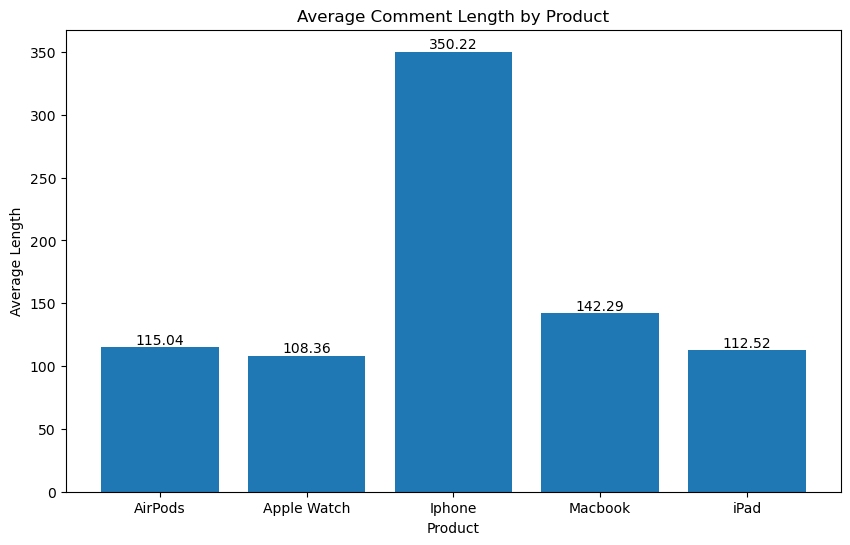

In [79]:
import matplotlib.pyplot as plt  # Import matplotlib for data visualization

# Calculate the average length of comments for each search term in the dataframe 'df'
average_lengths = df.groupby('Search')['Comment_Body'].apply(lambda x: x.str.len().mean()).reset_index()
# Rename the column from 'Comment_Body' to 'Average_Length' for clarity
average_lengths.rename(columns={'Comment_Body': 'Average_Length'}, inplace=True)

# Set up the figure size for the bar chart to be 10 inches wide and 6 inches tall
plt.figure(figsize=(10, 6))

# Create a bar chart, using 'Search' as the x-axis and 'Average_Length' as the height of the bars
bar_plot = plt.bar(average_lengths['Search'], average_lengths['Average_Length'])

# Loop through each average length value to add annotations on the bars
for i, value in enumerate(average_lengths['Average_Length']):
    # Annotate the bars with the average length values, formatted to two decimal places
    plt.annotate(f'{value:.2f}', xy=(i, value), ha='center', va='bottom')

# Set the label for the x-axis as 'Product'
plt.xlabel('Product')
# Set the label for the y-axis as 'Average Length'
plt.ylabel('Average Length')
# Add a title to the plot
plt.title('Average Comment Length by Product')

# Display the plot
plt.show()


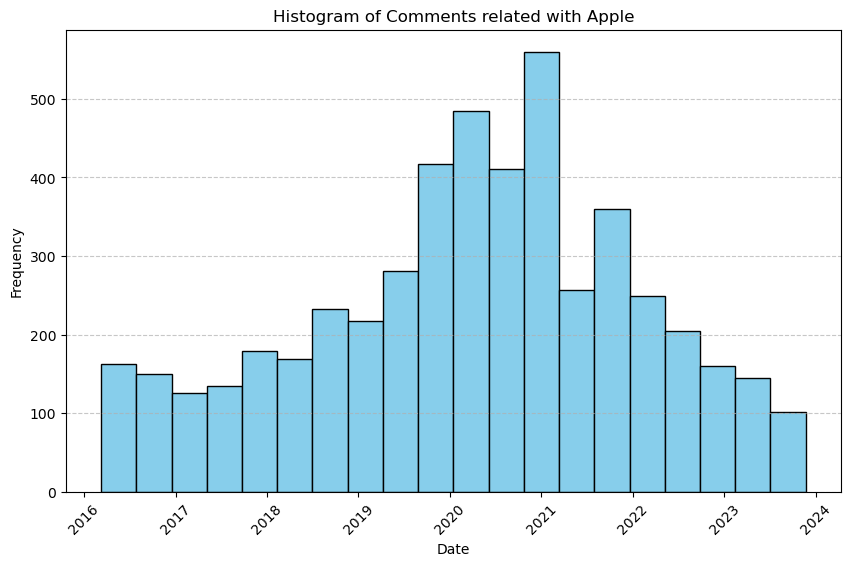

In [80]:
#Plot the histogram of comments by date, related with Apple
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
plt.hist(df['Date'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.title('Histogram of Comments related with Apple')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


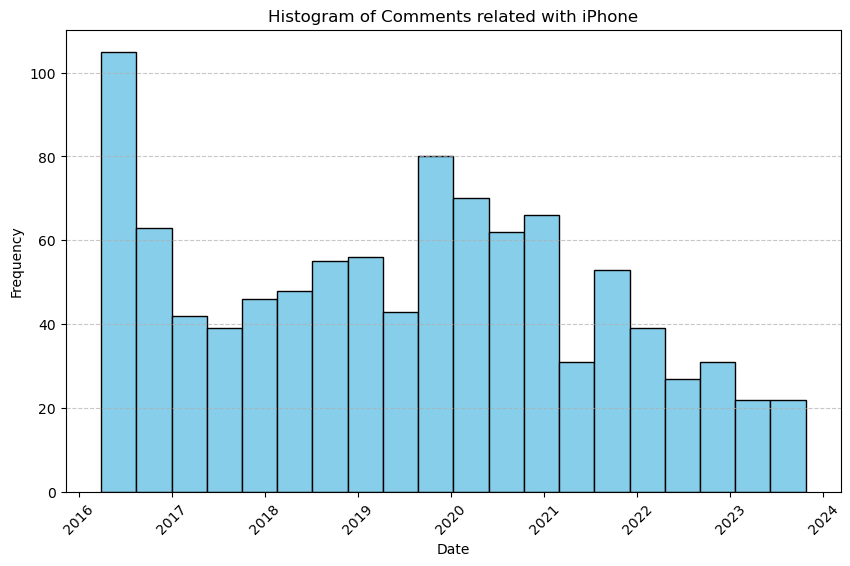

In [80]:
df_iphone = df[df['Search']=='Iphone']

plt.figure(figsize=(10, 6))  # Set the figure size (adjust as needed)
plt.hist(df_iphone['Date'], bins=20, color='skyblue', edgecolor='black')  # Adjust the number of bins as needed
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.title('Histogram of Comments related with iPhone')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines to y-axis
plt.show()



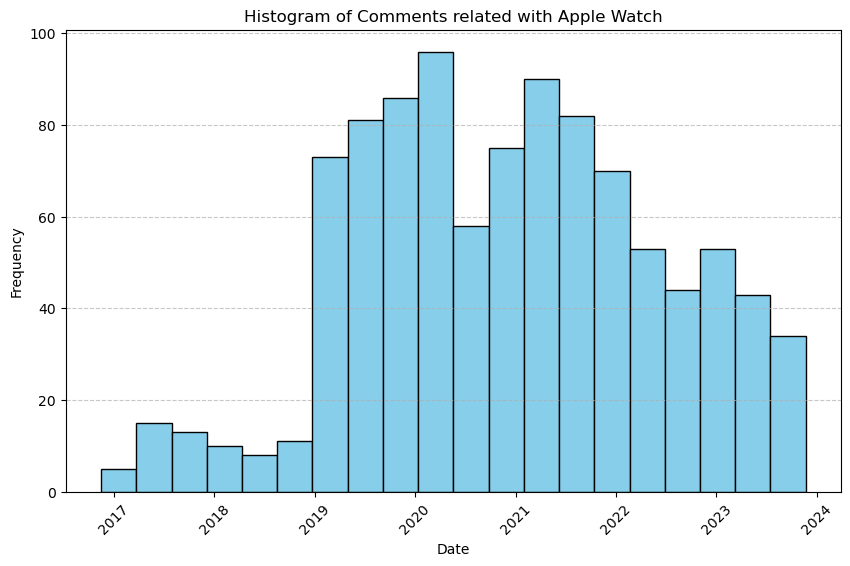

In [81]:
df_watch = df[df['Search']=='Apple Watch']

plt.figure(figsize=(10, 6))  # Set the figure size (adjust as needed)
plt.hist(df_watch['Date'], bins=20, color='skyblue', edgecolor='black')  # Adjust the number of bins as needed
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.title('Histogram of Comments related with Apple Watch')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines to y-axis
plt.show()



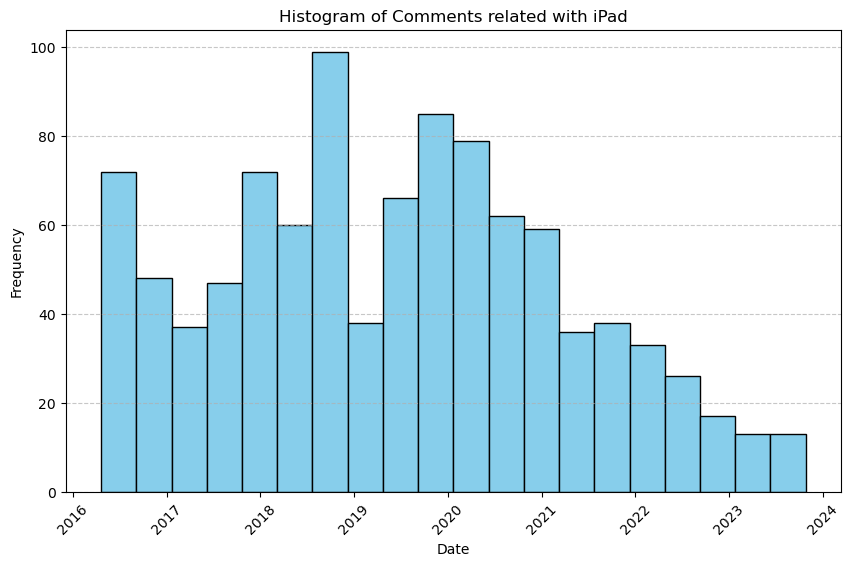

In [82]:
df_ipad = df[df['Search']=='iPad']

plt.figure(figsize=(10, 6))  # Set the figure size (adjust as needed)
plt.hist(df_ipad['Date'], bins=20, color='skyblue', edgecolor='black')  # Adjust the number of bins as needed
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.title('Histogram of Comments related with iPad')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines to y-axis
plt.show()



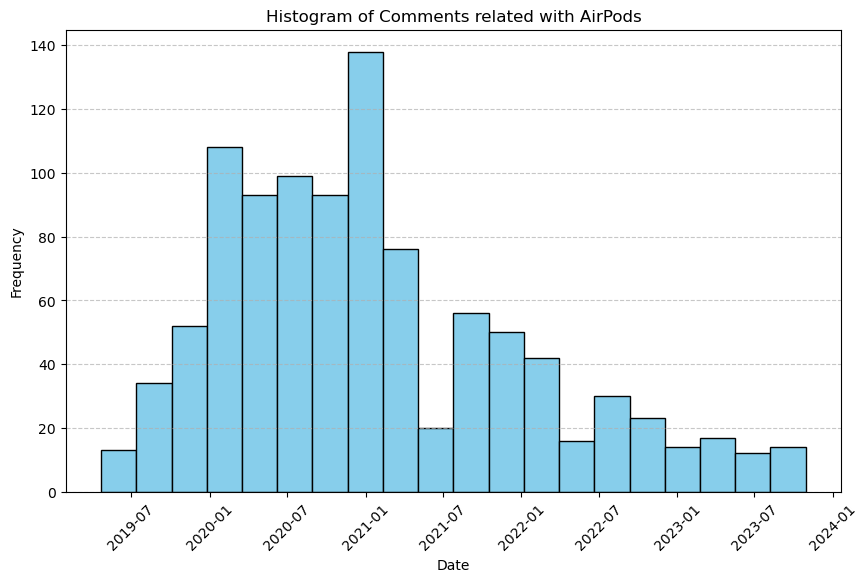

In [83]:
df_airpods = df[df['Search']=='AirPods']

plt.figure(figsize=(10, 6))  # Set the figure size (adjust as needed)
plt.hist(df_airpods['Date'], bins=20, color='skyblue', edgecolor='black')  # Adjust the number of bins as needed
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.title('Histogram of Comments related with AirPods')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines to y-axis
plt.show()



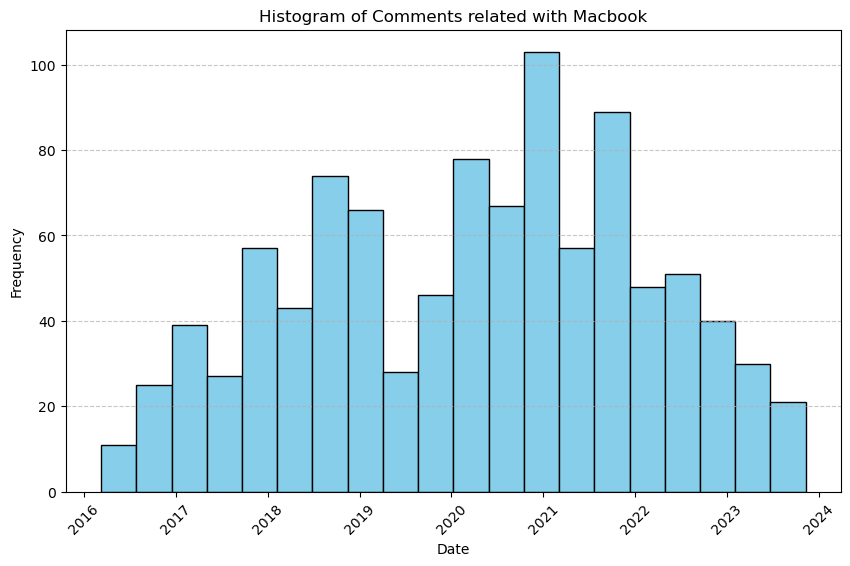

In [84]:
df_macbook = df[df['Search']=='Macbook']

plt.figure(figsize=(10, 6))  # Set the figure size (adjust as needed)
plt.hist(df_macbook['Date'], bins=20, color='skyblue', edgecolor='black')  # Adjust the number of bins as needed
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.title('Histogram of Comments related with Macbook')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines to y-axis
plt.show()



In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Search        5000 non-null   object        
 1   Condition     5000 non-null   object        
 2   Price         5000 non-null   object        
 3   Comment_Body  5000 non-null   object        
 4   Date          5000 non-null   datetime64[ns]
 5   Language      5000 non-null   object        
dtypes: datetime64[ns](1), object(5)
memory usage: 234.5+ KB


In [86]:
# Function to determine currency
def determine_currency(price):
    if '£' in price:
        return '£'
    elif '$' in price:
        return '$'
    elif 'EUR' in price:
        return '€'
    else:
        return 'unknown'

# Apply the function to the Price column
df['Currency'] = df['Price'].apply(determine_currency)

# Display the DataFrame
df

,Search,Condition,Price,Comment_Body,Date,Language,Currency
0,AirPods,pre-owned,£69.99 each,"Bought these for teenage daughter on eBay, sig...",2019-11-13,en,£
1,AirPods,pre-owned,£69.99 each,I bought these refurbished set of AirPods and ...,2020-05-28,en,£
2,AirPods,new,£139.99 each,Pros: sound quality is excellent if you can ge...,2020-01-22,en,£
3,AirPods,new,£139.99 each,"What a clever little set of earphones, without...",2020-09-07,en,£
4,AirPods,new,£139.99 each,The Apple AirPod Pro is a fantastic set of wir...,2021-10-13,en,£
...,...,...,...,...,...,...,...
4995,iPad,refurbished,£5.00,Brillant price and great ipad,2017-01-13,en,£
4996,iPad,pre-owned,£5.00,Fast delivery no cons perfect,2019-06-06,en,£
4997,iPad,bigdeals,US $149.99,Excellent tablet\nRecommend it,2022-03-13,en,$
4998,iPad,pre-owned,US $149.99,Product was very acceptable.,2022-02-15,en,$


In [87]:
df.Currency.value_counts()

£    3610
$    1388
€       2
Name: Currency, dtype: int64

In [88]:
df['Price'] = df['Price'].str.extract('(\d+\.\d+)').astype(float)
df

,Search,Condition,Price,Comment_Body,Date,Language,Currency
0,AirPods,pre-owned,69.99,"Bought these for teenage daughter on eBay, sig...",2019-11-13,en,£
1,AirPods,pre-owned,69.99,I bought these refurbished set of AirPods and ...,2020-05-28,en,£
2,AirPods,new,139.99,Pros: sound quality is excellent if you can ge...,2020-01-22,en,£
3,AirPods,new,139.99,"What a clever little set of earphones, without...",2020-09-07,en,£
4,AirPods,new,139.99,The Apple AirPod Pro is a fantastic set of wir...,2021-10-13,en,£
...,...,...,...,...,...,...,...
4995,iPad,refurbished,5.00,Brillant price and great ipad,2017-01-13,en,£
4996,iPad,pre-owned,5.00,Fast delivery no cons perfect,2019-06-06,en,£
4997,iPad,bigdeals,149.99,Excellent tablet\nRecommend it,2022-03-13,en,$
4998,iPad,pre-owned,149.99,Product was very acceptable.,2022-02-15,en,$


In [89]:
conversion_rates = {
    '$': 0.79, # USD to GBP
    '€': 0.86, # EUR to GBP
    '£': 1    # GBP to itself
}

# Conversion function
def convert_to_gbp(row):
    rate = conversion_rates[row['Currency']]
    return row['Price'] * rate

# Apply the function
df['Price_GBP(30Nov23)'] = df.apply(convert_to_gbp, axis=1)

df

,Search,Condition,Price,Comment_Body,Date,Language,Currency,Price_GBP(30Nov23)
0,AirPods,pre-owned,69.99,"Bought these for teenage daughter on eBay, sig...",2019-11-13,en,£,69.9900
1,AirPods,pre-owned,69.99,I bought these refurbished set of AirPods and ...,2020-05-28,en,£,69.9900
2,AirPods,new,139.99,Pros: sound quality is excellent if you can ge...,2020-01-22,en,£,139.9900
3,AirPods,new,139.99,"What a clever little set of earphones, without...",2020-09-07,en,£,139.9900
4,AirPods,new,139.99,The Apple AirPod Pro is a fantastic set of wir...,2021-10-13,en,£,139.9900
...,...,...,...,...,...,...,...,...
4995,iPad,refurbished,5.00,Brillant price and great ipad,2017-01-13,en,£,5.0000
4996,iPad,pre-owned,5.00,Fast delivery no cons perfect,2019-06-06,en,£,5.0000
4997,iPad,bigdeals,149.99,Excellent tablet\nRecommend it,2022-03-13,en,$,118.4921
4998,iPad,pre-owned,149.99,Product was very acceptable.,2022-02-15,en,$,118.4921


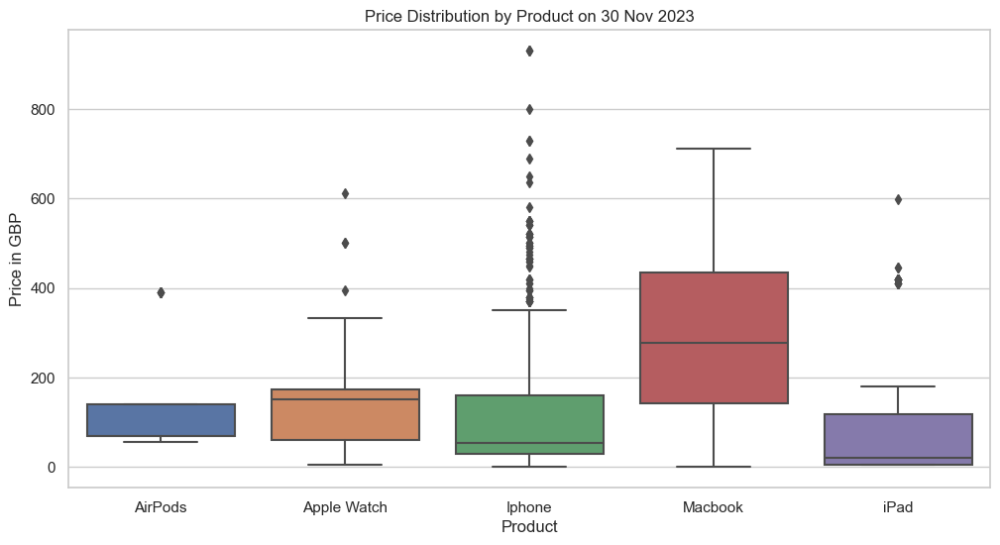

In [90]:
import seaborn as sns

# Set the style of the seaborn plot
sns.set(style="whitegrid")

# Create the boxplot
plt.figure(figsize=(12, 6))
boxplot = sns.boxplot(x='Search', y='Price_GBP(30Nov23)', data=df)

# Set the title and labels of the boxplot
boxplot.set_title('Price Distribution by Product on 30 Nov 2023')
boxplot.set_xlabel('Product')
boxplot.set_ylabel('Price in GBP')

# Show the plot
plt.show()


In [91]:
df.Condition.value_counts()

pre-owned             3334
new                   1271
refurbished            214
dealscaly               10
innofinity-worl...       9
                      ... 
londonmagicstore         1
ttr398                   1
repairoutletuk           1
simplybrandsdirect       1
inctabletselect...       1
Name: Condition, Length: 98, dtype: int64

In [92]:
df.loc[~df['Condition'].isin(['pre-owned', 'new', 'refurbished']), 'Condition'] = 'others'
df.Condition.value_counts()

pre-owned      3334
new            1271
refurbished     214
others          181
Name: Condition, dtype: int64

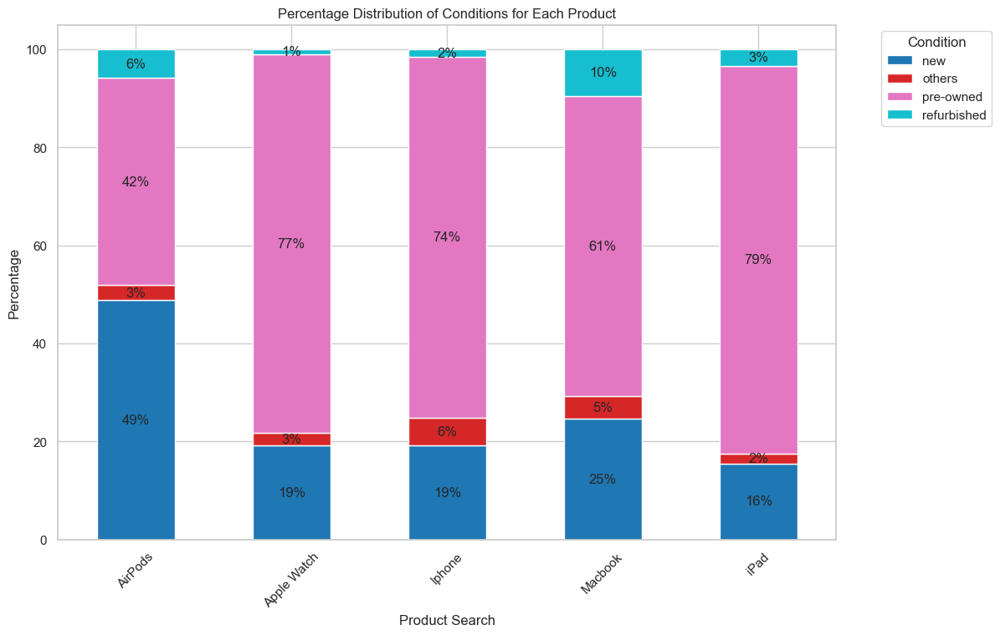

In [93]:
# Calculating the percentage distribution again
distribution = df.groupby(['Search', 'Condition']).size().unstack(fill_value=0)
distribution_percentage = distribution.div(distribution.sum(axis=1), axis=0) * 100

# Plotting with annotations
ax = distribution_percentage.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='tab10')

# Adding the legend outside of the plot
plt.legend(title='Condition', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adding the percentage text on the bars
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    if height > 0:
        ax.text(x+width/2, 
                y+height/2, 
                '{:.0f}%'.format(height), 
                ha='center',
                va='center')

plt.title('Percentage Distribution of Conditions for Each Product')
plt.xlabel('Product Search')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.show()


**7.Apply Contractions to fix the comments**

In [94]:
#Apply contractions to fix comments
import contractions
df['Fixed_Comment'] = df['Comment_Body'].apply(contractions.fix)
df[df['Fixed_Comment'] != df['Comment_Body']][8:]

,Search,Condition,Price,Comment_Body,Date,Language,Currency,Price_GBP(30Nov23),Fixed_Comment
12,AirPods,pre-owned,69.99,"Comfortable and lightweight, with good sound q...",2021-05-19,en,£,69.99,"Comfortable and lightweight, with good sound q..."
13,AirPods,new,139.99,The AirPods Pro I was very disappointed in th...,2020-02-12,en,£,139.99,The AirPods Pro I was very disappointed in th...
15,AirPods,pre-owned,139.99,They fit well. They don't drop out. They pair ...,2022-09-13,en,£,139.99,They fit well. They do not drop out. They pair...
16,AirPods,new,139.99,"They’re amazing earphones, they connected easi...",2020-12-02,en,£,139.99,"They are amazing earphones, they connected eas..."
17,AirPods,new,139.99,So so pleased I took the plunge. Own the Gen 2...,2020-04-22,en,£,139.99,So so pleased I took the plunge. Own the Gen 2...
...,...,...,...,...,...,...,...,...,...
4920,iPad,pre-owned,5.00,Can’t upload any apps whatsoever 😢,2020-02-12,en,£,5.00,Cannot upload any apps whatsoever 😢
4922,iPad,pre-owned,21.00,It’s everything it’s meant to be x,2018-12-19,en,£,21.00,It is everything it is meant to be x
4933,iPad,pre-owned,12.50,Good pad but didnt like sim card,2020-06-11,en,£,12.50,Good pad but did not like sim card
4981,iPad,new,114.00,It’s Apple great product 10/10,2023-08-29,en,£,114.00,It is Apple great product 10/10


**8. Patterns Substitution**

In [95]:
#Substitute patterns
import re

price_pattern = r'\$\d+(\.\d{2})?'
size_pattern = r'\b\d+(?:\.\d+)?(?:x\d+(?:\.\d+)?)?\b'
volume_pattern = r'\b\d+(?:\.\d+)?\s*[Ll]\b'
weight_pattern = r'\b\d+(?:\.\d+)?\s*[Kk][Gg]\b'

def substitute_patterns(text):
    text = re.sub(price_pattern, '[PRICE]', text)
    text = re.sub(size_pattern, '[SIZE]', text)
    text = re.sub(volume_pattern, '[VOLUME]', text)
    text = re.sub(weight_pattern, '[WEIGHT]', text)
    return text

df['Substituted_Comment'] = df['Fixed_Comment'].apply(substitute_patterns)
df[df['Substituted_Comment'] != df['Fixed_Comment']][['Comment_Body','Substituted_Comment']][1:]

,Comment_Body,Substituted_Comment
2,Pros: sound quality is excellent if you can ge...,Pros: sound quality is excellent if you can ge...
5,"Arrived later than date specified, but within ...","Arrived later than date specified, but within ..."
7,"airpods are brilliant, I get at least 5 hours ...","airpods are brilliant, I get at least [SIZE] h..."
8,All round good products and am happy to have b...,All round good products and am happy to have b...
9,Working generally good but not 100 % compatibi...,Working generally good but not [SIZE] % compat...
...,...,...
4844,Del as stated ... excellent condition 5*,Del as stated ... excellent condition [SIZE]*
4857,Faster and clearer than my old series 3,Faster and clearer than my old series [SIZE]
4955,preforms great at 1/2 the price,preforms great at [SIZE]/[SIZE] the price
4978,"100%,works well and good value","[SIZE]%,works well and good value"


**9. Http links replacement**

In [96]:
#Replace http links
link_pattern = r'https?://\S+'

def substitute_links(text):
    return re.sub(link_pattern, '[LINK]', text)

df['Replaced_Comment'] = df['Substituted_Comment'].apply(substitute_links)
df[df['Substituted_Comment'] != df['Replaced_Comment']][['Comment_Body','Replaced_Comment']]

,Comment_Body,Replaced_Comment


In [97]:
#Filter out the comments, which may only consists of link
df = df[df["Replaced_Comment"]!="[[LINK]"]
df = df[df["Replaced_Comment"]!="[LINK]"]
df = df[df["Replaced_Comment"]!="&#x200B;\n\n[LINK]"]
df.Search.value_counts()


AirPods        1000
Apple Watch    1000
Iphone         1000
Macbook        1000
iPad           1000
Name: Search, dtype: int64

**10. Remove Line Breaks**

In [98]:
#Remove line breaks
def remove_line_breaks(text):
    return text.replace('\n', ' ')

df['Without_LineBreaks'] = df['Replaced_Comment'].apply(remove_line_breaks)

df[df['Replaced_Comment'] != df['Without_LineBreaks']][['Comment_Body','Without_LineBreaks']]


,Comment_Body,Without_LineBreaks
0,"Bought these for teenage daughter on eBay, sig...","Bought these for teenage daughter on eBay, sig..."
1,I bought these refurbished set of AirPods and ...,I bought these refurbished set of AirPods and ...
2,Pros: sound quality is excellent if you can ge...,Pros: sound quality is excellent if you can ge...
3,"What a clever little set of earphones, without...","What a clever little set of earphones, without..."
4,The Apple AirPod Pro is a fantastic set of wir...,The Apple AirPod Pro is a fantastic set of wir...
...,...,...
4739,battery good\ndisplay good\npackaging good\nli...,battery good display good packaging good like new
4746,Good iPad\nEasy to carry every where\nLight we...,Good iPad Easy to carry every where Light weight
4868,the best deal.\ngood tablet.\nThank you.,the best deal. good tablet. Thank you.
4988,Looks like new one\nThank you!,Looks like new one Thank you!


**12. Apply TextBlob to correct comments**

In [99]:
#Apply TextBlob to correct comments
from textblob import TextBlob

def correct_comment(comment):
    blob = TextBlob(comment)
    corrected_comment = blob.correct()
    return str(corrected_comment)

df['Corrected_Comment(SentimentAnalysis)'] = df['Without_LineBreaks'].apply(correct_comment)
df[df['Without_LineBreaks'] != df['Corrected_Comment(SentimentAnalysis)']][['Comment_Body','Corrected_Comment(SentimentAnalysis)']][2:12]


,Comment_Body,Corrected_Comment(SentimentAnalysis)
2,Pros: sound quality is excellent if you can ge...,Gros: sound quality is excellent if you can ge...
3,"What a clever little set of earphones, without...","That a clever little set of earphones, without..."
4,The Apple AirPod Pro is a fantastic set of wir...,The Apple AirPod Fro is a fantastic set of tir...
5,"Arrived later than date specified, but within ...","Arrived later than date specified, but within ..."
6,"These are decent headphones, reasonably comfor...","These are decent headphones, reasonably comfor..."
7,"airpods are brilliant, I get at least 5 hours ...","airport are brilliant, I get at least [SIZE] h..."
8,All round good products and am happy to have b...,All round good products and am happy to have b...
9,Working generally good but not 100 % compatibi...,Working generally good but not [SIZE] % incomp...
11,This item did not behave at all as expected. W...,His item did not behave at all as expected. Wh...
12,"Comfortable and lightweight, with good sound q...","Comfortable and lightweight, with good sound q..."


In [100]:
#Check the comments
df[df['Without_LineBreaks'] != df['Corrected_Comment(SentimentAnalysis)']][['Comment_Body','Corrected_Comment(SentimentAnalysis)']][90:100]


,Comment_Body,Corrected_Comment(SentimentAnalysis)
95,Bought these as an upgrade to my 1st gens but ...,Ought these as an upgrade to my st guns but tu...
97,"I already use wired apple buds,but these are f...","I already use wired apple buds,but these are f..."
99,Was a good and cheap addition whej I lost my A...,Was a good and cheap addition when I lost my A...
100,was unsure if they would be worth the money at...,was ensure if they would be worth the money at...
102,"Bought these pods for my daughter, there the l...","Ought these pads for my daughter, there the la..."
103,"In my opinion a very good headphone, comfortab...","In my opinion a very good headphone, comfortab..."
104,The AirPods give you freedom from your iPhone ...,The AirPods give you freedom from your shone y...
105,The sound quality surpasses all expectations\n...,The sound quality surpassed all expectations I...
106,I don’t have reception in some areas of the ho...,I do not have reception in some areas of the h...
107,"Honestly these airpods are unbelievable, save ...","Honestly these airport are unbelievable, save ..."


In [101]:
#Apply TextBlob to comments with some exceptions
words_to_keep = ['Apple', 'iPhone', 'Macbook', 'AirPods', 'iPad', 'Watch', 'My', 'tech', 'stats', 'She', 'kids',
                 'Shot', 'Powered', 'Max', 'giga', 'omega', 'gamma', 'sigma', 'If', 'Just', 'lossless', 'Pro', 
                 'This', 'Hey', 'Here', 'airpods', 'mic', 'audio', 'Pros', 'airpod', 'Max', 'Hi', 'fake', 'probuds', 
                 'mum', 'My', 'Cool', 'Bro', 'So', 'No', 'Do', 'Yoda', 'pods', 'Bought', 'What', 'To', 'Do',
                 'transparency', 'laptop']
lowercase_words_to_keep = {word.lower() for word in words_to_keep}

def correct_comment(row):
    preserved_punctuations = set(['.', ',', '!', '?', ':', ';'])
    words = re.findall(r'\w+|[^\w\s]', row)

    # Check against the lowercase version of the words
    processed_words = [word if word.lower() in lowercase_words_to_keep or word in preserved_punctuations else str(TextBlob(word).correct()) for word in words]

    return ' '.join(processed_words)

df['Corrected_Comment(SentimentAnalysis)'] = df['Without_LineBreaks'].apply(correct_comment)
df[df['Without_LineBreaks'] != df['Corrected_Comment(SentimentAnalysis)']][['Comment_Body', 'Corrected_Comment(SentimentAnalysis)']][323:]

,Comment_Body,Corrected_Comment(SentimentAnalysis)
331,The cheapest price for the AirPod pros I have ...,The cheapest price for the AirPod pros I have ...
333,Definitely recommend\nAbsolutely brilliant val...,Definitely recommend Absolutely brilliant valu...
334,Excellent product as usual from Apple connect ...,Excellent product as usual from Apple connect ...
335,"Having noise cancelling, true sound and amazin...","Having noise concealing , true sound and amazi..."
336,They are great to use and quality sound which ...,They are great to use and quality sound which ...
...,...,...
4991,This iPad is one of the best!,This iPad is one of the best !
4994,Fantastic product!! Thank you,Fantastic product ! ! Thank you
4995,Brillant price and great ipad,Brilliant price and great ipad
4996,Fast delivery no cons perfect,Last delivery no sons perfect


**12.Add a common case stage**

In [102]:
#Add a common case stage
df['Lower_Comment'] = df['Corrected_Comment(SentimentAnalysis)'].str.lower()
df[['Comment_Body', 'Lower_Comment']]


,Comment_Body,Lower_Comment
0,"Bought these for teenage daughter on eBay, sig...","bought these for teenage daughter on may , sig..."
1,I bought these refurbished set of AirPods and ...,i bought these refurbished set of airpods and ...
2,Pros: sound quality is excellent if you can ge...,pros : sound quality is excellent if you can g...
3,"What a clever little set of earphones, without...","what a clever little set of earphones , withou..."
4,The Apple AirPod Pro is a fantastic set of wir...,the apple airpod pro is a fantastic set of tir...
...,...,...
4995,Brillant price and great ipad,brilliant price and great ipad
4996,Fast delivery no cons perfect,last delivery no sons perfect
4997,Excellent tablet\nRecommend it,excellent tablet recommend it
4998,Product was very acceptable.,product was very acceptable .


**13. Tokenization**

In [103]:
#Apply tokenization
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize

nltk.download('punkt')

def tokenize_text(text):
    sentences = sent_tokenize(text)
    words = [word_tokenize(sentence) for sentence in sentences]
    return ' '.join([' '.join(sentence) for sentence in words]) 

df['Tokenized_Comment'] = df['Lower_Comment'].apply(tokenize_text)
df[df['Tokenized_Comment'] != df['Lower_Comment']][['Lower_Comment', 'Tokenized_Comment']]

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


,Lower_Comment,Tokenized_Comment
0,"bought these for teenage daughter on may , sig...","bought these for teenage daughter on may , sig..."
1,i bought these refurbished set of airpods and ...,i bought these refurbished set of airpods and ...
5,"arrived later than date specified , but within...","arrived later than date specified , but within..."
18,these arrived this morning and i set them up w...,these arrived this morning and i set them up w...
21,absolutely amazing . small issue is that they ...,absolutely amazing . small issue is that they ...
...,...,...
4619,"wanted the pad for use with "" on song "" pp . t...",wanted the pad for use with `` on song `` pp ....
4672,being able to get goose search . cannot down l...,being able to get goose search . can not down ...
4790,"cannot fault it , excellent condition , perfect 😊","can not fault it , excellent condition , perfe..."
4920,cannot unload any apes whatsoever 😢,can not unload any apes whatsoever 😢


**14. Remove the stopwords**

In [104]:
#Remove the stopwords
from nltk.corpus import stopwords

def remove_stopwords_except_not(text):
    stop_words = set(stopwords.words('english'))
    stop_words.remove("not")
    words = text.split()
    filtered_words = [word for word in words if word.lower() not in stop_words]
    return ' '.join(filtered_words)

df['Without_Stopwords'] = df['Tokenized_Comment'].apply(remove_stopwords_except_not)
df[df['Tokenized_Comment'] != df['Without_Stopwords']][['Tokenized_Comment', 'Without_Stopwords']]


,Tokenized_Comment,Without_Stopwords
0,"bought these for teenage daughter on may , sig...","bought teenage daughter may , significantly rr..."
1,i bought these refurbished set of airpods and ...,bought refurbished set airpods must say blown ...
2,pros : sound quality is excellent if you can g...,pros : sound quality excellent get good seal e...
3,"what a clever little set of earphones , withou...","clever little set earphones , without music no..."
4,the apple airpod pro is a fantastic set of tir...,apple airpod pro fantastic set tireless headph...
...,...,...
4995,brilliant price and great ipad,brilliant price great ipad
4996,last delivery no sons perfect,last delivery sons perfect
4997,excellent tablet recommend it,excellent tablet recommend
4998,product was very acceptable .,product acceptable .


**15. Remove emojis, punctations**

In [105]:
#Remove emojis and punctations
import string

def remove_emojis(text):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # Emoticons
                               u"\U0001F300-\U0001F5FF"  # Symbols & Pictographs
                               u"\U0001F680-\U0001F6FF"  # Transport & Map Symbols
                               u"\U0001F700-\U0001F77F"  # Alchemical Symbols
                               u"\U0001F780-\U0001F7FF"  # Geometric Shapes Extended
                               u"\U0001F800-\U0001F8FF"  # Supplemental Arrows-C
                               u"\U0001F900-\U0001F9FF"  # Supplemental Symbols and Pictographs
                               u"\U0001FA00-\U0001FA6F"  # Chess Symbols
                               u"\U0001FA70-\U0001FAFF"  # Symbols and Pictographs Extended-A
                               u"\U00002702-\U000027B0"  # Dingbats
                               u"\U000024C2-\U0001F251" 
                               "]+")
    return emoji_pattern.sub(r'', text)

def remove_punctuation_and_quotes(text):
    custom_punctuation = string.punctuation + '"' + "“"
    return text.translate(str.maketrans('', '', custom_punctuation))

df['Prepared_Comment'] = df['Without_Stopwords'].apply(remove_emojis)
df['Prepared_Comment'] = df['Prepared_Comment'].apply(remove_punctuation_and_quotes)

df[df['Prepared_Comment'] != df['Without_Stopwords']][['Comment_Body', 'Prepared_Comment']][1240:]

,Comment_Body,Prepared_Comment
1466,Great watch for the time.\nShould have held ou...,great watch time held got newer model bad
1467,Pleasure to deal with and solved a minor probl...,pleasure deal solved minor problem instantly ...
1468,Brand new item well worth the price would defi...,grand new item well worth price would definite...
1469,Watch is flawless and works great. I could not...,watch lawless works great could not happier p...
1470,"Great price, watch is like new. Posted and del...",great price watch like new posted delivered ...
...,...,...
4988,Looks like new one\nThank you!,looks like new one thank
4989,Item is as good as described.,stem good described
4991,This iPad is one of the best!,ipad one best
4994,Fantastic product!! Thank you,fantastic product thank


**16. Apply lemmatisation**

In [106]:
#Apply lemmatisation
from nltk.stem import WordNetLemmatizer

nltk.download('omw-1.4')
nltk.download('wordnet')

lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    stop_words = set(stopwords.words('english'))
    words = word_tokenize(text)
    filtered_words = [word for word in words if word.lower() not in stop_words]
    lemmatized_words = [lemmatizer.lemmatize(word) for word in filtered_words]
    return ' '.join(lemmatized_words)

df['Lemmatized_Comment'] = df['Prepared_Comment'].apply(preprocess_text)
df[df['Lemmatized_Comment'] != df['Prepared_Comment']][['Prepared_Comment', 'Lemmatized_Comment']][:]

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,Prepared_Comment,Lemmatized_Comment
0,bought teenage daughter may significantly rrp...,bought teenage daughter may significantly rrp ...
1,bought refurbished set airpods must say blown ...,bought refurbished set airpods must say blown ...
2,pros sound quality excellent get good seal ea...,pro sound quality excellent get good seal ear ...
3,clever little set earphones without music noi...,clever little set earphone without music noise...
4,apple airpod pro fantastic set tireless headph...,apple airpod pro fantastic set tireless headph...
...,...,...
4993,well not load face time,well load face time
4994,fantastic product thank,fantastic product thank
4996,last delivery sons perfect,last delivery son perfect
4998,product acceptable,product acceptable


**17. Remove the unnecessary columns**

In [107]:
#Drop the unnecessary columns
df = df[['Search', 'Price', 'Condition',  'Comment_Body', 'Lemmatized_Comment', 'Corrected_Comment(SentimentAnalysis)', 'Price_GBP(30Nov23)']]
df


,Search,Price,Condition,Comment_Body,Lemmatized_Comment,Corrected_Comment(SentimentAnalysis),Price_GBP(30Nov23)
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.9900
1,AirPods,69.99,pre-owned,I bought these refurbished set of AirPods and ...,bought refurbished set airpods must say blown ...,I bought these refurbished set of AirPods and ...,69.9900
2,AirPods,139.99,new,Pros: sound quality is excellent if you can ge...,pro sound quality excellent get good seal ear ...,Pros : sound quality is excellent if you can g...,139.9900
3,AirPods,139.99,new,"What a clever little set of earphones, without...",clever little set earphone without music noise...,"What a clever little set of earphones , withou...",139.9900
4,AirPods,139.99,new,The Apple AirPod Pro is a fantastic set of wir...,apple airpod pro fantastic set tireless headph...,The Apple AirPod Pro is a fantastic set of tir...,139.9900
...,...,...,...,...,...,...,...
4995,iPad,5.00,refurbished,Brillant price and great ipad,brilliant price great ipad,Brilliant price and great ipad,5.0000
4996,iPad,5.00,pre-owned,Fast delivery no cons perfect,last delivery son perfect,Last delivery no sons perfect,5.0000
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921
4998,iPad,149.99,pre-owned,Product was very acceptable.,product acceptable,Product was very acceptable .,118.4921


**18. Rename the columns**

In [108]:
#Rename the columns
df.rename(columns={'Comment_Body': 'Comment', 'Lemmatized_Comment': 'Cleaned_Comment',
                   'Corrected_Comment(SentimentAnalysis)': 'Sentiment_Comment'}, inplace=True)
df

,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23)
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.9900
1,AirPods,69.99,pre-owned,I bought these refurbished set of AirPods and ...,bought refurbished set airpods must say blown ...,I bought these refurbished set of AirPods and ...,69.9900
2,AirPods,139.99,new,Pros: sound quality is excellent if you can ge...,pro sound quality excellent get good seal ear ...,Pros : sound quality is excellent if you can g...,139.9900
3,AirPods,139.99,new,"What a clever little set of earphones, without...",clever little set earphone without music noise...,"What a clever little set of earphones , withou...",139.9900
4,AirPods,139.99,new,The Apple AirPod Pro is a fantastic set of wir...,apple airpod pro fantastic set tireless headph...,The Apple AirPod Pro is a fantastic set of tir...,139.9900
...,...,...,...,...,...,...,...
4995,iPad,5.00,refurbished,Brillant price and great ipad,brilliant price great ipad,Brilliant price and great ipad,5.0000
4996,iPad,5.00,pre-owned,Fast delivery no cons perfect,last delivery son perfect,Last delivery no sons perfect,5.0000
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921
4998,iPad,149.99,pre-owned,Product was very acceptable.,product acceptable,Product was very acceptable .,118.4921


**19. Check the na rows**

In [109]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Search              5000 non-null   object 
 1   Price               5000 non-null   float64
 2   Condition           5000 non-null   object 
 3   Comment             5000 non-null   object 
 4   Cleaned_Comment     5000 non-null   object 
 5   Sentiment_Comment   5000 non-null   object 
 6   Price_GBP(30Nov23)  5000 non-null   float64
dtypes: float64(2), object(5)
memory usage: 312.5+ KB


**20. Calculate the length**

In [110]:
df['Length'] = df['Comment'].apply(len)
df

,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.9900,1971
1,AirPods,69.99,pre-owned,I bought these refurbished set of AirPods and ...,bought refurbished set airpods must say blown ...,I bought these refurbished set of AirPods and ...,69.9900,1106
2,AirPods,139.99,new,Pros: sound quality is excellent if you can ge...,pro sound quality excellent get good seal ear ...,Pros : sound quality is excellent if you can g...,139.9900,846
3,AirPods,139.99,new,"What a clever little set of earphones, without...",clever little set earphone without music noise...,"What a clever little set of earphones , withou...",139.9900,782
4,AirPods,139.99,new,The Apple AirPod Pro is a fantastic set of wir...,apple airpod pro fantastic set tireless headph...,The Apple AirPod Pro is a fantastic set of tir...,139.9900,773
...,...,...,...,...,...,...,...,...
4995,iPad,5.00,refurbished,Brillant price and great ipad,brilliant price great ipad,Brilliant price and great ipad,5.0000,29
4996,iPad,5.00,pre-owned,Fast delivery no cons perfect,last delivery son perfect,Last delivery no sons perfect,5.0000,29
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921,29
4998,iPad,149.99,pre-owned,Product was very acceptable.,product acceptable,Product was very acceptable .,118.4921,28


In [111]:
df

,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.9900,1971
1,AirPods,69.99,pre-owned,I bought these refurbished set of AirPods and ...,bought refurbished set airpods must say blown ...,I bought these refurbished set of AirPods and ...,69.9900,1106
2,AirPods,139.99,new,Pros: sound quality is excellent if you can ge...,pro sound quality excellent get good seal ear ...,Pros : sound quality is excellent if you can g...,139.9900,846
3,AirPods,139.99,new,"What a clever little set of earphones, without...",clever little set earphone without music noise...,"What a clever little set of earphones , withou...",139.9900,782
4,AirPods,139.99,new,The Apple AirPod Pro is a fantastic set of wir...,apple airpod pro fantastic set tireless headph...,The Apple AirPod Pro is a fantastic set of tir...,139.9900,773
...,...,...,...,...,...,...,...,...
4995,iPad,5.00,refurbished,Brillant price and great ipad,brilliant price great ipad,Brilliant price and great ipad,5.0000,29
4996,iPad,5.00,pre-owned,Fast delivery no cons perfect,last delivery son perfect,Last delivery no sons perfect,5.0000,29
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921,29
4998,iPad,149.99,pre-owned,Product was very acceptable.,product acceptable,Product was very acceptable .,118.4921,28


In [112]:
# Function to determine the price segment based on the given price and median price.
def price_segment(price, median):
    return "Expensive" if price > median else "Cheap"

# Filtering the DataFrame for iPad products and categorizing them into new and secondhand.
df_ipad = df[df['Search'] == 'iPad']
df_ipad_secondhand = df[(df['Search'] == 'iPad') & (df['Condition'] != 'new')]
df_ipad_new = df[(df['Search'] == 'iPad') & (df['Condition'] == 'new')]

# Calculating the median price for iPad products.
median_price_ipad = df_ipad['Price_GBP(30Nov23)'].median()

# Applying the 'price_segment' function to create a new 'Price_Segment' column in the iPad DataFrame.
df_ipad['Price_Segment'] = df_ipad['Price_GBP(30Nov23)'].apply(lambda x: price_segment(x, median_price_ipad))

# Creating separate DataFrames for expensive and cheap iPad products based on the 'Price_Segment'.
df_ipad_expensive = df_ipad[df_ipad['Price_Segment'] == 'Expensive']
df_ipad_cheap = df_ipad[df_ipad['Price_Segment'] == 'Cheap']

# Repeating the process for iPhone products.
df_iphone = df[df['Search'] == 'Iphone']
df_iphone_secondhand = df[(df['Search'] == 'Iphone') & (df['Condition'] != 'new')]
df_iphone_new = df[(df['Search'] == 'Iphone') & (df['Condition'] == 'new')]
median_price_iphone = df_iphone['Price_GBP(30Nov23)'].median()
df_iphone['Price_Segment'] = df_iphone['Price_GBP(30Nov23)'].apply(lambda x: price_segment(x, median_price_iphone))
df_iphone_expensive = df_iphone[df_iphone['Price_Segment'] == 'Expensive']
df_iphone_cheap = df_iphone[df_iphone['Price_Segment'] == 'Cheap']

# Repeating the process for Apple Watch products.
df_watch = df[df['Search'] == 'Apple Watch']
df_watch_secondhand = df[(df['Search'] == 'Apple Watch') & (df['Condition'] != 'new')]
df_watch_new = df[(df['Search'] == 'Apple Watch') & (df['Condition'] == 'new')]
median_price_watch = df_watch['Price_GBP(30Nov23)'].median()
df_watch['Price_Segment'] = df_watch['Price_GBP(30Nov23)'].apply(lambda x: price_segment(x, median_price_watch))
df_watch_expensive = df_watch[df_watch['Price_Segment'] == 'Expensive']
df_watch_cheap = df_watch[df_watch['Price_Segment'] == 'Cheap']

# Repeating the process for AirPods products.
df_airpods = df[df['Search'] == 'AirPods']
df_airpods_secondhand = df[(df['Search'] == 'AirPods') & (df['Condition'] != 'new')]
df_airpods_new = df[(df['Search'] == 'AirPods') & (df['Condition'] == 'new')]
median_price_airpods = df_airpods['Price_GBP(30Nov23)'].median()
df_airpods['Price_Segment'] = df_airpods['Price_GBP(30Nov23)'].apply(lambda x: price_segment(x, median_price_airpods))
df_airpods_expensive = df_airpods[df_airpods['Price_Segment'] == 'Expensive']
df_airpods_cheap = df_airpods[df_airpods['Price_Segment'] == 'Cheap']

# Repeating the process for MacBook products.
df_mac = df[df['Search'] == 'Macbook']
df_mac_secondhand = df[(df['Search'] == 'Macbook') & (df['Condition'] != 'new')]
df_mac_new = df[(df['Search'] == 'Macbook') & (df['Condition'] == 'new')]
median_price_mac = df_mac['Price_GBP(30Nov23)'].median()
df_mac['Price_Segment'] = df_mac['Price_GBP(30Nov23)'].apply(lambda x: price_segment(x, median_price_mac))
df_mac_expensive = df_mac[df_mac['Price_Segment'] == 'Expensive']
df_mac_cheap = df_mac[df_mac['Price_Segment'] == 'Cheap']


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/395180563.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad['Price_Segment'] = df_ipad['Price_GBP(30Nov23)'].apply(lambda x: price_segment(x, median_price_ipad))
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/395180563.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone['Price_Segment'] = df_iphone['Price_GBP(30Nov23)'].apply(lambda x: price_segment(x, median_price_iphone))
/var/folders/_k/_rt6thqx6mj63rx

In [113]:
df.Length.describe()

count    5000.000000
mean      165.683600
std       170.728664
min        25.000000
25%        56.000000
50%       103.000000
75%       232.000000
max      3078.000000
Name: Length, dtype: float64

In [114]:
df.Length.mode()

0    41
Name: Length, dtype: int64

In [115]:
df.sort_values(by='Length', ascending=False).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length
3000,Macbook,0.00,others,"The 2019 MacBook Pro 16"" that I received was e...",size macbook pro size received exactly describ...,"The [ SIZE ] MacBook Pro [ SIZE ] "" that I rec...",0.00,3078
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.99,1971
2000,Iphone,183.00,pre-owned,I've owned and used an iPhone 6S (standard siz...,owned used iphone standard size since came alm...,I have owned and used an iPhone Of ( standard ...,183.00,1921
2001,Iphone,159.99,new,The 2016 iPhone SE is one of the best products...,size iphone one best product apple ever made c...,The [ SIZE ] iPhone of is one of the best prod...,159.99,1534
2002,Iphone,5.00,pre-owned,This is my first smartphone and because I am a...,first smartphone skinflint old unlocked model ...,This is my first smartphone and because I am a...,5.00,1478
2003,Iphone,339.99,pre-owned,My wife likes to hang onto things and is not o...,wife like hang onto thing one unnecessary chan...,My wife likes to hang onto things and is not o...,339.99,1417
3001,Macbook,550.00,new,"Best value for money, not just from apple, but...",west value money apple compared existing lapto...,"West value for money , not just from apple , b...",434.50,1415
1000,Apple Watch,16.00,pre-owned,"A computer on your wrist. Apple high quality, ...",computer wrist apple high quality reliable one...,A computer on your wrist . Apple high quality ...,16.00,1366
2004,Iphone,159.99,pre-owned,For the age of the phone It Is Quick and very ...,age phone quick unfordable able run latest sof...,For the age of the phone It Is Quick and very ...,159.99,1366
2005,Iphone,5.00,pre-owned,"My other phone is a 6"" android with a better b...",phone size andros better battery easy back sin...,"My other phone is a [ SIZE ] "" andros with a b...",5.00,1342


In [116]:
df.sort_values(by='Length', ascending=True).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length
3999,Macbook,159.99,pre-owned,Very happy with my laptop,happy laptop,Very happy with my laptop,159.99,25
3997,Macbook,159.99,pre-owned,Good quality for the price,good quality price,Good quality for the price,159.99,26
3992,Macbook,200.00,pre-owned,Great Outstanding Hardware,great outstanding hardware,Great Outstanding Hardware,158.00,26
3993,Macbook,550.00,new,"Perfect, thanks so much!!!",perfect thanks much,"Perfect , thanks so much ! ! !",434.50,26
3998,Macbook,550.00,new,Brand new and came quickly,grand new came quickly,Grand new and came quickly,434.50,26
3995,Macbook,850.00,new,Apple the best of the best,apple best best,Apple the best of the best,671.50,26
3996,Macbook,900.00,pre-owned,great color and protection,great color protection,great color and protection,711.00,26
3994,Macbook,0.00,pre-owned,Oh my gawd. It is so nice!,oh nice,Oh my and . It is so nice !,0.00,26
3977,Macbook,250.00,pre-owned,good quality and very light,good quality light,good quality and very light,250.00,27
3978,Macbook,550.00,new,Best Laptop for good price!,west laptop good price,West Laptop for good price !,434.50,27


In [117]:
df_ipad.sort_values(by='Length', ascending=False).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
4000,iPad,410.00,pre-owned,Good product but still very pricey! The ipad a...,good product still price ipad air better chip ...,Good product but still very prices ! The ipad ...,410.0000,1284,Expensive
4001,iPad,21.00,pre-owned,"My iPad 2 was getting slow thanks, probably, t...",ipad size getting slow thanks probably later a...,"My iPad [ SIZE ] was getting slow thanks , pro...",21.0000,1163,Cheap
4002,iPad,5.00,pre-owned,My only criticism is that the charging lead in...,criticism charging lead picture suggests newer...,My only criticism is that the charging lead in...,5.0000,1011,Cheap
4003,iPad,149.99,pre-owned,So I just opened the box and unwrapped my new ...,opened box unwrapped new ipad first look ipad ...,So I just opened the box and unwrapped my new ...,118.4921,938,Expensive
4004,iPad,21.00,pre-owned,"The IPAD AIR 2 is still an OK IPAD. However, w...",ipad air size still ipad however whilst probab...,The IPAD AIR [ SIZE ] is still an of IPAD . Ho...,21.0000,779,Cheap
4005,iPad,149.99,pre-owned,"This is my third tablet, the first being a Kin...",third tablet first kindle fire second brand an...,"This is my third tablet , the first being a Ki...",118.4921,698,Expensive
4006,iPad,21.00,pre-owned,Bought for my daughter who is NOT easy to plea...,bought daughter easy please could find problem...,Bought for my daughter who is NOT easy to plea...,21.0000,663,Cheap
4007,iPad,149.99,pre-owned,"iPad has some scratches (back and side), but i...",ipad scratch back side okay refurbished size y...,"iPad has some scratches ( back and side ) , bu...",118.4921,645,Expensive
4008,iPad,149.99,new,This is my third Ipad and it is much lighter t...,third ipad much lighter hold excellent screen ...,This is my third Ipad and it is much lighter t...,118.4921,634,Expensive
4009,iPad,5.00,pre-owned,I bought this for my son.\nThis iPad was my fi...,bought son ipad first apple product know much ...,I bought this for my son . This iPad was my fi...,5.0000,585,Cheap


In [118]:
df_ipad.sort_values(by='Length', ascending=True).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
4999,iPad,165.00,pre-owned,Does what it says on the box,say box,Does what it says on the box,165.0000,28,Expensive
4998,iPad,149.99,pre-owned,Product was very acceptable.,product acceptable,Product was very acceptable .,118.4921,28,Expensive
4996,iPad,5.00,pre-owned,Fast delivery no cons perfect,last delivery son perfect,Last delivery no sons perfect,5.0000,29,Cheap
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921,29,Expensive
4983,iPad,5.00,pre-owned,Very good product no problems,good product problem,Very good product no problems,5.0000,29,Cheap
4984,iPad,410.00,new,Very happy with this purchase,happy purchase,Very happy with this purchase,410.0000,29,Expensive
4985,iPad,5.00,pre-owned,Great product at a good price,great product good price,Great product at a good price,5.0000,29,Cheap
4987,iPad,21.00,pre-owned,cancelled order - did not buy,canceled order buy,canceled order - did not buy,21.0000,29,Cheap
4988,iPad,149.99,pre-owned,Looks like new one\nThank you!,look like new one thank,Looks like new one Thank you !,118.4921,29,Expensive
4986,iPad,114.00,pre-owned,Better then I expected thanks,letter expected thanks,Letter then I expected thanks,114.0000,29,Expensive


In [119]:
df_iphone.sort_values(by='Length', ascending=False).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
2000,Iphone,183.00,pre-owned,I've owned and used an iPhone 6S (standard siz...,owned used iphone standard size since came alm...,I have owned and used an iPhone Of ( standard ...,183.00,1921,Expensive
2001,Iphone,159.99,new,The 2016 iPhone SE is one of the best products...,size iphone one best product apple ever made c...,The [ SIZE ] iPhone of is one of the best prod...,159.99,1534,Expensive
2002,Iphone,5.00,pre-owned,This is my first smartphone and because I am a...,first smartphone skinflint old unlocked model ...,This is my first smartphone and because I am a...,5.00,1478,Cheap
2003,Iphone,339.99,pre-owned,My wife likes to hang onto things and is not o...,wife like hang onto thing one unnecessary chan...,My wife likes to hang onto things and is not o...,339.99,1417,Expensive
2004,Iphone,159.99,pre-owned,For the age of the phone It Is Quick and very ...,age phone quick unfordable able run latest sof...,For the age of the phone It Is Quick and very ...,159.99,1366,Expensive
2005,Iphone,5.00,pre-owned,"My other phone is a 6"" android with a better b...",phone size andros better battery easy back sin...,"My other phone is a [ SIZE ] "" andros with a b...",5.00,1342,Cheap
2006,Iphone,199.00,others,"My existing phone is lovely, but it takes too ...",existing phone lovely take long charge size ho...,"My existing phone is lovely , but it takes too...",199.00,1304,Expensive
2007,Iphone,29.99,pre-owned,Was promised next day delivery but arrived a d...,promised next day delivery arrived day later g...,Was promised next day delivery but arrived a d...,29.99,1298,Cheap
2008,Iphone,130.00,others,Really happy with the ‘2020 SE iPhone’ and it’...,really happy ‘ size iphone ’ great improvement...,Really happy with the ‘ [ SIZE ] of iPhone ’ a...,130.00,1228,Expensive
2009,Iphone,34.99,new,Although this isn't the latest generation of i...,although latest generation iphone stretch stil...,Although this is not the latest generation of ...,34.99,1131,Cheap


In [120]:
df_iphone.sort_values(by='Length', ascending=True).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
2999,Iphone,29.99,pre-owned,Phone looked like new - no scratches or signs ...,shone looked like new scratch sign previous us...,Shone looked like new - no scratches or signs ...,29.99,213,Cheap
2993,Iphone,29.99,pre-owned,The ad implied the phone was unmarked but the ...,ad implied phone unmarred back case opinion ma...,The ad implied the phone was unmarred but the ...,29.99,213,Cheap
2994,Iphone,44.99,pre-owned,"This phone is not a small slip in pocket one, ...",phone small slip pocket one good sized screen ...,"This phone is not a small slip in pocket one ,...",44.99,213,Cheap
2998,Iphone,379.99,others,Near perfect condition. 5G. Much cheaper than ...,dear perfect condition cheaper latest inclinat...,Dear perfect condition . Of . Such cheaper tha...,379.99,213,Expensive
2996,Iphone,5.00,pre-owned,I have bought 3 second iPhones one I sent back...,bought size second iphones one sent back terri...,I have bought [ SIZE ] second iPhones one I se...,5.00,213,Cheap
2995,Iphone,580.00,new,Upgraded to the bigger iPhone from the iPhone ...,degraded bigger iphone iphone size pro believe...,Degraded to the bigger iPhone from the iPhone ...,580.00,213,Expensive
2997,Iphone,85.00,pre-owned,Battery is draining very fast from 100% to 1% ...,battery draining fast size size max size hour ...,Battery is draining very fast from [ SIZE ] % ...,85.00,213,Expensive
2992,Iphone,29.00,pre-owned,I love the 5s. 6 is too big and 7 is still too...,love size big size still price compact full fe...,I love the is . [ SIZE ] is too big and [ SIZE...,29.00,214,Cheap
2991,Iphone,184.95,pre-owned,Nice phone nothing to different from my old iP...,vice phone nothing different old iphone size b...,Vice phone nothing to different from my old iP...,184.95,214,Expensive
2990,Iphone,5.00,pre-owned,Brought this to replace iPhone 6 which no long...,brought replace iphone size longer come latest...,Brought this to replace iPhone [ SIZE ] which ...,5.00,214,Cheap


In [121]:
df_watch.sort_values(by='Length', ascending=False).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
1000,Apple Watch,16.00,pre-owned,"A computer on your wrist. Apple high quality, ...",computer wrist apple high quality reliable one...,A computer on your wrist . Apple high quality ...,16.0000,1366,Cheap
1001,Apple Watch,419.95,pre-owned,I lived with an iwatch 2 for a bit even though...,lived watch size bit even though thought used ...,I lived with an watch [ SIZE ] for a bit even ...,331.7605,1094,Expensive
1002,Apple Watch,10.00,pre-owned,After purchasing a new s7 I felt my s3 was loo...,purchasing new felt looking little worse wear ...,After purchasing a new s I felt my s was looki...,10.0000,821,Cheap
1003,Apple Watch,120.00,pre-owned,I really wanted to have a larger screen and I ...,really wanted larger screen got want pay full ...,I really wanted to have a larger screen and I ...,120.0000,686,Cheap
1004,Apple Watch,219.99,pre-owned,This watch is absolutely awesome! I could go o...,watch absolutely awesome could go forever talk...,This watch is absolutely awesome ! I could go ...,173.7921,672,Expensive
1005,Apple Watch,65.00,pre-owned,This is my third smart watch- first shall be n...,third smart watch first shall careless consign...,This is my third smart watch - first shall be ...,65.0000,669,Cheap
1006,Apple Watch,219.99,others,Pros - I like the watch. functional. Does ever...,pro like watch functional everything expected ...,Pros - I like the watch . functional . Does ev...,173.7921,659,Expensive
1007,Apple Watch,59.99,pre-owned,Apple design and style is clean and welcoming....,apple design style clean welcoming simple roun...,Apple design and style is clean and welcoming ...,59.9900,651,Cheap
1008,Apple Watch,374.99,pre-owned,"The product, Apple watch 6, is excellent. I up...",product apple watch size excellent upgrade ser...,"The product , Apple watch [ SIZE ] , is excell...",296.2421,608,Expensive
1009,Apple Watch,374.99,pre-owned,The worst part of this watch.... nothing :) I...,worst part watch nothing love much expected si...,The worst part of this watch . . . . nothing :...,296.2421,605,Expensive


In [122]:
df_watch.sort_values(by='Length', ascending=True).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
1999,Apple Watch,250.00,pre-owned,Good watch. Looked like new.,good watch looked like new,Good watch . Looked like new .,197.5000,28,Expensive
1986,Apple Watch,59.99,pre-owned,Does what it says on the tin,say tin,Does what it says on the tin,59.9900,28,Cheap
1987,Apple Watch,374.99,new,This is exactly what I need!,exactly need,This is exactly what I need !,296.2421,28,Expensive
1988,Apple Watch,49.51,pre-owned,Very happy with my purchase.,happy purchase,Very happy with my purchase .,49.5100,28,Cheap
1989,Apple Watch,374.99,new,So fast so good. Recommended,fast good recommended,So fast so good . Recommended,296.2421,28,Expensive
1990,Apple Watch,219.99,pre-owned,It works fine for the value.,work fine value,It works fine for the value .,173.7921,28,Expensive
1991,Apple Watch,73.00,new,Everything is fine! Thanks!,everything fine thanks,Everything is fine ! Thanks !,73.0000,28,Cheap
1998,Apple Watch,139.00,pre-owned,Good quality very nice watch,good quality nice watch,Good quality very nice watch,139.0000,28,Cheap
1993,Apple Watch,85.00,pre-owned,Good quality item. Recommend,good quality item recommend,Good quality item . Recommend,85.0000,28,Cheap
1994,Apple Watch,16.00,pre-owned,First class in every respect,first class every respect,First class in every respect,16.0000,28,Cheap


In [123]:
df_airpods.sort_values(by='Length', ascending=False).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.99,1971,Cheap
1,AirPods,69.99,pre-owned,I bought these refurbished set of AirPods and ...,bought refurbished set airpods must say blown ...,I bought these refurbished set of AirPods and ...,69.99,1106,Cheap
2,AirPods,139.99,new,Pros: sound quality is excellent if you can ge...,pro sound quality excellent get good seal ear ...,Pros : sound quality is excellent if you can g...,139.99,846,Expensive
3,AirPods,139.99,new,"What a clever little set of earphones, without...",clever little set earphone without music noise...,"What a clever little set of earphones , withou...",139.99,782,Expensive
4,AirPods,139.99,new,The Apple AirPod Pro is a fantastic set of wir...,apple airpod pro fantastic set tireless headph...,The Apple AirPod Pro is a fantastic set of tir...,139.99,773,Expensive
5,AirPods,69.99,pre-owned,"Arrived later than date specified, but within ...",arrived later date specified within week first...,"Arrived later than date specified , but within...",69.99,644,Cheap
6,AirPods,389.99,pre-owned,"These are decent headphones, reasonably comfor...",decent headphone reasonably comfortable end ne...,"These are decent headphones , reasonably comfo...",389.99,536,Expensive
7,AirPods,69.99,new,"airpods are brilliant, I get at least 5 hours ...",airpods brilliant get least size hour charge k...,"airpods are brilliant , I get at least [ SIZE ...",69.99,527,Cheap
8,AirPods,139.99,new,All round good products and am happy to have b...,round good product happy bought connected ipho...,All round good products and am happy to have b...,139.99,485,Expensive
9,AirPods,139.99,new,Working generally good but not 100 % compatibi...,working generally good size incompatibility an...,Working generally good but not [ SIZE ] % inco...,139.99,459,Expensive


In [124]:
df_airpods.sort_values(by='Length', ascending=True).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
999,AirPods,69.99,pre-owned,Dont hold charge and keep disconnecting,hold charge keep disconcerting,Do Not hold charge and keep disconcerting,69.99,39,Cheap
995,AirPods,139.99,new,Stopped working after a couple of weeks,stopped working couple week,Stopped working after a couple of weeks,139.99,39,Expensive
998,AirPods,69.99,pre-owned,No faults at all happy with my purchase,fault happy purchase,No faults at all happy with my purchase,69.99,39,Cheap
997,AirPods,69.99,pre-owned,"Charger stopped eirking, waste my money",larger stopped firing waste money,"Larger stopped firing , waste my money",69.99,39,Cheap
996,AirPods,69.99,new,The product is as promised. Many thanks,product promised thanks,The product is as promised . Any thanks,69.99,39,Cheap
982,AirPods,69.99,new,excellent value and the sound is amazing,excellent value sound amazing,excellent value and the sound is amazing,69.99,40,Cheap
984,AirPods,69.99,new,All round brilliantly made\nGreat quality,round brilliantly made great quality,All round brilliantly made Great quality,69.99,40,Cheap
985,AirPods,139.99,new,Fully working and a great bargain too!!!,fully working great bargain,Fully working and a great bargain too ! ! !,139.99,40,Expensive
986,AirPods,69.99,pre-owned,It is easy to use and good sound quality,easy use good sound quality,It is easy to use and good sound quality,69.99,40,Cheap
987,AirPods,69.99,pre-owned,Battery does not last very long on these,battery last long,Battery does not last very long on these,69.99,40,Cheap


In [125]:
df_mac.sort_values(by='Length', ascending=False).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
3000,Macbook,0.00,others,"The 2019 MacBook Pro 16"" that I received was e...",size macbook pro size received exactly describ...,"The [ SIZE ] MacBook Pro [ SIZE ] "" that I rec...",0.0000,3078,Cheap
3001,Macbook,550.00,new,"Best value for money, not just from apple, but...",west value money apple compared existing lapto...,"West value for money , not just from apple , b...",434.5000,1415,Expensive
3002,Macbook,0.00,pre-owned,"I have dived into the Mac walled garden, which...",dived sac walled garden avoided year good bad ...,"I have dived into the Sac walled garden , whic...",0.0000,1181,Cheap
3003,Macbook,750.00,pre-owned,This laptop does exactly what it needs to do. ...,laptop exactly need apple processor delivers h...,This laptop does exactly what it needs to do ....,592.5000,1121,Expensive
3004,Macbook,179.00,refurbished,Very happy with my purchase. The Macbook Air 1...,happy purchase macbook air size arrived time c...,Very happy with my purchase . The Macbook Air ...,141.4100,1084,Cheap
3005,Macbook,430.00,pre-owned,When I first saw apple were switching chips I ...,first saw apple twitching chip thought would e...,When I first saw apple were twitching chips I ...,430.0000,1030,Expensive
3006,Macbook,200.00,pre-owned,Bought this MacBook Pro 16” halfway expecting ...,bought macbook pro size ” halfway expecting so...,Bought this MacBook Pro [ SIZE ] ” halfway exp...,158.0000,1013,Cheap
3007,Macbook,449.99,pre-owned,I had to get used to the keyboard. It’s like d...,get used keyboard like different really descri...,I had to get used to the keyboard . It is like...,355.4921,875,Expensive
3008,Macbook,430.00,new,Everything you would expect from Apple. Solid ...,everything would expect apple solid build qual...,Everything you would expect from Apple . Solid...,430.0000,853,Expensive
3009,Macbook,179.00,refurbished,I was searching for a used or refurbished Macb...,searching used refurbished macbook air seeing ...,I was searching for a used or refurbished Macb...,141.4100,850,Cheap


In [126]:
df_mac.sort_values(by='Length', ascending=True).head(10)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment
3999,Macbook,159.99,pre-owned,Very happy with my laptop,happy laptop,Very happy with my laptop,159.9900,25,Cheap
3992,Macbook,200.00,pre-owned,Great Outstanding Hardware,great outstanding hardware,Great Outstanding Hardware,158.0000,26,Cheap
3993,Macbook,550.00,new,"Perfect, thanks so much!!!",perfect thanks much,"Perfect , thanks so much ! ! !",434.5000,26,Expensive
3994,Macbook,0.00,pre-owned,Oh my gawd. It is so nice!,oh nice,Oh my and . It is so nice !,0.0000,26,Cheap
3998,Macbook,550.00,new,Brand new and came quickly,grand new came quickly,Grand new and came quickly,434.5000,26,Expensive
3996,Macbook,900.00,pre-owned,great color and protection,great color protection,great color and protection,711.0000,26,Expensive
3997,Macbook,159.99,pre-owned,Good quality for the price,good quality price,Good quality for the price,159.9900,26,Cheap
3995,Macbook,850.00,new,Apple the best of the best,apple best best,Apple the best of the best,671.5000,26,Expensive
3974,Macbook,550.00,pre-owned,Laptop runs like a new one.,laptop run like new one,Laptop runs like a new one .,434.5000,27,Expensive
3975,Macbook,449.99,pre-owned,Good product. As described.,good product described,Good product . Is described .,355.4921,27,Expensive


**22. Term Frequency**

In [127]:
#Detect the most common 20 words and their frequencies
from collections import Counter

all_comments = ' '.join(df['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Most common 20 words and their frequencies:
size: 2135
phone: 1495
good: 1466
great: 1413
new: 943
battery: 919
apple: 888
work: 861
iphone: 858
product: 758
would: 704
one: 676
use: 663
price: 657
like: 620
quality: 615
watch: 608
well: 567
screen: 549
love: 514


***22.1 iPad***

In [128]:
from collections import Counter

all_comments = ' '.join(df_ipad['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPad:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for iPad:
ipad: 376
good: 293
great: 245
size: 238
new: 170
product: 144
work: 142
price: 123
screen: 113
quality: 110
condition: 107
one: 106
happy: 105
battery: 104
well: 104
excellent: 104
would: 100
like: 96
value: 96
bought: 94


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [129]:
from collections import Counter

all_comments = ' '.join(df_ipad_new['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPad - New:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for iPad - New:
ipad: 66
great: 34
good: 33
size: 33
product: 27
screen: 24
old: 22
quality: 19
battery: 18
new: 18
excellent: 17
use: 17
life: 17
one: 16
easy: 15
well: 14
apple: 14
better: 13
would: 13
price: 13


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [130]:
from collections import Counter

all_comments = ' '.join(df_ipad_secondhand['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPad - Secondhand:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for iPad - Secondhand:
ipad: 310
good: 260
great: 211
size: 205
new: 152
work: 132
product: 117
price: 110
condition: 107
happy: 92
quality: 91
like: 90
well: 90
one: 90
screen: 89
would: 87
excellent: 87
value: 87
battery: 86
bought: 83


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [131]:
from collections import Counter

all_comments = ' '.join(df_ipad_expensive['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPad - Expensive:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for iPad - Expensive:
ipad: 196
great: 130
good: 104
size: 95
new: 77
product: 66
work: 61
price: 57
battery: 55
screen: 54
one: 49
use: 44
quality: 43
apple: 40
condition: 40
love: 40
excellent: 39
well: 38
like: 36
happy: 36


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [132]:
from collections import Counter

all_comments = ' '.join(df_ipad_cheap['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPad - Cheap:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for iPad - Cheap:
good: 189
ipad: 180
size: 143
great: 115
new: 93
work: 81
product: 78
value: 74
happy: 69
condition: 67
quality: 67
price: 66
well: 66
would: 66
excellent: 65
bought: 65
like: 60
screen: 59
one: 57
pleased: 57


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


***22.2 iPhone***

In [133]:
from collections import Counter

all_comments = ' '.join(df_iphone['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPhone:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for iPhone:
phone: 1383
size: 1181
iphone: 774
battery: 580
good: 514
new: 331
great: 317
screen: 314
one: 277
would: 277
use: 273
life: 272
apple: 255
like: 218
work: 215
camera: 202
well: 201
day: 191
bought: 191
condition: 178


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [134]:
from collections import Counter

all_comments = ' '.join(df_iphone_new['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPhone - New:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for iPhone - New:
size: 299
phone: 237
iphone: 211
battery: 91
good: 79
screen: 75
apple: 70
new: 67
camera: 65
great: 60
use: 59
life: 51
bought: 50
would: 47
old: 46
one: 44
better: 44
like: 42
day: 40
much: 38


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [135]:
from collections import Counter

all_comments = ' '.join(df_iphone_secondhand['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPhone - Secondhand:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Most common 20 words and their frequencies for iPhone - Secondhand:
phone: 1146
size: 882
iphone: 563
battery: 489
good: 435
new: 264
great: 257
screen: 239
one: 233
would: 230
life: 221
use: 214
work: 190
apple: 185
like: 176
condition: 174
well: 166
day: 151
really: 145
bought: 141


In [136]:
from collections import Counter

all_comments = ' '.join(df_iphone_expensive['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPhone - Expensive:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Most common 20 words and their frequencies for iPhone - Expensive:
size: 682
phone: 659
iphone: 471
battery: 287
good: 260
great: 191
screen: 183
new: 168
camera: 140
life: 133
would: 131
apple: 129
use: 125
one: 115
like: 102
bought: 97
really: 96
well: 94
better: 93
much: 92


In [137]:
from collections import Counter

all_comments = ' '.join(df_iphone_cheap['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for iPhone - Cheap:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for iPhone - Cheap:
phone: 724
size: 499
iphone: 303
battery: 293
good: 254
new: 163
one: 162
use: 148
would: 146
life: 139
screen: 131
work: 128
great: 126
apple: 126
like: 116
well: 107
day: 103
condition: 99
charge: 97
bought: 94


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


***22.3 Apple Watch***

In [138]:
from collections import Counter

all_comments = ' '.join(df_watch['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Apple Watch:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for Apple Watch:
watch: 575
great: 281
size: 249
apple: 243
good: 173
new: 170
work: 154
product: 146
love: 133
like: 110
one: 101
would: 101
price: 99
well: 87
battery: 84
series: 83
quality: 80
use: 80
look: 80
day: 75


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [139]:
from collections import Counter

all_comments = ' '.join(df_watch_new['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Apple Watch - New:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Most common 20 words and their frequencies for Apple Watch - New:
watch: 80
great: 44
apple: 41
product: 34
good: 31
love: 29
size: 28
new: 19
everything: 17
work: 17
quality: 17
use: 16
feature: 16
well: 16
price: 16
series: 16
easy: 15
would: 15
recommend: 15
iphone: 15


In [140]:
from collections import Counter

all_comments = ' '.join(df_watch_secondhand['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Apple Watch - Secondhand:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for Apple Watch - Secondhand:
watch: 495
great: 237
size: 221
apple: 202
new: 151
good: 142
work: 137
product: 112
love: 104
like: 100
one: 87
would: 86
price: 83
battery: 74
look: 72
well: 71
condition: 69
day: 67
series: 67
use: 64


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [141]:
from collections import Counter

all_comments = ' '.join(df_watch_expensive['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Apple Watch - Expensive:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for Apple Watch - Expensive:
watch: 326
size: 162
great: 153
apple: 118
new: 112
love: 90
work: 87
good: 80
like: 73
product: 63
price: 53
battery: 51
series: 51
one: 50
look: 50
brand: 46
would: 44
day: 41
scratch: 40
came: 38


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [142]:
from collections import Counter

all_comments = ' '.join(df_watch_cheap['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Apple Watch - Cheap:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for Apple Watch - Cheap:
watch: 249
great: 128
apple: 125
good: 93
size: 87
product: 83
work: 67
new: 58
would: 57
well: 56
one: 51
use: 48
quality: 46
price: 46
recommend: 45
happy: 45
excellent: 44
love: 43
really: 38
like: 37


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


***22.4 AirPods***

In [143]:
from collections import Counter

all_comments = ' '.join(df_airpods['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for AirPods:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for AirPods:
good: 266
great: 263
sound: 234
airpods: 214
quality: 191
product: 187
apple: 173
work: 167
size: 153
use: 131
price: 124
easy: 121
would: 104
well: 102
one: 98
bought: 94
happy: 91
ear: 91
really: 86
case: 82


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [144]:
from collections import Counter

all_comments = ' '.join(df_airpods_new['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for AirPods - New:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for AirPods - New:
great: 143
sound: 129
good: 129
quality: 105
airpods: 105
apple: 98
product: 91
size: 79
work: 76
easy: 73
use: 68
price: 67
would: 53
well: 52
excellent: 46
noise: 42
recommend: 42
love: 41
ear: 40
happy: 40


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [145]:
from collections import Counter

all_comments = ' '.join(df_airpods_secondhand['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for AirPods - Secondhand:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for AirPods - Secondhand:
good: 137
great: 120
airpods: 109
sound: 105
product: 96
work: 91
quality: 86
apple: 75
size: 74
use: 63
bought: 59
one: 59
price: 57
happy: 51
would: 51
ear: 51
well: 50
really: 49
case: 48
easy: 48


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [146]:
from collections import Counter

all_comments = ' '.join(df_airpods_expensive['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for AirPods - Expensive:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for AirPods - Expensive:
sound: 102
good: 101
great: 100
quality: 85
product: 78
apple: 74
work: 70
airpods: 70
size: 65
noise: 60
price: 58
use: 44
well: 41
easy: 41
one: 41
would: 41
ear: 37
comfortable: 34
like: 34
pro: 33


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [147]:
from collections import Counter

all_comments = ' '.join(df_airpods_cheap['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for AirPods - Cheap:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for AirPods - Cheap:
good: 165
great: 163
airpods: 144
sound: 132
product: 109
quality: 106
apple: 99
work: 97
size: 88
use: 87
easy: 80
bought: 70
price: 66
would: 63
happy: 62
well: 61
really: 60
case: 59
love: 59
one: 57


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


***22.5 Macbook***

In [148]:
from collections import Counter

all_comments = ' '.join(df_mac['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Macbook:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for Macbook:
size: 314
great: 307
macbook: 237
laptop: 230
good: 220
new: 211
work: 183
product: 156
apple: 144
price: 137
love: 124
would: 122
computer: 119
like: 118
quality: 105
condition: 98
fast: 97
one: 94
battery: 93
sac: 93


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [149]:
from collections import Counter

all_comments = ' '.join(df_mac_new['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Macbook - New:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for Macbook - New:
great: 83
macbook: 71
size: 66
laptop: 62
apple: 52
new: 49
good: 42
product: 38
work: 33
fast: 32
price: 31
love: 30
quality: 27
would: 26
pro: 26
air: 25
use: 25
sac: 23
recommend: 22
computer: 22


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [150]:
from collections import Counter

all_comments = ' '.join(df_mac_secondhand['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Macbook - Secondhand:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Most common 20 words and their frequencies for Macbook - Secondhand:
size: 248
great: 224
good: 178
laptop: 168
macbook: 166
new: 162
work: 150
product: 118
price: 106
like: 100
computer: 97
would: 96
love: 94
condition: 92
apple: 92
quality: 78
battery: 75
one: 75
look: 75
sac: 70


In [151]:
from collections import Counter

all_comments = ' '.join(df_mac_expensive['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Macbook - Expensive:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Most common 20 words and their frequencies for Macbook - Expensive:
great: 161
size: 122
new: 118
macbook: 117
laptop: 116
good: 107
work: 88
product: 81
apple: 78
computer: 64
love: 63
price: 60
like: 58
quality: 52
would: 50
brand: 49
fast: 47
use: 46
look: 45
air: 43


In [152]:
from collections import Counter

all_comments = ' '.join(df_mac_cheap['Cleaned_Comment'])

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

words = word_tokenize(all_comments)

word_counter = Counter(words)

most_common_words = word_counter.most_common(20)

print("Most common 20 words and their frequencies for Macbook - Cheap:")
for word, frequency in most_common_words:
    print(f"{word}: {frequency}")

Most common 20 words and their frequencies for Macbook - Cheap:
size: 192
great: 146
macbook: 120
laptop: 114
good: 113
work: 95
new: 93
price: 77
product: 75
would: 72
apple: 66
love: 61
like: 60
condition: 56
one: 55
computer: 55
pro: 54
battery: 54
quality: 53
sac: 51


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


**23. Word Clouds**

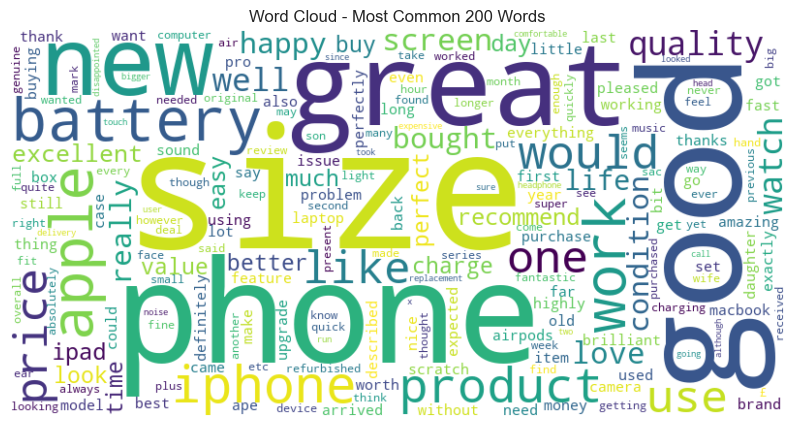

In [153]:
#Plot the word clouds with most common 200 words
from wordcloud import WordCloud

all_comments = ' '.join(df['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words')
plt.show()


***23.1 iPad***

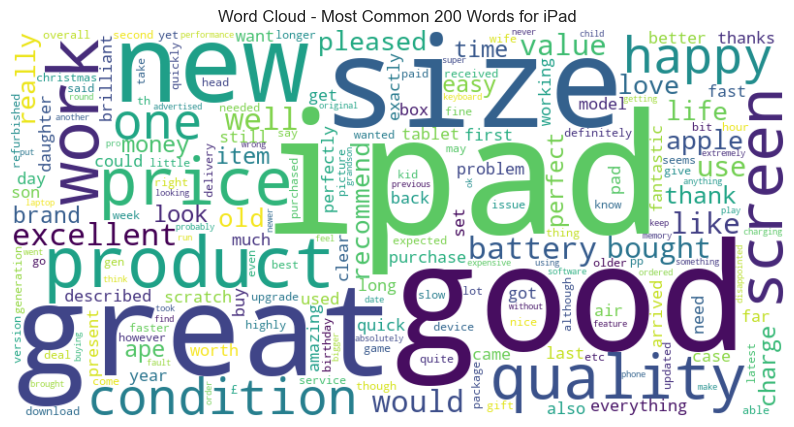

In [154]:
from wordcloud import WordCloud

all_comments = ' '.join(df_ipad['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPad')
plt.show()


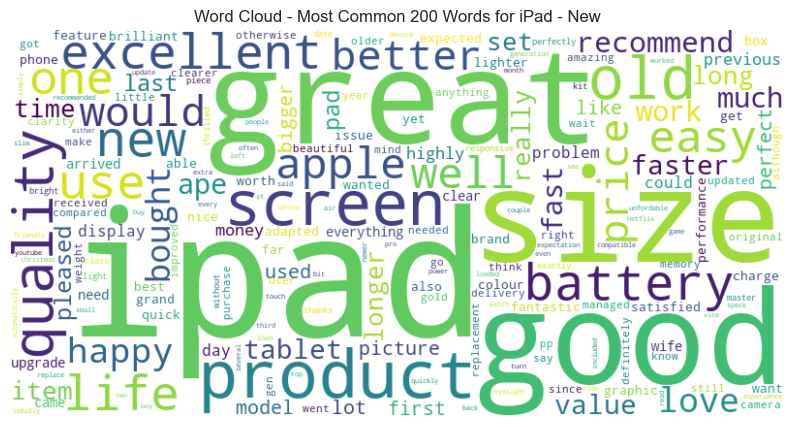

In [155]:
from wordcloud import WordCloud

all_comments = ' '.join(df_ipad_new['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPad - New')
plt.show()


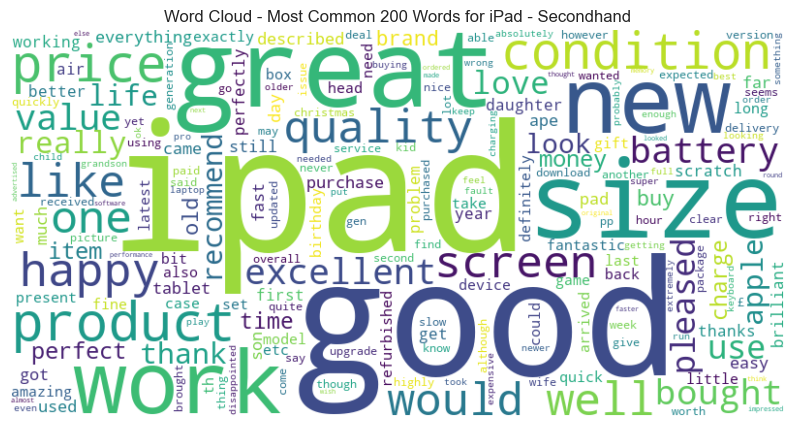

In [156]:
from wordcloud import WordCloud

all_comments = ' '.join(df_ipad_secondhand['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPad - Secondhand')
plt.show()


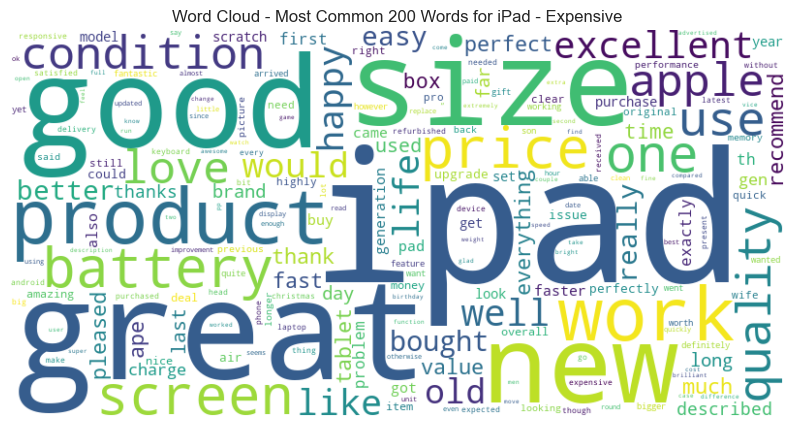

In [157]:
from wordcloud import WordCloud

all_comments = ' '.join(df_ipad_expensive['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPad - Expensive')
plt.show()


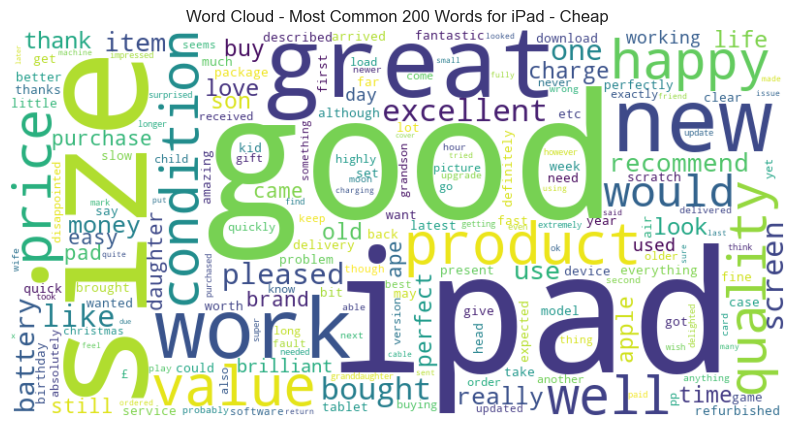

In [158]:
from wordcloud import WordCloud

all_comments = ' '.join(df_ipad_cheap['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPad - Cheap')
plt.show()


***23.2 iPhone***

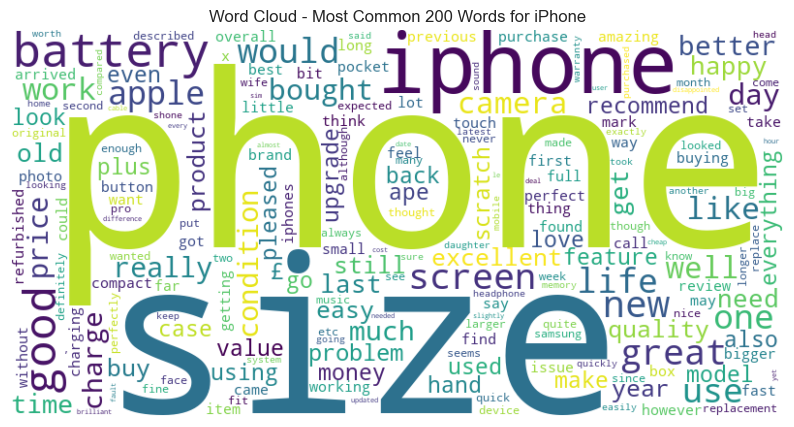

In [159]:
from wordcloud import WordCloud

all_comments = ' '.join(df_iphone['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPhone')
plt.show()


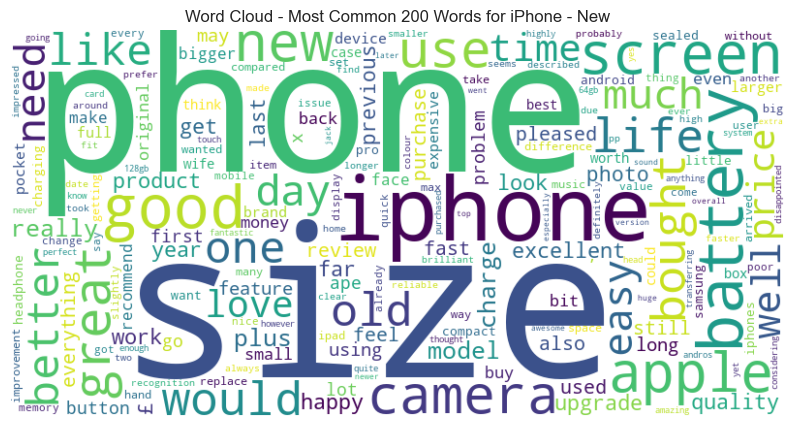

In [160]:
from wordcloud import WordCloud

all_comments = ' '.join(df_iphone_new['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPhone - New')
plt.show()


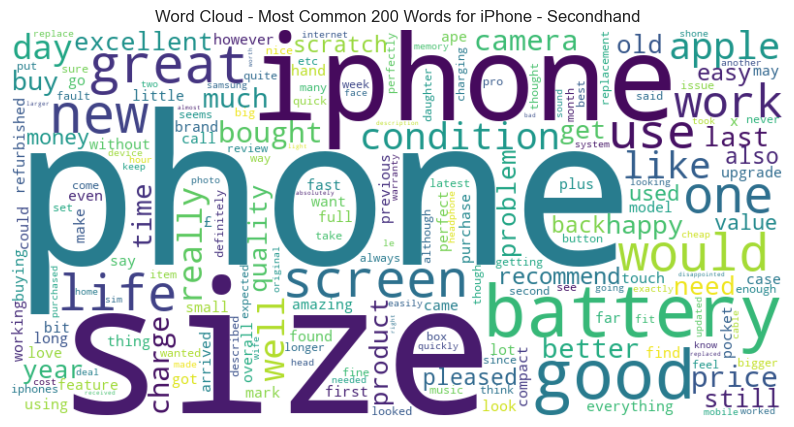

In [161]:
from wordcloud import WordCloud

all_comments = ' '.join(df_iphone_secondhand['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPhone - Secondhand')
plt.show()


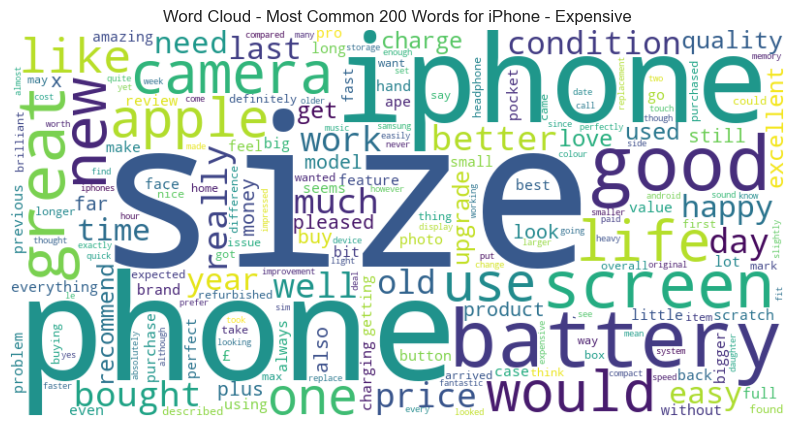

In [162]:
from wordcloud import WordCloud

all_comments = ' '.join(df_iphone_expensive['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPhone - Expensive')
plt.show()


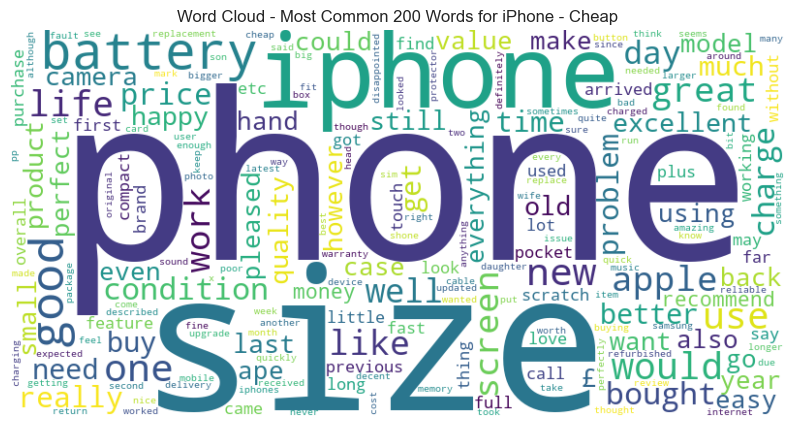

In [163]:
from wordcloud import WordCloud

all_comments = ' '.join(df_iphone_cheap['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for iPhone - Cheap')
plt.show()


***23.3 Macbook***

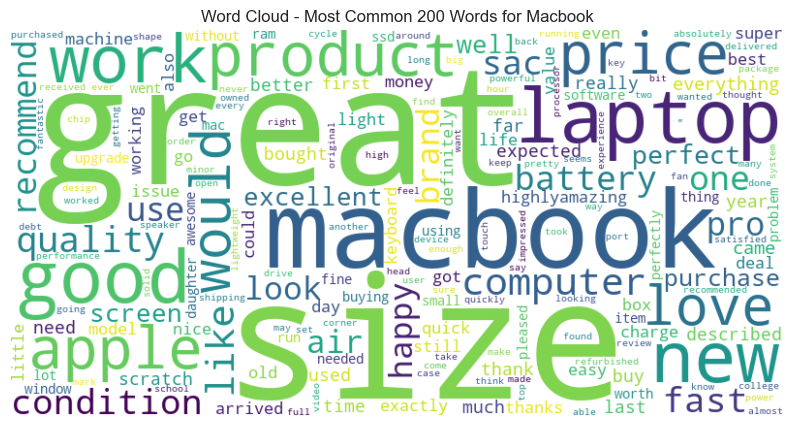

In [164]:
from wordcloud import WordCloud

all_comments = ' '.join(df_mac['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Macbook')
plt.show()


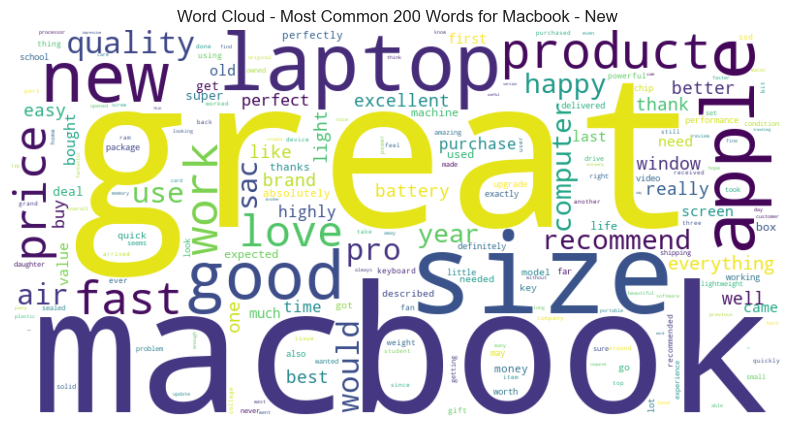

In [165]:
from wordcloud import WordCloud

all_comments = ' '.join(df_mac_new['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Macbook - New')
plt.show()


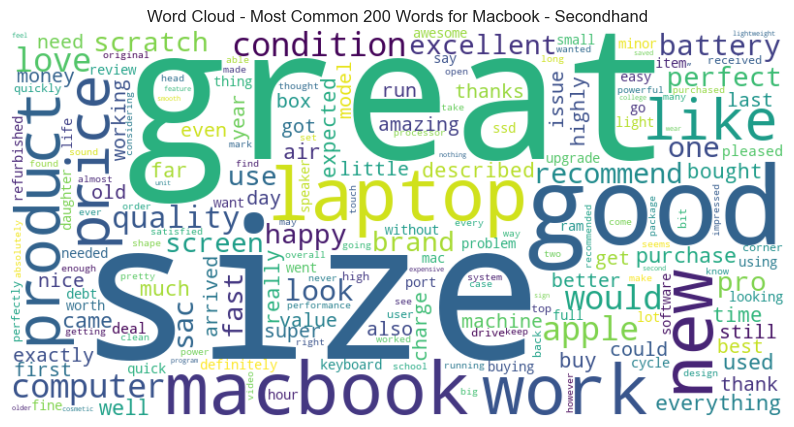

In [166]:
from wordcloud import WordCloud

all_comments = ' '.join(df_mac_secondhand['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Macbook - Secondhand')
plt.show()


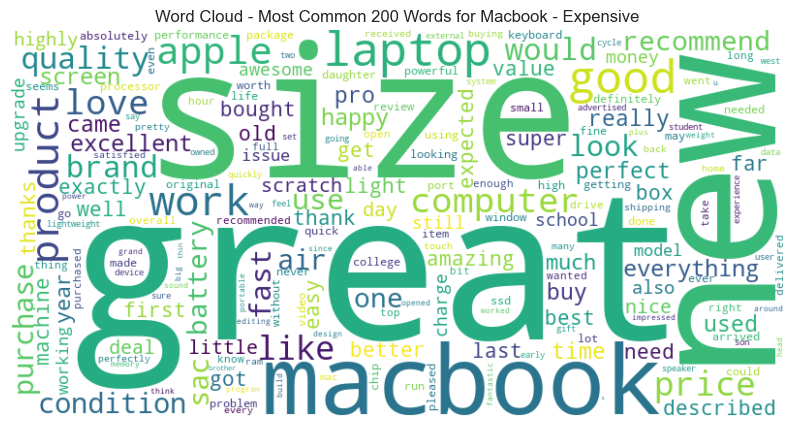

In [167]:
from wordcloud import WordCloud

all_comments = ' '.join(df_mac_expensive['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Macbook - Expensive')
plt.show()


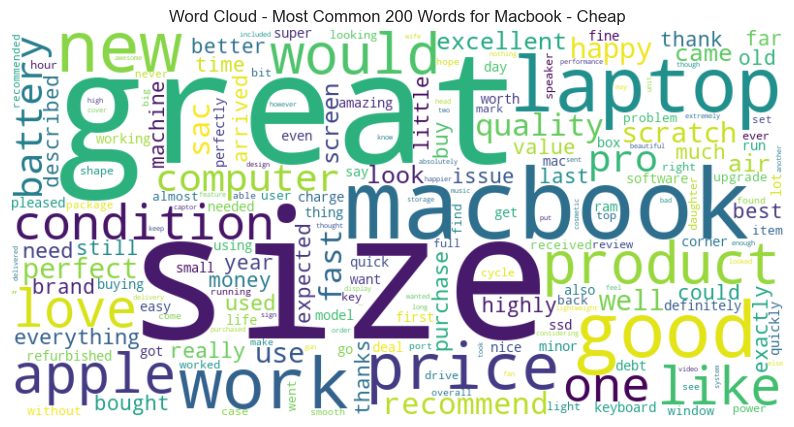

In [168]:
from wordcloud import WordCloud

all_comments = ' '.join(df_mac_cheap['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Macbook - Cheap')
plt.show()


***23.4 Apple Watch***

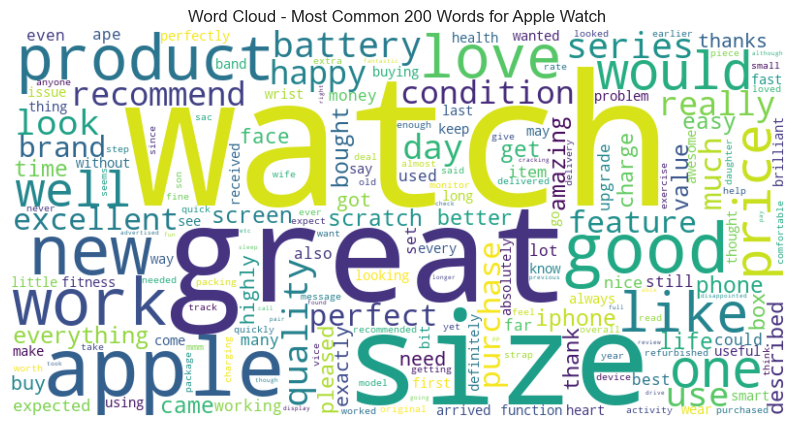

In [169]:
from wordcloud import WordCloud

all_comments = ' '.join(df_watch['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Apple Watch')
plt.show()


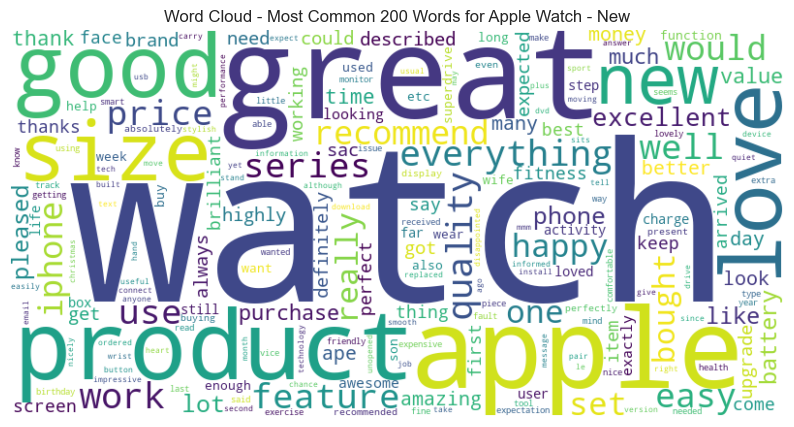

In [170]:
from wordcloud import WordCloud

all_comments = ' '.join(df_watch_new['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Apple Watch - New')
plt.show()


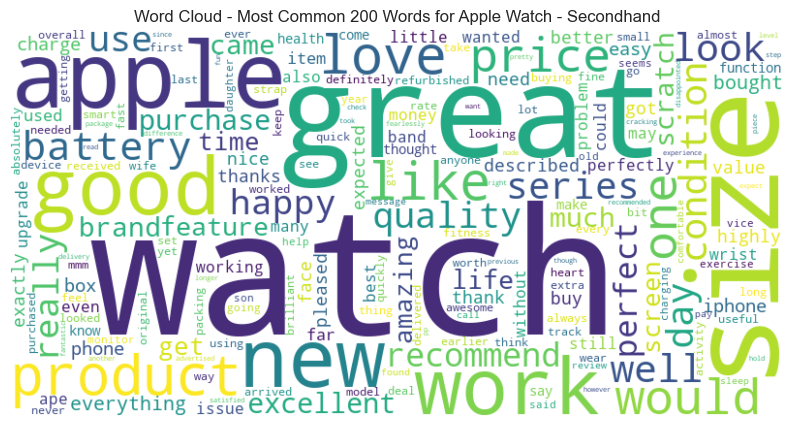

In [171]:
from wordcloud import WordCloud

all_comments = ' '.join(df_watch_secondhand['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Apple Watch - Secondhand')
plt.show()


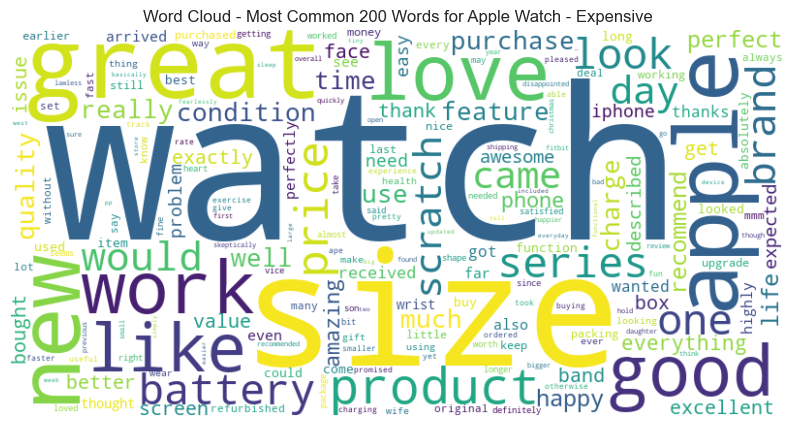

In [172]:
from wordcloud import WordCloud

all_comments = ' '.join(df_watch_expensive['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Apple Watch - Expensive')
plt.show()


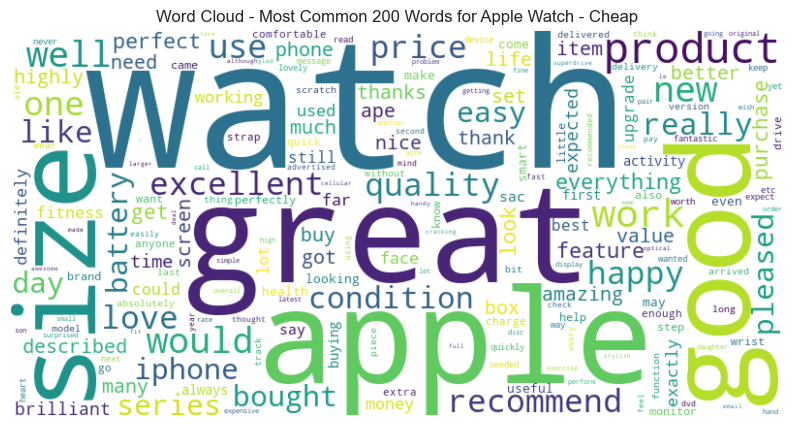

In [173]:
from wordcloud import WordCloud

all_comments = ' '.join(df_watch_cheap['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for Apple Watch - Cheap')
plt.show()


***23.5 AirPods***

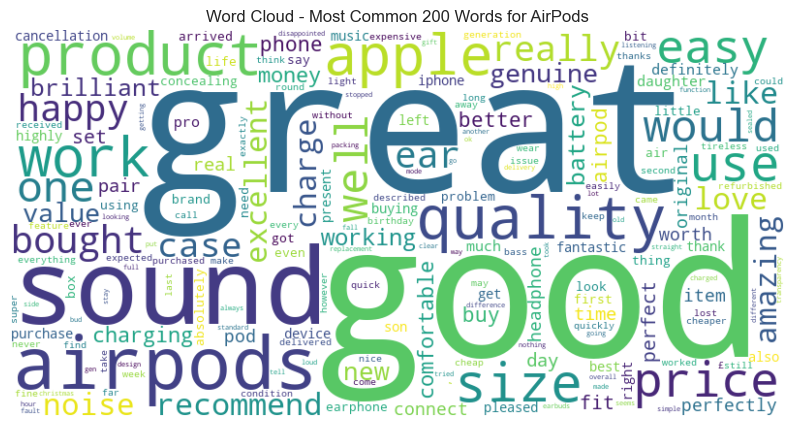

In [174]:
from wordcloud import WordCloud

all_comments = ' '.join(df_airpods['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for AirPods')
plt.show()


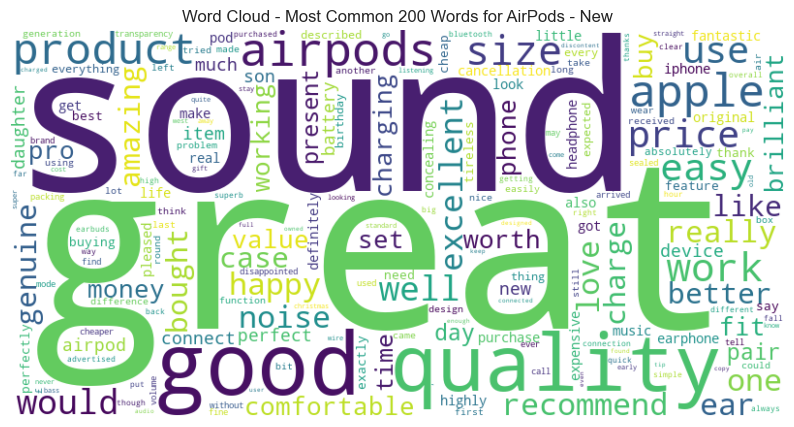

In [175]:
from wordcloud import WordCloud

all_comments = ' '.join(df_airpods_new['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for AirPods - New')
plt.show()


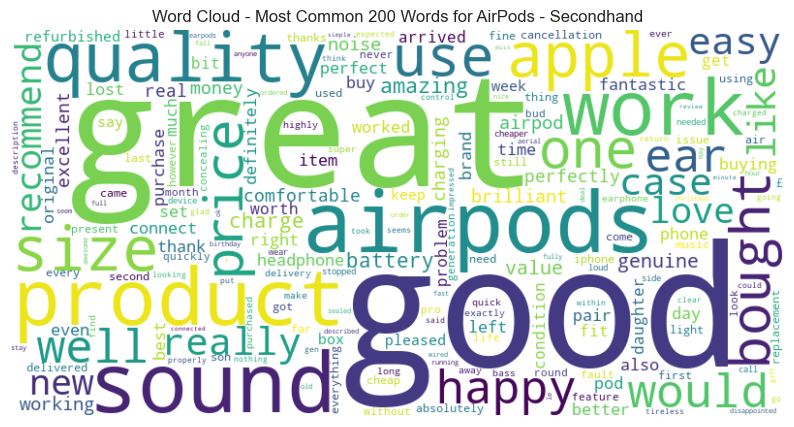

In [176]:
from wordcloud import WordCloud

all_comments = ' '.join(df_airpods_secondhand['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for AirPods - Secondhand')
plt.show()


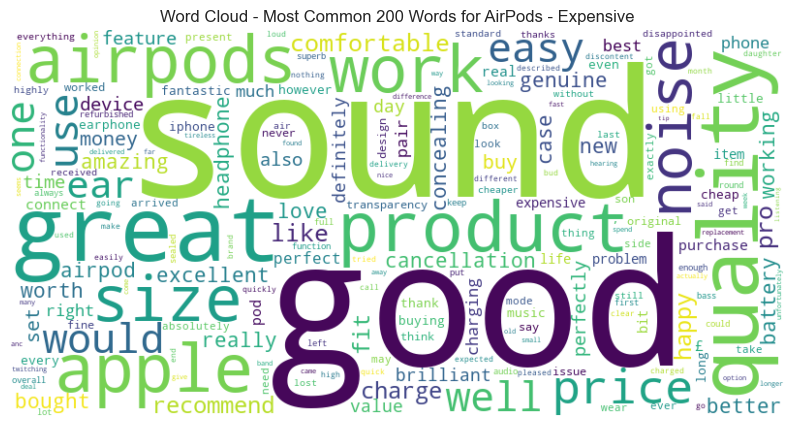

In [177]:
from wordcloud import WordCloud

all_comments = ' '.join(df_airpods_expensive['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for AirPods - Expensive')
plt.show()


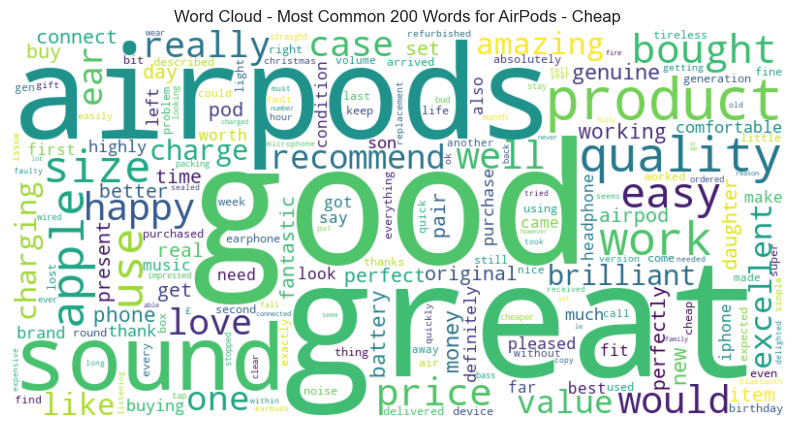

In [178]:
from wordcloud import WordCloud

all_comments = ' '.join(df_airpods_cheap['Cleaned_Comment'])

words = word_tokenize(all_comments)
word_counter = Counter(words)
most_common_words = word_counter.most_common(200)

word_freq_dict = dict(most_common_words)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud - Most Common 200 Words for AirPods - Cheap')
plt.show()


**24. Extracting noun phrases with TextBlob**

In [179]:
#Detect the most common 10 noun phrases with TextBlob
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df['Cleaned_Comment'])

blob = TextBlob(all_comments)

noun_phrases = blob.noun_phrases

noun_phrase_counter = Counter(noun_phrases)

most_common_noun_phrases = noun_phrase_counter.most_common(10)

print("10 most common noun phrases:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases:
easy use: 89
iphone size: 84
battery life: 81
great product: 74
great price: 49
happy purchase: 47
new phone: 37
size year: 36
perfect condition: 35
excellent condition: 35


***24.1 Macbook***

In [180]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_mac['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Macbook:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for Macbook:
great product: 18
full review: 10
great value: 10
great laptop: 10
great price: 10
happy purchase: 9
macbook air: 8
new macbook: 8
great condition: 8
battery life: 7


In [181]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_mac_new['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Macbook - New:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for Macbook - New:
great price: 7
great product: 6
happy purchase: 4
new macbook: 4
great value: 3
previous macbook: 3
battery life: 3
macbook air: 3
new box: 3
great quality: 3


In [182]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_mac_secondhand['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Macbook - Secondhand:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for Macbook - Secondhand:
great product: 13
great laptop: 9
full review: 8
great condition: 8
open box: 7
great value: 6
perfect condition: 6
happy purchase: 6
excellent condition: 5
battery life: 5


In [183]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_mac_expensive['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Macbook - Expensive:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for Macbook - Expensive:
great product: 9
new macbook: 6
full review: 5
great price: 5
macbook air: 5
great quality: 5
new box: 5
happy purchase: 4
perfect condition: 4
open box: 4


In [184]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_mac_cheap['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Macbook - Cheap:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for Macbook - Cheap:
great product: 12
great laptop: 7
great value: 6
great condition: 6
full review: 5
battery life: 5
great price: 5
pro size: 4
excellent condition: 4
size year: 4


***24.2 iPhone***

In [185]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_iphone['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPhone:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for iPhone:
iphone size: 81
battery life: 48
new phone: 37
great phone: 32
easy use: 29
full review: 18
£ size: 15
size year: 14
new battery: 13
pro max: 13


In [186]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_iphone_new['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPhone - New:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for iPhone - New:
iphone size: 25
great phone: 11
battery life: 9
full review: 8
pro max: 7
new phone: 6
easy use: 6
new iphone size: 5
old phone: 4
iphone x: 4


In [187]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_iphone_secondhand['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPhone - Secondhand:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for iPhone - Secondhand:
iphone size: 57
battery life: 39
new phone: 30
easy use: 22
great phone: 21
£ size: 13
new battery: 12
size year: 12
full review: 11
happy purchase: 11


In [188]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_iphone_expensive['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPhone - Expensive:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for iPhone - Expensive:
iphone size: 58
battery life: 24
great phone: 21
new phone: 17
easy use: 15
pro max: 12
full review: 11
iphone x: 8
old phone: 8
£ size: 7


In [189]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_iphone_cheap['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPhone - Cheap:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for iPhone - Cheap:
battery life: 24
iphone size: 23
new phone: 20
easy use: 14
great phone: 11
new battery: 9
size year: 8
£ size: 8
phone work: 8
full review: 7


***24.3 Apple Watch***

In [190]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_watch['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Apple Watch:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for Apple Watch:
great product: 17
series size: 16
battery life: 15
great price: 14
happy purchase: 12
new work: 12
apple product: 11
perfect condition: 10
easy use: 9
great condition: 9


In [191]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_watch_new['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Apple Watch - New:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

10 most common noun phrases for Apple Watch - New:
great price: 4
happy purchase: 3
series size: 3
great product: 3
easy set use: 2
battery life: 2
apple series size: 2
good value money: 2
easy use: 2
great value: 2


[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


In [192]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_watch_secondhand['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Apple Watch - Secondhand:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for Apple Watch - Secondhand:
great product: 14
series size: 13
battery life: 13
new work: 12
happy purchase: 11
great price: 10
perfect condition: 10
apple product: 9
great condition: 9
excellent condition: 8


In [193]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_watch_expensive['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Apple Watch - Expensive:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for Apple Watch - Expensive:
series size: 10
battery life: 10
new work: 10
great price: 7
happy purchase: 6
great product: 6
new apple: 5
perfect condition: 5
apple product: 5
excellent condition: 5


In [194]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_watch_cheap['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for Apple Watch - Cheap:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for Apple Watch - Cheap:
great product: 11
easy use: 9
series size: 8
great price: 8
apple product: 7
happy purchase: 6
great condition: 6
great value: 5
battery life: 5
perfect condition: 5


***24.4 iPad***

In [195]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_ipad['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPad:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for iPad:
great product: 15
old ipad: 13
easy use: 12
new ipad: 11
size year: 10
excellent condition: 9
battery life: 9
good value: 9
great price: 8
good quality: 8


In [196]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_ipad_new['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPad - New:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

10 most common noun phrases for iPad - New:
old ipad: 6
battery life: 4
excellent product: 4
great product: 4
new ipad: 3
easy use: 3
good value: 2
long battery life: 2
apple product: 2
screen size: 2


[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


In [197]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_ipad_secondhand['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPad - Secondhand:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for iPad - Secondhand:
great product: 13
size year: 10
excellent condition: 9
easy use: 9
new ipad: 8
great price: 8
good value: 7
old ipad: 7
good quality: 7
new work: 7


In [198]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_ipad_expensive['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPad - Expensive:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for iPad - Expensive:
old ipad: 11
new ipad: 9
great product: 9
new work: 6
size year: 5
easy use: 5
battery life: 5
easy set: 5
apple product: 4
excellent product: 4


In [199]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_ipad_cheap['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for iPad - Cheap:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for iPad - Cheap:
great price: 7
great product: 7
ipad size: 6
excellent condition: 6
good value: 6
easy use: 6
ipad air size: 5
size year: 5
worth money: 5
good quality: 5


***24.5 AirPods***

In [200]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_airpods['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for AirPods:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for AirPods:
easy use: 34
sound quality: 22
great product: 22
great quality: 10
great price: 8
size day: 7
easy set: 7
£ size: 6
apple airpods: 6
happy purchase: 6


In [201]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_airpods_new['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for AirPods - New:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for AirPods - New:
easy use: 14
sound quality: 13
great product: 11
easy set: 6
great price: 6
apple airpods: 5
great value money: 4
happy purchase: 4
genuine airpods: 4
great quality: 4


In [202]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_airpods_secondhand['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for AirPods - Secondhand:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for AirPods - Secondhand:
easy use: 19
great product: 14
sound quality: 8
great quality: 6
£ size: 5
genuine product: 4
happy product: 4
good value money: 4
noise cancellation: 3
happy purchase: 3


In [203]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_airpods_expensive['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for AirPods - Expensive:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for AirPods - Expensive:
sound quality: 12
easy use: 11
great product: 8
noise cancellation: 5
£ size: 5
easy set: 5
apple airpods: 4
great quality: 4
transparency mode: 3
happy purchase: 3


In [204]:
from textblob import TextBlob
nltk.download('brown')

all_comments = ' '.join(df_airpods_cheap['Cleaned_Comment'])

# Create a TextBlob object
blob = TextBlob(all_comments)

# Extract noun phrases
noun_phrases = blob.noun_phrases

# Count the occurrences of each noun phrase using Counter
noun_phrase_counter = Counter(noun_phrases)

# Get the 10 most common noun phrases
most_common_noun_phrases = noun_phrase_counter.most_common(10)

# Print the results
print("10 most common noun phrases for AirPods - Cheap:")
for noun_phrase, frequency in most_common_noun_phrases:
    print(f"{noun_phrase}: {frequency}")

[nltk_data] Downloading package brown to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package brown is already up-to-date!


10 most common noun phrases for AirPods - Cheap:
easy use: 22
great product: 12
sound quality: 11
great quality: 6
genuine airpods: 5
happy work: 5
great price: 5
size day: 4
real thing: 4
happy product: 4


**24. Performing the LDA Topic Modelling**

In [205]:
#Perform LDA Topic Modelling
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from nltk.tokenize import word_tokenize

nltk.download('punkt')

def tokenize_text(text):
    return word_tokenize(text)

df_iphone['Tokenized_Comment'] = df_iphone['Cleaned_Comment'].apply(tokenize_text)

dictionary = Dictionary(df_iphone['Tokenized_Comment'])

bow_corpus = [dictionary.doc2bow(doc) for doc in df_iphone['Tokenized_Comment']]

num_topics = 5
lda_model = LdaModel(corpus=bow_corpus, id2word=dictionary, num_topics=num_topics, passes=10)

df_iphone['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]

topic_counts = df_iphone['Topic'].value_counts().to_dict()

print("LDA Topics:")
for idx, topic in lda_model.print_topics():
    print(f"Topic {idx}: {topic} | Comment Count: {topic_counts.get(idx, 0)}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2661475112.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone['Tokenized_Comment'] = df_iphone['Cleaned_Comment'].apply(tokenize_text)


LDA Topics:
Topic 0: 0.026*"phone" + 0.022*"good" + 0.010*"work" + 0.010*"battery" + 0.009*"well" + 0.008*"screen" + 0.007*"like" + 0.007*"also" + 0.007*"product" + 0.006*"get" | Comment Count: 79
Topic 1: 0.047*"phone" + 0.021*"size" + 0.020*"iphone" + 0.014*"use" + 0.010*"good" + 0.009*"screen" + 0.008*"battery" + 0.008*"charge" + 0.007*"apple" + 0.007*"work" | Comment Count: 157
Topic 2: 0.019*"battery" + 0.017*"phone" + 0.011*"iphone" + 0.010*"size" + 0.009*"bought" + 0.007*"use" + 0.007*"one" + 0.007*"time" + 0.007*"last" + 0.007*"day" | Comment Count: 48
Topic 3: 0.036*"phone" + 0.031*"size" + 0.029*"iphone" + 0.011*"good" + 0.009*"great" + 0.008*"use" + 0.008*"new" + 0.007*"really" + 0.007*"camera" + 0.006*"condition" | Comment Count: 141
Topic 4: 0.044*"size" + 0.040*"phone" + 0.024*"iphone" + 0.022*"battery" + 0.016*"good" + 0.012*"new" + 0.012*"great" + 0.011*"life" + 0.010*"screen" + 0.010*"one" | Comment Count: 575


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2661475112.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]


In [207]:
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from nltk.tokenize import word_tokenize

nltk.download('punkt')

def tokenize_text(text):
    return word_tokenize(text)

df_mac['Tokenized_Comment'] = df_mac['Cleaned_Comment'].apply(tokenize_text)

dictionary = Dictionary(df_mac['Tokenized_Comment'])

bow_corpus = [dictionary.doc2bow(doc) for doc in df_mac['Tokenized_Comment']]

num_topics = 5
lda_model = LdaModel(corpus=bow_corpus, id2word=dictionary, num_topics=num_topics, passes=10)

# Assign topics to comments
df_mac['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]

topic_counts = df_mac['Topic'].value_counts().to_dict()

print("LDA Topics:")
for idx, topic in lda_model.print_topics():
    print(f"Topic {idx}: {topic} | Comment Count: {topic_counts.get(idx, 0)}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2265032275.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac['Tokenized_Comment'] = df_mac['Cleaned_Comment'].apply(tokenize_text)


LDA Topics:
Topic 0: 0.033*"size" + 0.025*"laptop" + 0.017*"great" + 0.015*"macbook" + 0.012*"battery" + 0.011*"apple" + 0.010*"good" + 0.010*"work" + 0.009*"use" + 0.009*"would" | Comment Count: 325
Topic 1: 0.043*"great" + 0.032*"new" + 0.028*"product" + 0.024*"work" + 0.019*"macbook" + 0.018*"brand" + 0.018*"good" + 0.016*"size" + 0.014*"price" + 0.014*"perfect" | Comment Count: 325
Topic 2: 0.014*"good" + 0.012*"pro" + 0.010*"macbook" + 0.009*"apple" + 0.009*"software" + 0.008*"laptop" + 0.007*"battery" + 0.007*"machine" + 0.007*"screen" + 0.007*"ram" | Comment Count: 49
Topic 3: 0.020*"good" + 0.020*"purchase" + 0.014*"exactly" + 0.013*"love" + 0.013*"happy" + 0.012*"time" + 0.011*"sac" + 0.011*"described" + 0.011*"price" + 0.010*"thanks" | Comment Count: 119
Topic 4: 0.018*"macbook" + 0.017*"new" + 0.013*"good" + 0.012*"great" + 0.012*"look" + 0.011*"work" + 0.010*"product" + 0.010*"fast" + 0.009*"much" + 0.009*"expected" | Comment Count: 182


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2265032275.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]


In [209]:
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from nltk.tokenize import word_tokenize

nltk.download('punkt')

def tokenize_text(text):
    return word_tokenize(text)

df_ipad['Tokenized_Comment'] = df_ipad['Cleaned_Comment'].apply(tokenize_text)

dictionary = Dictionary(df_ipad['Tokenized_Comment'])

bow_corpus = [dictionary.doc2bow(doc) for doc in df_ipad['Tokenized_Comment']]

num_topics = 5
lda_model = LdaModel(corpus=bow_corpus, id2word=dictionary, num_topics=num_topics, passes=10)

# Assign topics to comments
df_ipad['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]

topic_counts = df_ipad['Topic'].value_counts().to_dict()

print("LDA Topics:")
for idx, topic in lda_model.print_topics():
    print(f"Topic {idx}: {topic} | Comment Count: {topic_counts.get(idx, 0)}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1621576080.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad['Tokenized_Comment'] = df_ipad['Cleaned_Comment'].apply(tokenize_text)


LDA Topics:
Topic 0: 0.039*"good" + 0.033*"great" + 0.029*"ipad" + 0.026*"product" + 0.021*"quality" + 0.019*"value" + 0.018*"price" + 0.018*"pleased" + 0.018*"condition" + 0.016*"happy" | Comment Count: 403
Topic 1: 0.041*"ipad" + 0.028*"battery" + 0.026*"good" + 0.021*"size" + 0.019*"life" + 0.015*"new" + 0.010*"well" + 0.009*"price" + 0.009*"use" + 0.009*"excellent" | Comment Count: 182
Topic 2: 0.031*"size" + 0.024*"ipad" + 0.017*"bought" + 0.016*"old" + 0.014*"work" + 0.013*"one" + 0.010*"condition" + 0.010*"ape" + 0.009*"great" + 0.008*"good" | Comment Count: 94
Topic 3: 0.041*"new" + 0.023*"like" + 0.022*"ipad" + 0.019*"would" + 0.019*"screen" + 0.017*"one" + 0.017*"great" + 0.014*"brand" + 0.013*"work" + 0.012*"good" | Comment Count: 166
Topic 4: 0.027*"size" + 0.026*"ipad" + 0.024*"great" + 0.021*"screen" + 0.017*"good" + 0.016*"work" + 0.011*"use" + 0.011*"well" + 0.010*"easy" + 0.010*"product" | Comment Count: 155


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1621576080.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]


In [211]:
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from nltk.tokenize import word_tokenize

nltk.download('punkt')

def tokenize_text(text):
    return word_tokenize(text)

df_watch['Tokenized_Comment'] = df_watch['Cleaned_Comment'].apply(tokenize_text)

dictionary = Dictionary(df_watch['Tokenized_Comment'])

bow_corpus = [dictionary.doc2bow(doc) for doc in df_watch['Tokenized_Comment']]

num_topics = 5
lda_model = LdaModel(corpus=bow_corpus, id2word=dictionary, num_topics=num_topics, passes=10)

# Assign topics to comments
df_watch['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]

topic_counts = df_watch['Topic'].value_counts().to_dict()

print("LDA Topics:")
for idx, topic in lda_model.print_topics():
    print(f"Topic {idx}: {topic} | Comment Count: {topic_counts.get(idx, 0)}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1214900019.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_watch['Tokenized_Comment'] = df_watch['Cleaned_Comment'].apply(tokenize_text)


LDA Topics:
Topic 0: 0.036*"watch" + 0.026*"like" + 0.026*"new" + 0.019*"quality" + 0.018*"work" + 0.018*"size" + 0.016*"day" + 0.015*"good" + 0.012*"product" + 0.012*"really" | Comment Count: 174
Topic 1: 0.053*"watch" + 0.033*"great" + 0.019*"price" + 0.017*"well" + 0.016*"good" + 0.014*"excellent" + 0.014*"pleased" + 0.013*"size" + 0.012*"love" + 0.012*"apple" | Comment Count: 252
Topic 2: 0.027*"watch" + 0.013*"love" + 0.013*"happy" + 0.013*"would" + 0.011*"size" + 0.010*"feature" + 0.009*"one" + 0.008*"iphone" + 0.008*"get" + 0.008*"like" | Comment Count: 78
Topic 3: 0.065*"watch" + 0.035*"apple" + 0.031*"size" + 0.020*"great" + 0.018*"new" + 0.014*"love" + 0.013*"series" + 0.013*"work" + 0.012*"use" + 0.010*"look" | Comment Count: 350
Topic 4: 0.060*"great" + 0.044*"good" + 0.042*"product" + 0.025*"exactly" + 0.025*"described" + 0.024*"work" + 0.020*"expected" + 0.014*"value" + 0.014*"look" + 0.012*"price" | Comment Count: 146


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1214900019.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_watch['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]


In [213]:
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from nltk.tokenize import word_tokenize

nltk.download('punkt')

def tokenize_text(text):
    return word_tokenize(text)

df_airpods['Tokenized_Comment'] = df_airpods['Cleaned_Comment'].apply(tokenize_text)

dictionary = Dictionary(df_airpods['Tokenized_Comment'])

bow_corpus = [dictionary.doc2bow(doc) for doc in df_airpods['Tokenized_Comment']]

num_topics = 5
lda_model = LdaModel(corpus=bow_corpus, id2word=dictionary, num_topics=num_topics, passes=10)

# Assign topics to comments
df_airpods['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]

topic_counts = df_airpods['Topic'].value_counts().to_dict()

print("LDA Topics:")
for idx, topic in lda_model.print_topics():
    print(f"Topic {idx}: {topic} | Comment Count: {topic_counts.get(idx, 0)}")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/3152854227.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_airpods['Tokenized_Comment'] = df_airpods['Cleaned_Comment'].apply(tokenize_text)


LDA Topics:
Topic 0: 0.018*"size" + 0.018*"great" + 0.017*"work" + 0.017*"bought" + 0.015*"price" + 0.015*"present" + 0.013*"airpod" + 0.013*"pod" + 0.013*"like" + 0.013*"amazing" | Comment Count: 172
Topic 1: 0.057*"good" + 0.034*"product" + 0.029*"use" + 0.028*"great" + 0.025*"easy" + 0.018*"value" + 0.018*"quality" + 0.017*"sound" + 0.015*"happy" + 0.015*"money" | Comment Count: 276
Topic 2: 0.024*"airpods" + 0.019*"easy" + 0.017*"charging" + 0.016*"case" + 0.015*"great" + 0.014*"ear" + 0.012*"connect" + 0.012*"size" + 0.012*"use" + 0.012*"phone" | Comment Count: 109
Topic 3: 0.031*"great" + 0.029*"sound" + 0.025*"apple" + 0.023*"quality" + 0.022*"airpods" + 0.018*"good" + 0.018*"work" + 0.017*"product" + 0.014*"noise" + 0.010*"size" | Comment Count: 298
Topic 4: 0.024*"size" + 0.023*"airpods" + 0.018*"apple" + 0.016*"ear" + 0.015*"sound" + 0.014*"quality" + 0.013*"would" + 0.013*"good" + 0.011*"working" + 0.011*"one" | Comment Count: 145


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/3152854227.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_airpods['Topic'] = [max(lda_model.get_document_topics(bow), key=lambda x: x[1])[0] for bow in bow_corpus]


**25. Conduct a sentiment analysis with VADER model**

**25.1 iPhone**

In [215]:
#Conduct a sentiment analysis with VADER
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
analyzer = SentimentIntensityAnalyzer()

def get_sentiment_score(text):
    return analyzer.polarity_scores(text)['compound']

df_iphone['SentimentScore_VADER'] = df_iphone['Sentiment_Comment'].apply(get_sentiment_score)

df_iphone['SentimentCategory_VADER'] = df_iphone['SentimentScore_VADER'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))

df_iphone[['Sentiment_Comment', 'SentimentScore_VADER', 'SentimentCategory_VADER']]


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/3845702056.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone['SentimentScore_VADER'] = df_iphone['Sentiment_Comment'].apply(get_sentiment_score)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/3845702056.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d

,Sentiment_Comment,SentimentScore_VADER,SentimentCategory_VADER
2000,I have owned and used an iPhone Of ( standard ...,0.9936,Positive
2001,The [ SIZE ] iPhone of is one of the best prod...,0.9935,Positive
2002,This is my first smartphone and because I am a...,0.9452,Positive
2003,My wife likes to hang onto things and is not o...,0.9720,Positive
2004,For the age of the phone It Is Quick and very ...,0.4245,Positive
...,...,...,...
2995,Degraded to the bigger iPhone from the iPhone ...,0.8169,Positive
2996,I have bought [ SIZE ] second iPhones one I se...,-0.2263,Negative
2997,Battery is draining very fast from [ SIZE ] % ...,0.5267,Positive
2998,Dear perfect condition . Of . Such cheaper tha...,-0.2439,Negative


In [216]:
df_iphone.SentimentScore_VADER.describe()

count    1000.000000
mean        0.594146
std         0.529088
min        -0.949700
25%         0.458650
50%         0.860700
75%         0.940750
max         0.996500
Name: SentimentScore_VADER, dtype: float64

In [217]:
sorted_df = df_iphone.sort_values(by='SentimentScore_VADER', ascending=False)
top_5_comments_vader = sorted_df.head(5)
top_5_comments_vader
for i, comment in enumerate(top_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 Really happy with the ‘2020 SE iPhone’ and it’s a great improvement on my old friend the iPhone 7 (even better if changing from an even earlier model!). It’s very similar to the latest/high cost iPhones at a fraction of their price : ) Due to it being a recent release model it also means Apple will support it until 2025 with updates etc. The speakers sound output is improved and much better, it’s a zippy phone thanks to the great chip and it also works with Qi wireless charging which is good. I’m happy it remains at similar size to the 6,7,8 models as I like to be able to fit my phone in my pocket! (I don’t like putting an iPad size phone to my ear either lol). Also because of the similar size to some earlier models many older cases fit great and can be bought at cheaper cost, I’ve opted f
or a slip-in pouch type case meant for an iPhone 6 in luxury genuine black leather that cost just £3.75 instead of the original £40/50 cost.  My old iPhone 7’s battery had tired down to 54% health 

In [218]:
sorted_df = df_iphone.sort_values(by='SentimentScore_VADER', ascending=True)
bad_5_comments_vader = sorted_df.head(5)
bad_5_comments_vader
for i, comment in enumerate(bad_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 I like the phone, the case etc are smart and dont look preloved/reconditioned but the battery life is not great,  I thought I was getting away from charging it every day.
Arrived dead as a dodo, first day ran out with only 2hr 24m social networking, no phone calls, 2 whatsapp messages, 5 text and 18, mostly views on messenger. This was on the wifi at home not out using 3G/4G.
I  have changed all the settings to limit the use of apps now but feel disappointed
-----------------------------------------------------------------------------------------------
1 We were very impressed to find what looks like a brand new phone. It doesn't have Apple's fancy packing, it didn't come with a charger or cable but as it was to replace a water-locked disaster we already had everything. Now we are looking for an iPad!
HOWEVER, it has since failed and a fix took a very long time. It has now failed again within only two weeks of return! We believe it was an original failed battery product which was not

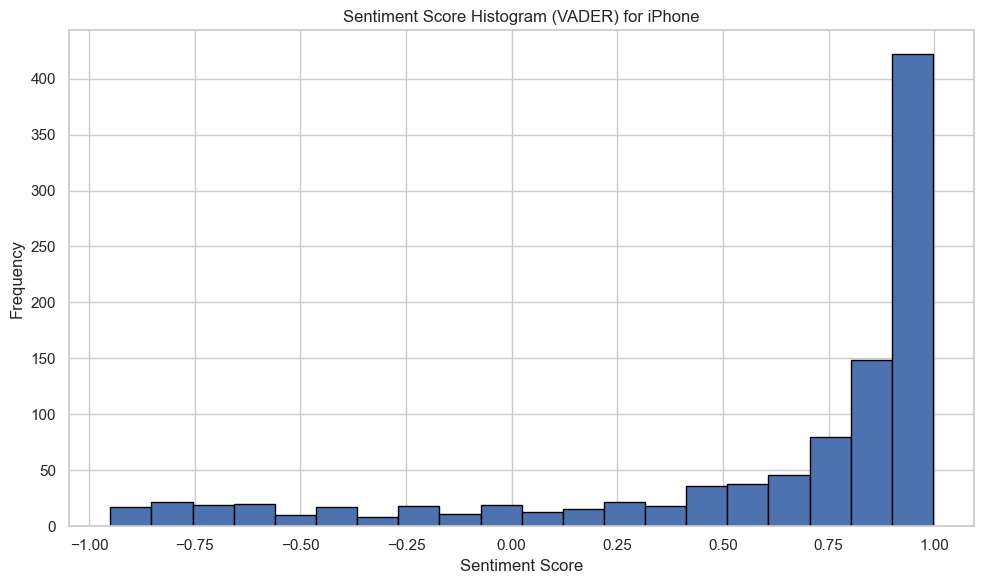

In [219]:
#Plot the sentiment score with VADER
plt.figure(figsize=(10, 6))
plt.hist(df_iphone['SentimentScore_VADER'], bins=20, edgecolor='black')
plt.title('Sentiment Score Histogram (VADER) for iPhone')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


**25.2 Macbook**

In [220]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
analyzer = SentimentIntensityAnalyzer()

# Function to get the sentiment score using VADER
def get_sentiment_score(text):
    return analyzer.polarity_scores(text)['compound']

# Apply the function to the "Sentiment_Comment" column
df_mac['SentimentScore_VADER'] = df_mac['Sentiment_Comment'].apply(get_sentiment_score)

# Categorize the sentiment based on the sentiment score
df_mac['SentimentCategory_VADER'] = df_mac['SentimentScore_VADER'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))

# Print the DataFrame with sentiment scores and categories
df_mac[['Sentiment_Comment', 'SentimentScore_VADER', 'SentimentCategory_VADER']]


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2233685362.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac['SentimentScore_VADER'] = df_mac['Sentiment_Comment'].apply(get_sentiment_score)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2233685362.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac[

,Sentiment_Comment,SentimentScore_VADER,SentimentCategory_VADER
3000,"The [ SIZE ] MacBook Pro [ SIZE ] "" that I rec...",0.9945,Positive
3001,"West value for money , not just from apple , b...",0.9917,Positive
3002,"I have dived into the Sac walled garden , whic...",0.9932,Positive
3003,This laptop does exactly what it needs to do ....,0.9907,Positive
3004,Very happy with my purchase . The Macbook Air ...,0.9586,Positive
...,...,...,...
3995,Apple the best of the best,0.8555,Positive
3996,great color and protection,0.6249,Positive
3997,Good quality for the price,0.4404,Positive
3998,Grand new and came quickly,0.4588,Positive


In [221]:
df_mac.SentimentScore_VADER.describe()

count    1000.000000
mean        0.593314
std         0.400410
min        -0.915400
25%         0.475400
50%         0.740200
75%         0.873450
max         0.994500
Name: SentimentScore_VADER, dtype: float64

In [222]:
sorted_df = df_mac.sort_values(by='SentimentScore_VADER', ascending=False)
top_5_comments_vader = sorted_df.head(5)
top_5_comments_vader
for i, comment in enumerate(top_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 The 2019 MacBook Pro 16" that I received was exactly as described.  I ordered "Excellent" condition.
Physical condition: The physical condition was excellent and had only very minor scuffs on the exterior edges of the shell.  There was a small smudge on the bottom of the laptop that I was able to wipe off with a lens cloth.  The keyboard , trackpad, and screen were all in pristine condition with no visible defects.  This is about as good as I normally take care of my own laptops, which is high praise coming from someone very detail-oriented like myself.  I also checked that all four thunderbolt3 ports were able to accept charge from my charger; that the speaker was able to reproduce music at full volume without static, crackling, or pops; that wifi and bluetooth were working as expe
cted, and that the touchbar was working.
Specifications: I verified that all of the specs (CPU, GPU, RAM, SSD) were exactly as described in the product listing.  I used apps like coconut battery, SMART mo

In [223]:
sorted_df = df_mac.sort_values(by='SentimentScore_VADER', ascending=True)
bad_5_comments_vader = sorted_df.head(5)
bad_5_comments_vader
for i, comment in enumerate(bad_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 Poor quality, didn’t fix my space bar the item just broke when I took it too my friend who fixes laptops for a living he informed me it was poor quality for an extortionate price, as the hooks just broke and many other suppliers include adhesive and sell all of the pieces together, do not recommend, poor quality and even worse prices
-----------------------------------------------------------------------------------------------
1 THIS IS A SCAM. HE TOOK MY MONEY AND SENT ME A PICTURE FRAME . WHAT A LOSER.
-----------------------------------------------------------------------------------------------
2 So disappointed to know that the item received isn’t ready for a new owner. It’s a waste of time to spending trying to figure out how to get this computer ready for my son.
-----------------------------------------------------------------------------------------------
3 Terrible terrible terrible.
------------------------------------------------------------------------------------------

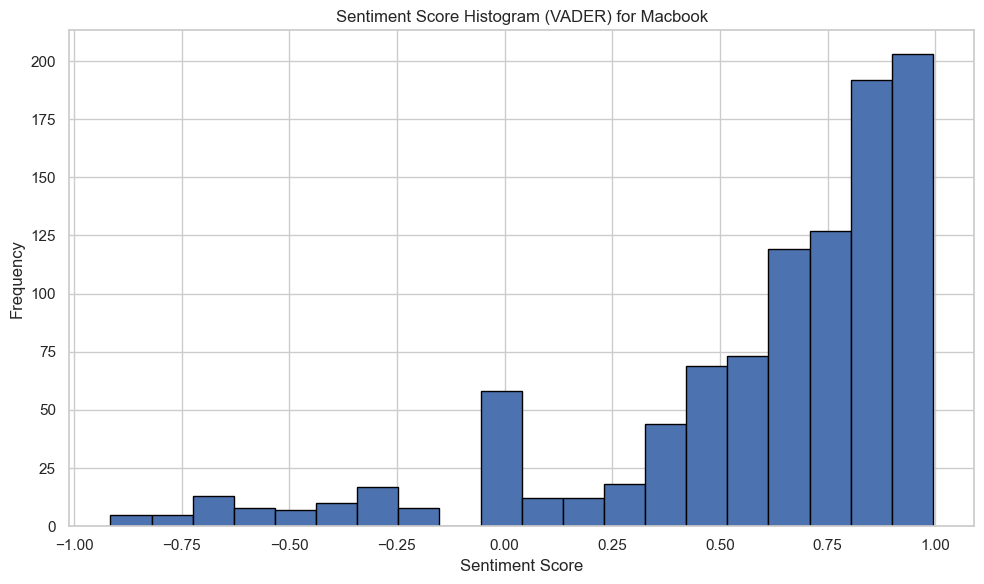

In [224]:
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.hist(df_mac['SentimentScore_VADER'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (VADER) for Macbook')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


**25.3 iPad**

In [225]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
analyzer = SentimentIntensityAnalyzer()

# Function to get the sentiment score using VADER
def get_sentiment_score(text):
    return analyzer.polarity_scores(text)['compound']

# Apply the function to the "Sentiment_Comment" column
df_ipad['SentimentScore_VADER'] = df_ipad['Sentiment_Comment'].apply(get_sentiment_score)

# Categorize the sentiment based on the sentiment score
df_ipad['SentimentCategory_VADER'] = df_ipad['SentimentScore_VADER'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))

# Print the DataFrame with sentiment scores and categories
df_ipad[['Sentiment_Comment', 'SentimentScore_VADER', 'SentimentCategory_VADER']]


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/571326633.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad['SentimentScore_VADER'] = df_ipad['Sentiment_Comment'].apply(get_sentiment_score)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/571326633.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad

,Sentiment_Comment,SentimentScore_VADER,SentimentCategory_VADER
4000,Good product but still very prices ! The ipad ...,0.5308,Positive
4001,"My iPad [ SIZE ] was getting slow thanks , pro...",0.9887,Positive
4002,My only criticism is that the charging lead in...,0.9886,Positive
4003,So I just opened the box and unwrapped my new ...,0.9791,Positive
4004,The IPAD AIR [ SIZE ] is still an of IPAD . Ho...,-0.0119,Neutral
...,...,...,...
4995,Brilliant price and great ipad,0.8360,Positive
4996,Last delivery no sons perfect,0.3612,Positive
4997,Excellent tablet Recommend it,0.7351,Positive
4998,Product was very acceptable .,0.3804,Positive


In [226]:
df_ipad.SentimentScore_VADER.describe()

count    1000.000000
mean        0.573620
std         0.399271
min        -0.847600
25%         0.440400
50%         0.722650
75%         0.848100
max         0.988700
Name: SentimentScore_VADER, dtype: float64

In [227]:
sorted_df = df_ipad.sort_values(by='SentimentScore_VADER', ascending=False)
top_5_comments_vader = sorted_df.head(5)
top_5_comments_vader
for i, comment in enumerate(top_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 My iPad 2 was getting slow thanks, probably, to the later Apple upgrades installed.  The iPad Air 2 seemed the obvious next step.  I was fortunate to find this one on eBay, it was selling at a reasonable price and was in excellent condition.  There are many very good aspects to the Air 2, the screen is excellent, the processor very fast and the weight noticeably less than the iPad it has replaced.  The battery life does not appear to be quite as good as the earlier iPad versions, due, no doubt, to the smaller footprint and thinner body making a smaller battery inevitable.  Battery life is not, however, bad, it is just not as good.  I also gave a negative to the 'is it good value?' question.  I think the price I paid on eBay was certainly 'good value' but I am not sure that the price Apple
asks for the Air 2, or any other of their products new, is good value.  To complete my purchase I also bought a JETech case here on eBay.  This case is also good value when compared with the price a

In [228]:
sorted_df = df_ipad.sort_values(by='SentimentScore_VADER', ascending=True)
bad_5_comments_vader = sorted_df.head(5)
bad_5_comments_vader
for i, comment in enumerate(bad_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 Faulty item, not tested i guess, battery dont hold it’s charge, went from 100% to 2% overnight with wifi and screen turned off. It cant be used unless pluged in. For this kind of money i would’ve expect an item that i can actually use. Very bad experience, very unhappy, i’ll limit my shoppings on here.
-----------------------------------------------------------------------------------------------
1 Item has been arrived damaged on top. Look like screen can come off anytime. A lot of screeches around the iPad. This should have been mentioned in description. I know it’s refurbished but condition is bad. Also iPad cover is very low quality and different then we saw in pictures.
-----------------------------------------------------------------------------------------------
2 The ipad is advertised as gold but it is actually rose gold, not thrilled with the wrong colour.
-----------------------------------------------------------------------------------------------
3 I'm very familiar wit

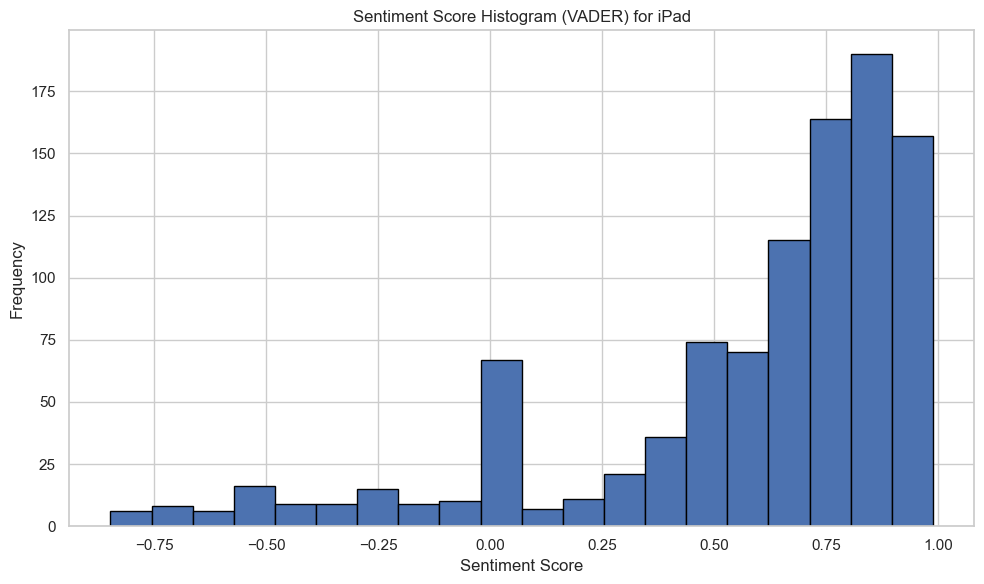

In [229]:
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.hist(df_ipad['SentimentScore_VADER'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (VADER) for iPad')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


**25.4 AirPods**

In [230]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
analyzer = SentimentIntensityAnalyzer()

# Function to get the sentiment score using VADER
def get_sentiment_score(text):
    return analyzer.polarity_scores(text)['compound']

# Apply the function to the "Sentiment_Comment" column
df_airpods['SentimentScore_VADER'] = df_airpods['Sentiment_Comment'].apply(get_sentiment_score)

# Categorize the sentiment based on the sentiment score
df_airpods['SentimentCategory_VADER'] = df_airpods['SentimentScore_VADER'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))

# Print the DataFrame with sentiment scores and categories
df_airpods[['Sentiment_Comment', 'SentimentScore_VADER', 'SentimentCategory_VADER']]


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1128605631.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_airpods['SentimentScore_VADER'] = df_airpods['Sentiment_Comment'].apply(get_sentiment_score)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1128605631.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
 

,Sentiment_Comment,SentimentScore_VADER,SentimentCategory_VADER
0,"Bought these for teenage daughter on may , sig...",0.9835,Positive
1,I bought these refurbished set of AirPods and ...,0.8915,Positive
2,Pros : sound quality is excellent if you can g...,0.9576,Positive
3,"What a clever little set of earphones , withou...",0.9100,Positive
4,The Apple AirPod Pro is a fantastic set of tir...,0.9257,Positive
...,...,...,...
995,Stopped working after a couple of weeks,-0.2263,Negative
996,The product is as promised . Any thanks,0.6597,Positive
997,"Larger stopped firing , waste my money",-0.7269,Negative
998,No faults at all happy with my purchase,-0.1531,Negative


In [231]:
df_airpods.SentimentScore_VADER.describe()

count    1000.000000
mean        0.540526
std         0.455768
min        -0.942900
25%         0.369000
50%         0.741100
75%         0.871575
max         0.983500
Name: SentimentScore_VADER, dtype: float64

In [232]:
sorted_df = df_airpods.sort_values(by='SentimentScore_VADER', ascending=False)
top_5_comments_vader = sorted_df.head(5)
top_5_comments_vader
for i, comment in enumerate(top_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 Bought these for teenage daughter on eBay, significantly below RRP.  At the price I paid for them, they are fantastic value.  Teenage daughter used to get through pair of lightning headphones, on average, every couple of months. Firmly knocking on wood, she has managed to maintain her first pair of these AirPods for well over that.  She adores them, they make her very happy.  Further concern before purchase was given how fussy she is regarding comfort and her inclination toward losing or dropping things, is how she'd cope with their fit, would they forever be dropping from her ears, tangled in necklaces, earrings and the like, would she appear after school with only one in her ear, seemingly unaware the other was missing?  In short I need not have worried on any of these counts.  She has n
ever once mentioned any kind of discomfort (where probably every other item she owns has come under her fire for this at some point in its life); Air pods stop working immediately if separated from

In [233]:
sorted_df = df_airpods.sort_values(by='SentimentScore_VADER', ascending=True)
bad_5_comments_vader = sorted_df.head(5)
bad_5_comments_vader
for i, comment in enumerate(bad_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 Apple do many things right but unfortunately not in the audio department. These buds have some of the worst Audio quality I have ever heard. There is no bass and no sound stage at all and you can pick up other lower quality brands which actually sound better. I would not recommend these at all.
-----------------------------------------------------------------------------------------------
1 From the get go , I assumed these were genuine Apple AirPods (Refurb) but the battery life does not match up on your phone and is incorrect. Also after 2 months they have broke and they do not connect to my IPhone X or IPhone 12 pro. Deeply disappointed have wasted my money do not buy this item you will be ripped off!
-----------------------------------------------------------------------------------------------
2 The is man are very bad ebuyer the sell something after is cancel it because the buy price hi don’t like it ,has lied when they say something is wrong with your address,
----------------

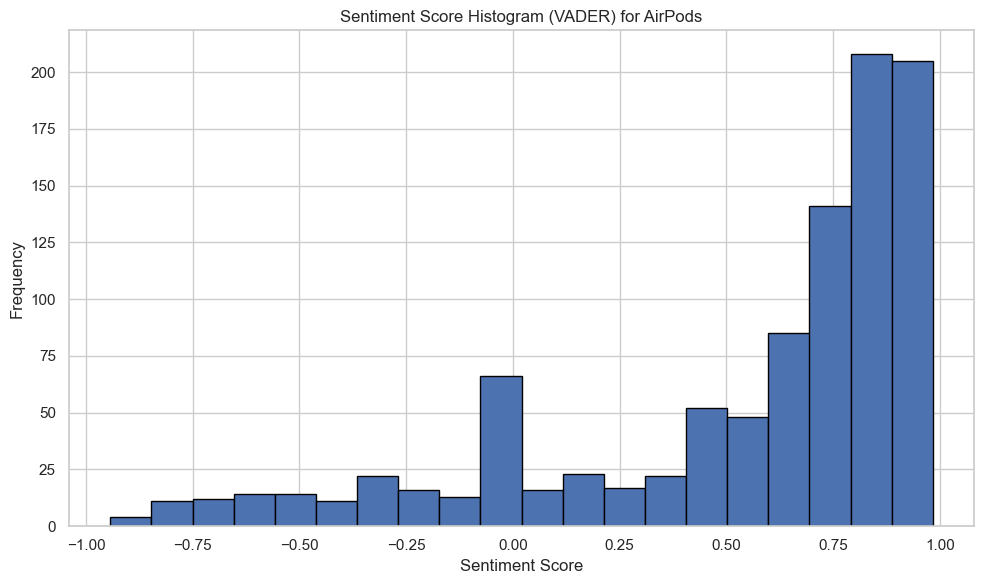

In [234]:
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.hist(df_airpods['SentimentScore_VADER'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (VADER) for AirPods')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


**25.5 Apple Watch**

In [235]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
analyzer = SentimentIntensityAnalyzer()

# Function to get the sentiment score using VADER
def get_sentiment_score(text):
    return analyzer.polarity_scores(text)['compound']

# Apply the function to the "Sentiment_Comment" column
df_watch['SentimentScore_VADER'] = df_watch['Sentiment_Comment'].apply(get_sentiment_score)

# Categorize the sentiment based on the sentiment score
df_watch['SentimentCategory_VADER'] = df_watch['SentimentScore_VADER'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))

# Print the DataFrame with sentiment scores and categories
df_watch[['Sentiment_Comment', 'SentimentScore_VADER', 'SentimentCategory_VADER']]


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1356089718.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_watch['SentimentScore_VADER'] = df_watch['Sentiment_Comment'].apply(get_sentiment_score)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1356089718.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_

,Sentiment_Comment,SentimentScore_VADER,SentimentCategory_VADER
1000,A computer on your wrist . Apple high quality ...,0.9765,Positive
1001,I lived with an watch [ SIZE ] for a bit even ...,0.9695,Positive
1002,After purchasing a new s I felt my s was looki...,0.9912,Positive
1003,I really wanted to have a larger screen and I ...,0.9539,Positive
1004,This watch is absolutely awesome ! I could go ...,0.9773,Positive
...,...,...,...
1995,great as all Apple products !,0.6588,Positive
1996,Grand new ! I am happy as hell,0.3382,Positive
1997,All Apple products are good .,0.4404,Positive
1998,Good quality very nice watch,0.7178,Positive


In [236]:
df_watch.SentimentScore_VADER.describe()

count    1000.000000
mean        0.592479
std         0.365253
min        -0.927400
25%         0.462775
50%         0.717800
75%         0.848100
max         0.991200
Name: SentimentScore_VADER, dtype: float64

In [237]:
sorted_df = df_watch.sort_values(by='SentimentScore_VADER', ascending=False)
top_5_comments_vader = sorted_df.head(5)
top_5_comments_vader
for i, comment in enumerate(top_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 After purchasing a new s7 I felt my s3 was looking a little worse for wear so decided to treat myself to a se watch. it’s not quite the s7 but it’s a massive step up from the s3.
The Apple Watch has to be one of the more stylish smartwatches around and the ability to swap out the straps is amazingly cool and easy. This is made so much better by the fact my s3  38mm bands all transfer over to my se 40mm and s7 41mm and all look awesome as a result!
Thank you apple for once again providing superb quality products at a fair price! I know a lot of people with think I’m mad but When you think about how everything just works together with apple products and this is what you pay the little extra for!
In my honest opinion the Apple Watch is the invention I have had the most fun with
and use out of!
Read full review...
-----------------------------------------------------------------------------------------------
1 I have had a few cheap fitness watches but the apple watch by far surpasses th

In [238]:
sorted_df = df_watch.sort_values(by='SentimentScore_VADER', ascending=True)
bad_5_comments_vader = sorted_df.head(5)
bad_5_comments_vader
for i, comment in enumerate(bad_5_comments_vader['Comment']):
    print(i, comment)
    print("-----------------------------------------------------------------------------------------------")

0 A lot of dead pixels, it was posted as used and some minow wear with scuffs and/or scratches, but dead pixels? its just unnacceptable. Not everyone has he time to return a product, time is money.
-----------------------------------------------------------------------------------------------
1 I did not pruchase this item, is was fraud someone hacked my account so PAYPAl cannot be trusted
-----------------------------------------------------------------------------------------------
2 It’s worth it you won’t see a price better than this. Bought mine a month ago works fine no problem no scratches no damages. Came in original apple packing only it was opened before than sealed back up
-----------------------------------------------------------------------------------------------
3 Just bought this, maybe 2 weeks ago, and now when I connect it to charge it acts like it is charging but won’t ever fully charge!!! If I wear it it is dead in 45min!!
------------------------------------------

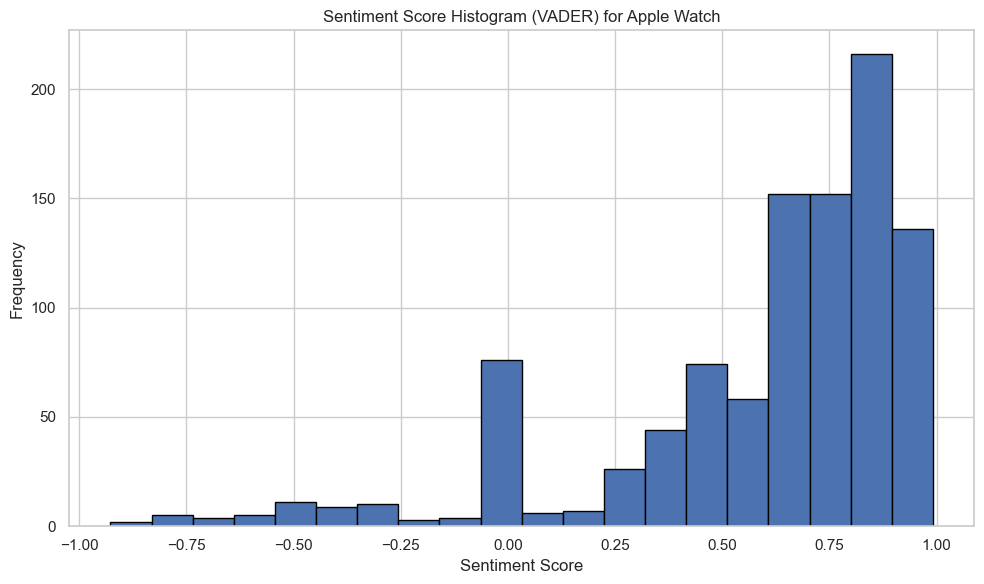

In [239]:
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.hist(df_watch['SentimentScore_VADER'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (VADER) for Apple Watch')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


**26. Conduct a sentiment analysis with NaiveBayesAnalyzer**

***26.1. iPhone***

In [240]:
#Conduct a sentiment analysis with NaiveBayesAnalyzer
from textblob import TextBlob
from textblob.sentiments import NaiveBayesAnalyzer
import nltk
nltk.download('movie_reviews')

def get_sentiment_textblob(text):
    blob = TextBlob(text, analyzer=NaiveBayesAnalyzer())
    sentiment = blob.sentiment
    if sentiment.p_pos >= 0.6:
        return "Positive"
    elif sentiment.p_neg >= 0.6:
        return "Negative"
    return "Neutral"

df_iphone['SentimentCategory_Bayes'] = df_iphone['Sentiment_Comment'].apply(get_sentiment_textblob)

df_iphone[['Sentiment_Comment', 'SentimentCategory_Bayes']]


[nltk_data] Downloading package movie_reviews to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2934576485.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone['SentimentCategory_Bayes'] = df_iphone['Sentiment_Comment'].apply(get_sentiment_textblob)


,Sentiment_Comment,SentimentCategory_Bayes
2000,I have owned and used an iPhone Of ( standard ...,Positive
2001,The [ SIZE ] iPhone of is one of the best prod...,Positive
2002,This is my first smartphone and because I am a...,Positive
2003,My wife likes to hang onto things and is not o...,Positive
2004,For the age of the phone It Is Quick and very ...,Positive
...,...,...
2995,Degraded to the bigger iPhone from the iPhone ...,Positive
2996,I have bought [ SIZE ] second iPhones one I se...,Negative
2997,Battery is draining very fast from [ SIZE ] % ...,Negative
2998,Dear perfect condition . Of . Such cheaper tha...,Positive


In [241]:
df_iphone[df_iphone.SentimentCategory_Bayes != df_iphone.SentimentCategory_VADER]

,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes
2007,Iphone,29.99,pre-owned,Was promised next day delivery but arrived a d...,promised next day delivery arrived day later g...,Was promised next day delivery but arrived a d...,29.99,1298,Cheap,"[promised, next, day, delivery, arrived, day, ...",3,-0.6126,Negative,Positive
2043,Iphone,0.99,pre-owned,I bought this iPhone last Christmas for being ...,bought iphone last christmas cheap one buy iph...,I bought this iPhone last Christmas for being ...,0.99,696,Cheap,"[bought, iphone, last, christmas, cheap, one, ...",1,-0.5890,Negative,Neutral
2045,Iphone,183.00,pre-owned,I upgraded from an iPhone 6s and I have found ...,upgrade iphone found great improvement day end...,I upgrade from an iPhone is and I have found t...,183.00,691,Expensive,"[upgrade, iphone, found, great, improvement, d...",3,0.9317,Positive,Negative
2049,Iphone,39.99,pre-owned,The 4s is over 7 years old so Apple have now ...,size year old apple declared phone obsolete ho...,The is is over [ SIZE ] years old so Apple hav...,39.99,675,Cheap,"[size, year, old, apple, declared, phone, obso...",1,-0.9277,Negative,Positive
2053,Iphone,39.99,pre-owned,"Was not sure what to expect, when both phones ...",sure expect phone arrived thought made mistake...,"Was not sure what to expect , when both phone ...",39.99,664,Cheap,"[sure, expect, phone, arrived, thought, made, ...",4,0.0065,Neutral,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2988,Iphone,39.99,pre-owned,Delivery excellent phone perfect condition ple...,delivery excellent phone perfect condition ple...,Delivery excellent phone perfect condition ple...,39.99,214,Cheap,"[delivery, excellent, phone, perfect, conditio...",4,0.9552,Positive,Neutral
2989,Iphone,24.99,pre-owned,"The phone was in great condition, but the only...",phone great condition problem take standard si...,"The phone was in great condition , but the onl...",24.99,214,Cheap,"[phone, great, condition, problem, take, stand...",1,0.0582,Positive,Negative
2993,Iphone,29.99,pre-owned,The ad implied the phone was unmarked but the ...,ad implied phone unmarred back case opinion ma...,The ad implied the phone was unmarred but the ...,29.99,213,Cheap,"[ad, implied, phone, unmarred, back, case, opi...",1,0.7227,Positive,Negative
2997,Iphone,85.00,pre-owned,Battery is draining very fast from 100% to 1% ...,battery draining fast size size max size hour ...,Battery is draining very fast from [ SIZE ] % ...,85.00,213,Expensive,"[battery, draining, fast, size, size, max, siz...",4,0.5267,Positive,Negative


***26.2. Macbook***

In [242]:
df_mac['SentimentCategory_Bayes'] = df_mac['Sentiment_Comment'].apply(get_sentiment_textblob)

df_mac[['Sentiment_Comment', 'SentimentCategory_Bayes']]

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/3820655831.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac['SentimentCategory_Bayes'] = df_mac['Sentiment_Comment'].apply(get_sentiment_textblob)


,Sentiment_Comment,SentimentCategory_Bayes
3000,"The [ SIZE ] MacBook Pro [ SIZE ] "" that I rec...",Positive
3001,"West value for money , not just from apple , b...",Positive
3002,"I have dived into the Sac walled garden , whic...",Positive
3003,This laptop does exactly what it needs to do ....,Positive
3004,Very happy with my purchase . The Macbook Air ...,Positive
...,...,...
3995,Apple the best of the best,Positive
3996,great color and protection,Positive
3997,Good quality for the price,Neutral
3998,Grand new and came quickly,Positive


In [243]:
df_mac[df_mac.SentimentCategory_Bayes != df_mac.SentimentCategory_VADER]

,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes
3005,Macbook,430.00,pre-owned,When I first saw apple were switching chips I ...,first saw apple twitching chip thought would e...,When I first saw apple were twitching chips I ...,430.00,1030,Expensive,"[first, saw, apple, twitching, chip, thought, ...",0,-0.3746,Negative,Positive
3006,Macbook,200.00,pre-owned,Bought this MacBook Pro 16” halfway expecting ...,bought macbook pro size ” halfway expecting so...,Bought this MacBook Pro [ SIZE ] ” halfway exp...,158.00,1013,Cheap,"[bought, macbook, pro, size, ”, halfway, expec...",4,-0.3528,Negative,Positive
3013,Macbook,179.00,refurbished,I needed a Mac to rescue my broken MBP. This w...,needed sac rescue broken mbp least expensive s...,I needed a Sac to rescue my broken MBP . This ...,141.41,741,Cheap,"[needed, sac, rescue, broken, mbp, least, expe...",0,0.9393,Positive,Negative
3020,Macbook,179.00,refurbished,Great little computer at a great value. We pu...,great little computer great value purchased si...,Great little computer at a great value . He pu...,141.41,674,Cheap,"[great, little, computer, great, value, purcha...",0,0.9771,Positive,Negative
3021,Macbook,750.00,pre-owned,I have the base model and for what I use it fo...,base model use plenty powerful build quality b...,I have the base model and for what I use it fo...,592.50,662,Expensive,"[base, model, use, plenty, powerful, build, qu...",1,0.9870,Positive,Negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3989,Macbook,0.00,pre-owned,Great product and features!,great product feature,Great product and features !,0.00,27,Cheap,"[great, product, feature]",1,0.6588,Positive,Neutral
3990,Macbook,200.00,others,great product as described.,great product described,great product as described .,158.00,27,Cheap,"[great, product, described]",1,0.6249,Positive,Neutral
3994,Macbook,0.00,pre-owned,Oh my gawd. It is so nice!,oh nice,Oh my and . It is so nice !,0.00,26,Cheap,"[oh, nice]",0,0.6005,Positive,Neutral
3997,Macbook,159.99,pre-owned,Good quality for the price,good quality price,Good quality for the price,159.99,26,Cheap,"[good, quality, price]",1,0.4404,Positive,Neutral


***26.3. iPad***

In [244]:
df_ipad['SentimentCategory_Bayes'] = df_ipad['Sentiment_Comment'].apply(get_sentiment_textblob)

df_ipad[['Sentiment_Comment', 'SentimentCategory_Bayes']]

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/691724193.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad['SentimentCategory_Bayes'] = df_ipad['Sentiment_Comment'].apply(get_sentiment_textblob)


,Sentiment_Comment,SentimentCategory_Bayes
4000,Good product but still very prices ! The ipad ...,Positive
4001,"My iPad [ SIZE ] was getting slow thanks , pro...",Positive
4002,My only criticism is that the charging lead in...,Positive
4003,So I just opened the box and unwrapped my new ...,Positive
4004,The IPAD AIR [ SIZE ] is still an of IPAD . Ho...,Positive
...,...,...
4995,Brilliant price and great ipad,Positive
4996,Last delivery no sons perfect,Positive
4997,Excellent tablet Recommend it,Neutral
4998,Product was very acceptable .,Negative


In [245]:
df_ipad[df_ipad.SentimentCategory_Bayes != df_ipad.SentimentCategory_VADER]

,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes
4004,iPad,21.00,pre-owned,"The IPAD AIR 2 is still an OK IPAD. However, w...",ipad air size still ipad however whilst probab...,The IPAD AIR [ SIZE ] is still an of IPAD . Ho...,21.0000,779,Cheap,"[ipad, air, size, still, ipad, however, whilst...",0,-0.0119,Neutral,Positive
4006,iPad,21.00,pre-owned,Bought for my daughter who is NOT easy to plea...,bought daughter easy please could find problem...,Bought for my daughter who is NOT easy to plea...,21.0000,663,Cheap,"[bought, daughter, easy, please, could, find, ...",0,0.9125,Positive,Negative
4007,iPad,149.99,pre-owned,"iPad has some scratches (back and side), but i...",ipad scratch back side okay refurbished size y...,"iPad has some scratches ( back and side ) , bu...",118.4921,645,Expensive,"[ipad, scratch, back, side, okay, refurbished,...",1,-0.3007,Negative,Positive
4009,iPad,5.00,pre-owned,I bought this for my son.\nThis iPad was my fi...,bought son ipad first apple product know much ...,I bought this for my son . This iPad was my fi...,5.0000,585,Cheap,"[bought, son, ipad, first, apple, product, kno...",2,-0.3356,Negative,Neutral
4011,iPad,114.00,pre-owned,It’s so much cheaper than 10th gen. I got a re...,much cheaper gen got really good deal slightly...,It is so much cheaper than with gen . I got a ...,114.0000,559,Expensive,"[much, cheaper, gen, got, really, good, deal, ...",0,0.8699,Positive,Negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4990,iPad,5.00,pre-owned,It does what I want very good,want good,It does what I want very good,5.0000,29,Cheap,"[want, good]",1,0.5413,Positive,Neutral
4991,iPad,149.99,pre-owned,This iPad is one of the best!,ipad one best,This iPad is one of the best !,118.4921,29,Expensive,"[ipad, one, best]",1,0.6696,Positive,Neutral
4993,iPad,5.00,pre-owned,Well cant down load face time,well load face time,Well cannot down load face time,5.0000,29,Cheap,"[well, load, face, time]",1,0.2732,Positive,Neutral
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921,29,Expensive,"[excellent, tablet, recommend]",0,0.7351,Positive,Neutral


***26.4. AirPods***

In [246]:
df_airpods['SentimentCategory_Bayes'] = df_airpods['Sentiment_Comment'].apply(get_sentiment_textblob)

df_airpods[['Sentiment_Comment', 'SentimentCategory_Bayes']]

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2190496483.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_airpods['SentimentCategory_Bayes'] = df_airpods['Sentiment_Comment'].apply(get_sentiment_textblob)


,Sentiment_Comment,SentimentCategory_Bayes
0,"Bought these for teenage daughter on may , sig...",Positive
1,I bought these refurbished set of AirPods and ...,Positive
2,Pros : sound quality is excellent if you can g...,Positive
3,"What a clever little set of earphones , withou...",Positive
4,The Apple AirPod Pro is a fantastic set of tir...,Positive
...,...,...
995,Stopped working after a couple of weeks,Neutral
996,The product is as promised . Any thanks,Neutral
997,"Larger stopped firing , waste my money",Negative
998,No faults at all happy with my purchase,Positive


In [247]:
df_airpods[df_airpods.SentimentCategory_Bayes != df_airpods.SentimentCategory_VADER]

,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes
6,AirPods,389.99,pre-owned,"These are decent headphones, reasonably comfor...",decent headphone reasonably comfortable end ne...,"These are decent headphones , reasonably comfo...",389.99,536,Expensive,"[decent, headphone, reasonably, comfortable, e...",1,-0.8263,Negative,Positive
11,AirPods,139.99,new,This item did not behave at all as expected. W...,item behave expected whilst airpods connect ph...,This item did not behave at all as expected . ...,139.99,423,Expensive,"[item, behave, expected, whilst, airpods, conn...",3,-0.5994,Negative,Neutral
13,AirPods,139.99,new,The AirPods Pro I was very disappointed in th...,airpods pro disappointed one work charge case ...,The AirPods Pro I was very disappointed in the...,139.99,398,Expensive,"[airpods, pro, disappointed, one, work, charge...",3,-0.6990,Negative,Positive
25,AirPods,139.99,new,They work nicely and have all the AirPods Pro ...,work nicely airpods pro feature really like ho...,They work nicely and have all the AirPods Pro ...,139.99,350,Expensive,"[work, nicely, airpods, pro, feature, really, ...",2,0.7574,Positive,Neutral
33,AirPods,139.99,refurbished,"Noise cancellation doesn't work.\nThese ""refur...",noise cancellation work return always hit miss...,"Noise cancellation does not work . These "" ret...",139.99,326,Expensive,"[noise, cancellation, work, return, always, hi...",1,-0.9113,Negative,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,AirPods,139.99,new,Pretty good quality and for a good price,pretty good quality good price,Pretty good quality and for a good price,139.99,40,Expensive,"[pretty, good, quality, good, price]",1,0.8402,Positive,Neutral
995,AirPods,139.99,new,Stopped working after a couple of weeks,stopped working couple week,Stopped working after a couple of weeks,139.99,39,Expensive,"[stopped, working, couple, week]",4,-0.2263,Negative,Neutral
996,AirPods,69.99,new,The product is as promised. Many thanks,product promised thanks,The product is as promised . Any thanks,69.99,39,Cheap,"[product, promised, thanks]",3,0.6597,Positive,Neutral
998,AirPods,69.99,pre-owned,No faults at all happy with my purchase,fault happy purchase,No faults at all happy with my purchase,69.99,39,Cheap,"[fault, happy, purchase]",1,-0.1531,Negative,Positive


***26.5. Apple Watch***

In [248]:
df_watch['SentimentCategory_Bayes'] = df_watch['Sentiment_Comment'].apply(get_sentiment_textblob)

df_watch[['Sentiment_Comment', 'SentimentCategory_Bayes']]

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1921659000.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_watch['SentimentCategory_Bayes'] = df_watch['Sentiment_Comment'].apply(get_sentiment_textblob)


,Sentiment_Comment,SentimentCategory_Bayes
1000,A computer on your wrist . Apple high quality ...,Positive
1001,I lived with an watch [ SIZE ] for a bit even ...,Positive
1002,After purchasing a new s I felt my s was looki...,Positive
1003,I really wanted to have a larger screen and I ...,Positive
1004,This watch is absolutely awesome ! I could go ...,Positive
...,...,...
1995,great as all Apple products !,Neutral
1996,Grand new ! I am happy as hell,Positive
1997,All Apple products are good .,Negative
1998,Good quality very nice watch,Positive


In [249]:
df_watch[df_watch.SentimentCategory_Bayes != df_watch.SentimentCategory_VADER]

,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes
1019,Apple Watch,219.99,pre-owned,"Perfect Quality, had very late shipping.. said...",perfect quality late shipping said awaiting pa...,"Perfect Quality , had very late shipping . . s...",173.7921,462,Expensive,"[perfect, quality, late, shipping, said, await...",3,0.3213,Positive,Negative
1020,Apple Watch,419.95,pre-owned,I have Atrial Fibrillation(Afib) and Congestiv...,trial fibrillation fig congestive heart failur...,I have Trial Fibrillation ( Fig ) and Congesti...,331.7605,451,Expensive,"[trial, fibrillation, fig, congestive, heart, ...",1,-0.2960,Negative,Positive
1039,Apple Watch,159.99,pre-owned,"I’ve had series 1, 3, 4 and 5 but didn’t upgra...",series size size size size upgrade series size...,"I have had series [ SIZE ] , [ SIZE ] , [ SIZE...",159.9900,336,Expensive,"[series, size, size, size, size, upgrade, seri...",3,0.3590,Positive,Negative
1044,Apple Watch,33.00,pre-owned,"Best product on Apple's product line, however ...",west product apple product line however iphone...,"West product on Apple ' s product line , howev...",33.0000,317,Cheap,"[west, product, apple, product, line, however,...",3,0.8775,Positive,Negative
1051,Apple Watch,219.99,pre-owned,Everything was pretty much as advertised. The ...,everything pretty much advertised thing keepin...,Everything was pretty much as advertised . The...,173.7921,295,Expensive,"[everything, pretty, much, advertised, thing, ...",3,-0.1065,Negative,Neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1992,Apple Watch,16.00,pre-owned,Apple stands out once again!,apple stand,Apple stands out once again !,16.0000,28,Cheap,"[apple, stand]",1,0.0000,Neutral,Positive
1993,Apple Watch,85.00,pre-owned,Good quality item. Recommend,good quality item recommend,Good quality item . Recommend,85.0000,28,Cheap,"[good, quality, item, recommend]",4,0.6597,Positive,Neutral
1995,Apple Watch,150.00,pre-owned,great as all Apple products!,great apple product,great as all Apple products !,150.0000,28,Cheap,"[great, apple, product]",4,0.6588,Positive,Neutral
1997,Apple Watch,219.99,new,All Apple products are good.,apple product good,All Apple products are good .,173.7921,28,Expensive,"[apple, product, good]",4,0.4404,Positive,Negative


**27. Conduct a sentiment analysis with SocialSent**

In [250]:
#Import the SocialSent dataset
df_lex = pd.read_csv("2000.tsv", sep="\t", header=None)
df_lex.columns=["word","sentiment", "std.dev"]
df_lex

,word,sentiment,std.dev
0,ugly,-3.90,1.16
1,painful,-3.69,1.53
2,intent,-3.49,1.67
3,terrible,-3.38,1.55
4,drunk,-3.28,1.16
...,...,...,...
4919,perfectly,2.69,0.83
4920,romantic,2.70,0.76
4921,delicate,2.72,0.93
4922,beautiful,2.73,0.69


In [251]:
df_lex["sentiment"].describe()

count    4924.000000
mean        0.000014
std         0.737869
min        -3.900000
25%        -0.290000
50%         0.050000
75%         0.350000
max         2.760000
Name: sentiment, dtype: float64

In [252]:
df_lex.sort_values(by='sentiment', ascending=True)

,word,sentiment,std.dev
0,ugly,-3.90,1.16
1,painful,-3.69,1.53
2,intent,-3.49,1.67
3,terrible,-3.38,1.55
4,drunk,-3.28,1.16
...,...,...,...
4919,perfectly,2.69,0.83
4920,romantic,2.70,0.76
4921,delicate,2.72,0.93
4922,beautiful,2.73,0.69


In [253]:
df_lex.sort_values(by='sentiment', ascending=False)

,word,sentiment,std.dev
4923,wonderful,2.76,0.71
4922,beautiful,2.73,0.69
4921,delicate,2.72,0.93
4920,romantic,2.70,0.76
4919,perfectly,2.69,0.83
...,...,...,...
4,drunk,-3.28,1.16
3,terrible,-3.38,1.55
2,intent,-3.49,1.67
1,painful,-3.69,1.53


In [254]:
#Create a mapping dictionary for the words with sentiment scores
mapping = {}
for row in df_lex[["word", "sentiment"]].to_dict("records"):
  mapping[row["word"]] = row["sentiment"]
mapping

{'ugly': -3.9,
 'painful': -3.69,
 'intent': -3.49,
 'terrible': -3.38,
 'drunk': -3.28,
 'tragedy': -3.26,
 'awful': -3.21,
 'weak': -3.12,
 'worst': -3.1,
 'accident': -3.03,
 'nightmare': -3.02,
 'victim': -3.01,
 'destruction': -2.95,
 'faced': -2.93,
 'damned': -2.92,
 'souls': -2.92,
 'scary': -2.92,
 'poverty': -2.89,
 'suicide': -2.85,
 'events': -2.85,
 'sorts': -2.84,
 'trapped': -2.83,
 'monster': -2.82,
 'lonely': -2.8,
 'circles': -2.8,
 'scream': -2.79,
 'ridiculous': -2.76,
 'situations': -2.75,
 'fate': -2.69,
 'stupid': -2.67,
 'bitter': -2.66,
 'rural': -2.66,
 'harsh': -2.66,
 'fault': -2.62,
 're': -2.6,
 'occurred': -2.6,
 'circumstances': -2.59,
 'blame': -2.59,
 'housing': -2.58,
 'snake': -2.58,
 'bored': -2.56,
 'blacks': -2.55,
 'sick': -2.53,
 'dragon': -2.51,
 'complained': -2.51,
 'nasty': -2.5,
 'tired': -2.49,
 'acts': -2.48,
 'bloody': -2.48,
 'beast': -2.47,
 'smelled': -2.44,
 'minority': -2.43,
 'incident': -2.42,
 'boring': -2.42,
 'creatures': -2.42

***27.1. iPhone***

In [255]:
#Conduct a sentiment analysis with SocialSent
def sentiment_score(row):
  text = row["Sentiment_Comment"].lower()
  score = 0
  n = 0
  for word in text.split():
    if word in mapping:
      n += 1
      score += mapping[word]
  if n > 0:
    return score / n
  return 0

df_iphone["SentimentScore_SocialSent"] = df_iphone.apply(sentiment_score, axis=1)
df_iphone

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1900151924.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone["SentimentScore_SocialSent"] = df_iphone.apply(sentiment_score, axis=1)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent
2000,Iphone,183.00,pre-owned,I've owned and used an iPhone 6S (standard siz...,owned used iphone standard size since came alm...,I have owned and used an iPhone Of ( standard ...,183.00,1921,Expensive,"[owned, used, iphone, standard, size, since, c...",4,0.9936,Positive,Positive,0.107226
2001,Iphone,159.99,new,The 2016 iPhone SE is one of the best products...,size iphone one best product apple ever made c...,The [ SIZE ] iPhone of is one of the best prod...,159.99,1534,Expensive,"[size, iphone, one, best, product, apple, ever...",4,0.9935,Positive,Positive,0.083393
2002,Iphone,5.00,pre-owned,This is my first smartphone and because I am a...,first smartphone skinflint old unlocked model ...,This is my first smartphone and because I am a...,5.00,1478,Cheap,"[first, smartphone, skinflint, old, unlocked, ...",4,0.9452,Positive,Positive,0.029910
2003,Iphone,339.99,pre-owned,My wife likes to hang onto things and is not o...,wife like hang onto thing one unnecessary chan...,My wife likes to hang onto things and is not o...,339.99,1417,Expensive,"[wife, like, hang, onto, thing, one, unnecessa...",3,0.9720,Positive,Positive,0.077732
2004,Iphone,159.99,pre-owned,For the age of the phone It Is Quick and very ...,age phone quick unfordable able run latest sof...,For the age of the phone It Is Quick and very ...,159.99,1366,Expensive,"[age, phone, quick, unfordable, able, run, lat...",4,0.4245,Positive,Positive,0.005800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,Iphone,580.00,new,Upgraded to the bigger iPhone from the iPhone ...,degraded bigger iphone iphone size pro believe...,Degraded to the bigger iPhone from the iPhone ...,580.00,213,Expensive,"[degraded, bigger, iphone, iphone, size, pro, ...",4,0.8169,Positive,Positive,0.116875
2996,Iphone,5.00,pre-owned,I have bought 3 second iPhones one I sent back...,bought size second iphones one sent back terri...,I have bought [ SIZE ] second iPhones one I se...,5.00,213,Cheap,"[bought, size, second, iphones, one, sent, bac...",4,-0.2263,Negative,Negative,-0.128667
2997,Iphone,85.00,pre-owned,Battery is draining very fast from 100% to 1% ...,battery draining fast size size max size hour ...,Battery is draining very fast from [ SIZE ] % ...,85.00,213,Expensive,"[battery, draining, fast, size, size, max, siz...",4,0.5267,Positive,Negative,0.113000
2998,Iphone,379.99,others,Near perfect condition. 5G. Much cheaper than ...,dear perfect condition cheaper latest inclinat...,Dear perfect condition . Of . Such cheaper tha...,379.99,213,Expensive,"[dear, perfect, condition, cheaper, latest, in...",4,-0.2439,Negative,Positive,0.227692


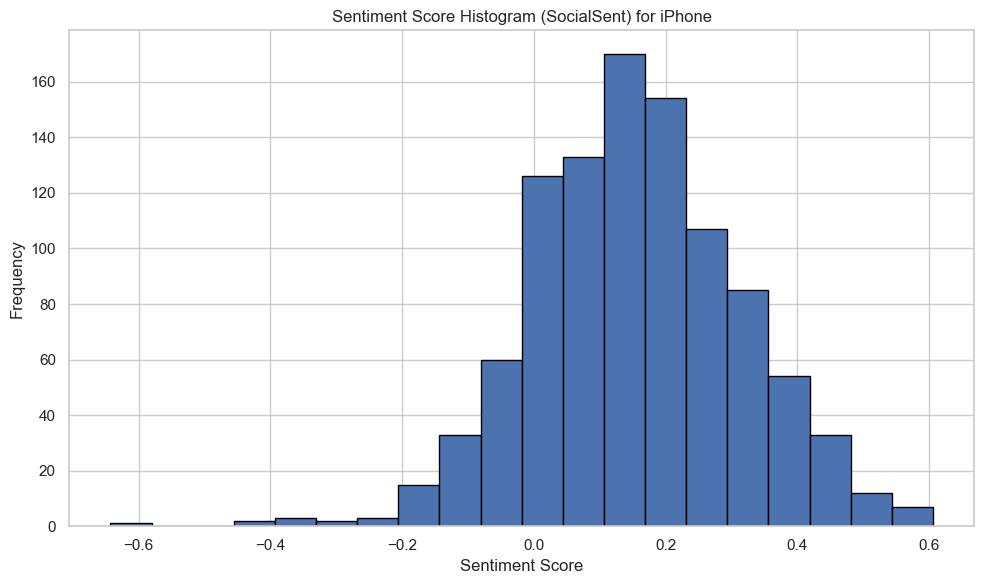

In [256]:
#Plot the histogram of SocialSent sentiment scores
plt.figure(figsize=(10, 6))
plt.hist(df_iphone['SentimentScore_SocialSent'], bins=20, edgecolor='black')
plt.title('Sentiment Score Histogram (SocialSent) for iPhone')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [257]:
sorted_df = df_iphone.sort_values(by='SentimentScore_SocialSent', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 The phone came in brand new condition and works perfectly! Camera quality is honestly incredible, the phone works really fast and the design is beautiful. I use to have the iPhone 5S and the difference is massive. It's really improved, Couldn't be happier :)
---------------------------------------------------------------------------------------------------
1 Beautiful, neat and wonderful iPhone 6s Plus in my hands , . Very durable I have no doubt I will use it for many years to come . The battery health was strong and able to hold charge very well . My friend loves it as well
---------------------------------------------------------------------------------------------------
2 Bought as an intro smartphone for my wife. She has never used a smartphone before and is enjoying getting used to the i-phone. It guides you pretty well through many of the operations and is fairly instinctive to set up and use. It is nice to see her confidence in using it growing fast. Seems very solidly put to

In [258]:
sorted_df = df_iphone.sort_values(by='SentimentScore_SocialSent', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 I think these iPhone 7s suffer from weak battery life. I don’t know if this one had a replacement screen or not but it was weak and cracked due to some unknown incident after a couple of days. It was a good second hand price though.
---------------------------------------------------------------------------------------------------
1 first one faulty had a lot of trouble to resolve,ebay assisted. replacement also developed a fault company not interested in sorting it out, warranty is useless.
it seems they buy in a lot of faulty phones and make a poor attempt at fixing them. buy elswhere.
---------------------------------------------------------------------------------------------------
2 does not charge at all waste of my time and money very upset... I didnt care if this phone called or did anything else the thing i needed it to do was charge and of course it couldn't.. NEVER BUY THIS you will be upset
----------------------------------------------------------------------------------

In [259]:
# Categorize the sentiment based on the sentiment score
df_iphone['SentimentCategory_SocialSent'] = df_iphone['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))
df_iphone


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1686458130.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone['SentimentCategory_SocialSent'] = df_iphone['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent
2000,Iphone,183.00,pre-owned,I've owned and used an iPhone 6S (standard siz...,owned used iphone standard size since came alm...,I have owned and used an iPhone Of ( standard ...,183.00,1921,Expensive,"[owned, used, iphone, standard, size, since, c...",4,0.9936,Positive,Positive,0.107226,Positive
2001,Iphone,159.99,new,The 2016 iPhone SE is one of the best products...,size iphone one best product apple ever made c...,The [ SIZE ] iPhone of is one of the best prod...,159.99,1534,Expensive,"[size, iphone, one, best, product, apple, ever...",4,0.9935,Positive,Positive,0.083393,Positive
2002,Iphone,5.00,pre-owned,This is my first smartphone and because I am a...,first smartphone skinflint old unlocked model ...,This is my first smartphone and because I am a...,5.00,1478,Cheap,"[first, smartphone, skinflint, old, unlocked, ...",4,0.9452,Positive,Positive,0.029910,Neutral
2003,Iphone,339.99,pre-owned,My wife likes to hang onto things and is not o...,wife like hang onto thing one unnecessary chan...,My wife likes to hang onto things and is not o...,339.99,1417,Expensive,"[wife, like, hang, onto, thing, one, unnecessa...",3,0.9720,Positive,Positive,0.077732,Positive
2004,Iphone,159.99,pre-owned,For the age of the phone It Is Quick and very ...,age phone quick unfordable able run latest sof...,For the age of the phone It Is Quick and very ...,159.99,1366,Expensive,"[age, phone, quick, unfordable, able, run, lat...",4,0.4245,Positive,Positive,0.005800,Neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,Iphone,580.00,new,Upgraded to the bigger iPhone from the iPhone ...,degraded bigger iphone iphone size pro believe...,Degraded to the bigger iPhone from the iPhone ...,580.00,213,Expensive,"[degraded, bigger, iphone, iphone, size, pro, ...",4,0.8169,Positive,Positive,0.116875,Positive
2996,Iphone,5.00,pre-owned,I have bought 3 second iPhones one I sent back...,bought size second iphones one sent back terri...,I have bought [ SIZE ] second iPhones one I se...,5.00,213,Cheap,"[bought, size, second, iphones, one, sent, bac...",4,-0.2263,Negative,Negative,-0.128667,Negative
2997,Iphone,85.00,pre-owned,Battery is draining very fast from 100% to 1% ...,battery draining fast size size max size hour ...,Battery is draining very fast from [ SIZE ] % ...,85.00,213,Expensive,"[battery, draining, fast, size, size, max, siz...",4,0.5267,Positive,Negative,0.113000,Positive
2998,Iphone,379.99,others,Near perfect condition. 5G. Much cheaper than ...,dear perfect condition cheaper latest inclinat...,Dear perfect condition . Of . Such cheaper tha...,379.99,213,Expensive,"[dear, perfect, condition, cheaper, latest, in...",4,-0.2439,Negative,Positive,0.227692,Positive


***27.2. Macbook***

In [261]:
df_mac["SentimentScore_SocialSent"] = df_mac.apply(sentiment_score, axis=1)
df_mac

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2924118264.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac["SentimentScore_SocialSent"] = df_mac.apply(sentiment_score, axis=1)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent
3000,Macbook,0.00,others,"The 2019 MacBook Pro 16"" that I received was e...",size macbook pro size received exactly describ...,"The [ SIZE ] MacBook Pro [ SIZE ] "" that I rec...",0.00,3078,Cheap,"[size, macbook, pro, size, received, exactly, ...",2,0.9945,Positive,Positive,0.110290
3001,Macbook,550.00,new,"Best value for money, not just from apple, but...",west value money apple compared existing lapto...,"West value for money , not just from apple , b...",434.50,1415,Expensive,"[west, value, money, apple, compared, existing...",0,0.9917,Positive,Positive,0.156446
3002,Macbook,0.00,pre-owned,"I have dived into the Mac walled garden, which...",dived sac walled garden avoided year good bad ...,"I have dived into the Sac walled garden , whic...",0.00,1181,Cheap,"[dived, sac, walled, garden, avoided, year, go...",0,0.9932,Positive,Positive,0.324051
3003,Macbook,750.00,pre-owned,This laptop does exactly what it needs to do. ...,laptop exactly need apple processor delivers h...,This laptop does exactly what it needs to do ....,592.50,1121,Expensive,"[laptop, exactly, need, apple, processor, deli...",2,0.9907,Positive,Positive,0.029487
3004,Macbook,179.00,refurbished,Very happy with my purchase. The Macbook Air 1...,happy purchase macbook air size arrived time c...,Very happy with my purchase . The Macbook Air ...,141.41,1084,Cheap,"[happy, purchase, macbook, air, size, arrived,...",4,0.9586,Positive,Positive,0.037500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,Macbook,850.00,new,Apple the best of the best,apple best best,Apple the best of the best,671.50,26,Expensive,"[apple, best, best]",0,0.8555,Positive,Positive,1.150000
3996,Macbook,900.00,pre-owned,great color and protection,great color protection,great color and protection,711.00,26,Expensive,"[great, color, protection]",1,0.6249,Positive,Positive,0.453333
3997,Macbook,159.99,pre-owned,Good quality for the price,good quality price,Good quality for the price,159.99,26,Cheap,"[good, quality, price]",1,0.4404,Positive,Neutral,0.915000
3998,Macbook,550.00,new,Brand new and came quickly,grand new came quickly,Grand new and came quickly,434.50,26,Expensive,"[grand, new, came, quickly]",4,0.4588,Positive,Positive,-0.070000


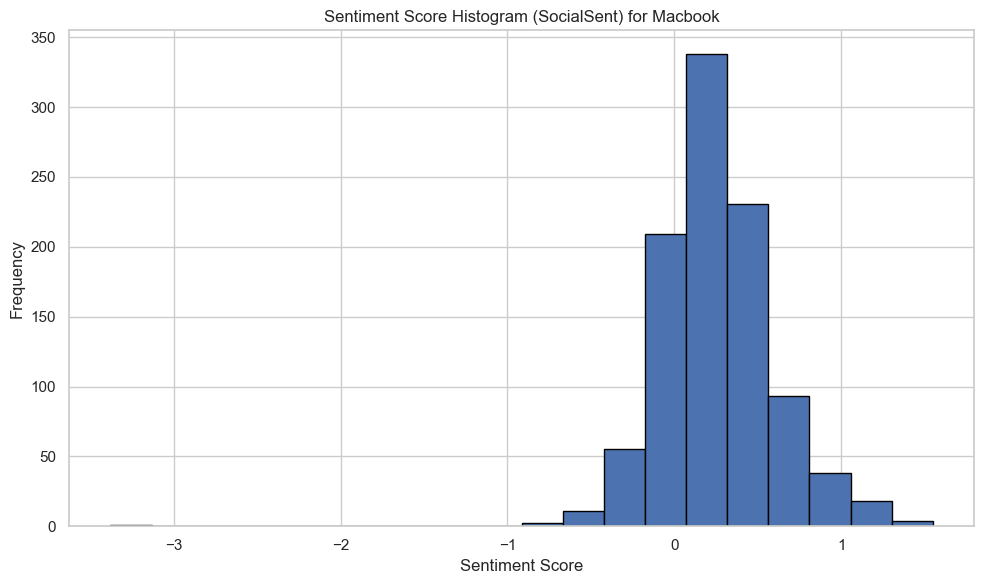

In [262]:
plt.figure(figsize=(10, 6))
plt.hist(df_mac['SentimentScore_SocialSent'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (SocialSent) for Macbook')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [263]:
sorted_df = df_mac.sort_values(by='SentimentScore_SocialSent', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 the macbook works perfectly!!! My wife is happy!
---------------------------------------------------------------------------------------------------
1 Oh my gawd. It is so nice!
---------------------------------------------------------------------------------------------------
2 Great Outstanding Hardware
---------------------------------------------------------------------------------------------------
3 Just like new!! Thank you!!
---------------------------------------------------------------------------------------------------
4 Great product and features!
---------------------------------------------------------------------------------------------------
5 Great laptop and good value.
---------------------------------------------------------------------------------------------------
6 Brilliant quality and a amazing price
---------------------------------------------------------------------------------------------------
7 Great price, great quality!
------------------------------

In [264]:
sorted_df = df_mac.sort_values(by='SentimentScore_SocialSent', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Terrible terrible terrible.
---------------------------------------------------------------------------------------------------
1 The laptop I bought is practically new, I love it!
---------------------------------------------------------------------------------------------------
2 Delivered on time, precisely.
---------------------------------------------------------------------------------------------------
3 Delighted with this excellent laptop in superb condition.
---------------------------------------------------------------------------------------------------
4 Love it … perfect condition !!!
---------------------------------------------------------------------------------------------------
5 Was very disappointed in this purchase.
---------------------------------------------------------------------------------------------------
6 Excellent condition and no problems so far.
---------------------------------------------------------------------------------------------------
7 I

In [265]:
# Categorize the sentiment based on the sentiment score
df_mac['SentimentCategory_SocialSent'] = df_mac['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))
df_mac


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2596257996.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac['SentimentCategory_SocialSent'] = df_mac['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent
3000,Macbook,0.00,others,"The 2019 MacBook Pro 16"" that I received was e...",size macbook pro size received exactly describ...,"The [ SIZE ] MacBook Pro [ SIZE ] "" that I rec...",0.00,3078,Cheap,"[size, macbook, pro, size, received, exactly, ...",2,0.9945,Positive,Positive,0.110290,Positive
3001,Macbook,550.00,new,"Best value for money, not just from apple, but...",west value money apple compared existing lapto...,"West value for money , not just from apple , b...",434.50,1415,Expensive,"[west, value, money, apple, compared, existing...",0,0.9917,Positive,Positive,0.156446,Positive
3002,Macbook,0.00,pre-owned,"I have dived into the Mac walled garden, which...",dived sac walled garden avoided year good bad ...,"I have dived into the Sac walled garden , whic...",0.00,1181,Cheap,"[dived, sac, walled, garden, avoided, year, go...",0,0.9932,Positive,Positive,0.324051,Positive
3003,Macbook,750.00,pre-owned,This laptop does exactly what it needs to do. ...,laptop exactly need apple processor delivers h...,This laptop does exactly what it needs to do ....,592.50,1121,Expensive,"[laptop, exactly, need, apple, processor, deli...",2,0.9907,Positive,Positive,0.029487,Neutral
3004,Macbook,179.00,refurbished,Very happy with my purchase. The Macbook Air 1...,happy purchase macbook air size arrived time c...,Very happy with my purchase . The Macbook Air ...,141.41,1084,Cheap,"[happy, purchase, macbook, air, size, arrived,...",4,0.9586,Positive,Positive,0.037500,Neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,Macbook,850.00,new,Apple the best of the best,apple best best,Apple the best of the best,671.50,26,Expensive,"[apple, best, best]",0,0.8555,Positive,Positive,1.150000,Positive
3996,Macbook,900.00,pre-owned,great color and protection,great color protection,great color and protection,711.00,26,Expensive,"[great, color, protection]",1,0.6249,Positive,Positive,0.453333,Positive
3997,Macbook,159.99,pre-owned,Good quality for the price,good quality price,Good quality for the price,159.99,26,Cheap,"[good, quality, price]",1,0.4404,Positive,Neutral,0.915000,Positive
3998,Macbook,550.00,new,Brand new and came quickly,grand new came quickly,Grand new and came quickly,434.50,26,Expensive,"[grand, new, came, quickly]",4,0.4588,Positive,Positive,-0.070000,Negative


***27.3. iPad***

In [267]:
df_ipad["SentimentScore_SocialSent"] = df_ipad.apply(sentiment_score, axis=1)
df_ipad

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1361102979.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad["SentimentScore_SocialSent"] = df_ipad.apply(sentiment_score, axis=1)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent
4000,iPad,410.00,pre-owned,Good product but still very pricey! The ipad a...,good product still price ipad air better chip ...,Good product but still very prices ! The ipad ...,410.0000,1284,Expensive,"[good, product, still, price, ipad, air, bette...",3,0.5308,Positive,Positive,0.048571
4001,iPad,21.00,pre-owned,"My iPad 2 was getting slow thanks, probably, t...",ipad size getting slow thanks probably later a...,"My iPad [ SIZE ] was getting slow thanks , pro...",21.0000,1163,Cheap,"[ipad, size, getting, slow, thanks, probably, ...",1,0.9887,Positive,Positive,0.098298
4002,iPad,5.00,pre-owned,My only criticism is that the charging lead in...,criticism charging lead picture suggests newer...,My only criticism is that the charging lead in...,5.0000,1011,Cheap,"[criticism, charging, lead, picture, suggests,...",3,0.9886,Positive,Positive,0.081000
4003,iPad,149.99,pre-owned,So I just opened the box and unwrapped my new ...,opened box unwrapped new ipad first look ipad ...,So I just opened the box and unwrapped my new ...,118.4921,938,Expensive,"[opened, box, unwrapped, new, ipad, first, loo...",2,0.9791,Positive,Positive,0.205424
4004,iPad,21.00,pre-owned,"The IPAD AIR 2 is still an OK IPAD. However, w...",ipad air size still ipad however whilst probab...,The IPAD AIR [ SIZE ] is still an of IPAD . Ho...,21.0000,779,Cheap,"[ipad, air, size, still, ipad, however, whilst...",0,-0.0119,Neutral,Positive,0.221964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,iPad,5.00,refurbished,Brillant price and great ipad,brilliant price great ipad,Brilliant price and great ipad,5.0000,29,Cheap,"[brilliant, price, great, ipad]",0,0.8360,Positive,Positive,1.316667
4996,iPad,5.00,pre-owned,Fast delivery no cons perfect,last delivery son perfect,Last delivery no sons perfect,5.0000,29,Cheap,"[last, delivery, son, perfect]",0,0.3612,Positive,Positive,0.593333
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921,29,Expensive,"[excellent, tablet, recommend]",0,0.7351,Positive,Neutral,0.000000
4998,iPad,149.99,pre-owned,Product was very acceptable.,product acceptable,Product was very acceptable .,118.4921,28,Expensive,"[product, acceptable]",0,0.3804,Positive,Negative,0.290000


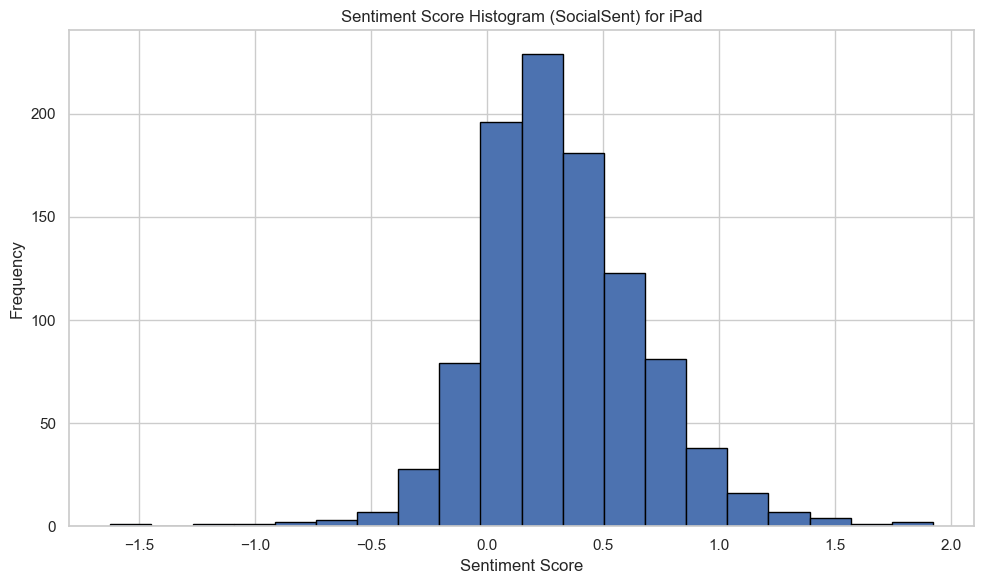

In [268]:
plt.figure(figsize=(10, 6))
plt.hist(df_ipad['SentimentScore_SocialSent'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (SocialSent) for iPad')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [269]:
sorted_df = df_ipad.sort_values(by='SentimentScore_SocialSent', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Great iPad fir my grandsons birthday he is suited
---------------------------------------------------------------------------------------------------
1 This is a brilliant iPad, would recommend👌
---------------------------------------------------------------------------------------------------
2 Thankyou my son will love this birthday gift
---------------------------------------------------------------------------------------------------
3 My Son is Enjoying his Birthday Gift! Thanks
---------------------------------------------------------------------------------------------------
4 First class iPad. Wonderful xmas gift for my daughter. She will love it. Thank you
---------------------------------------------------------------------------------------------------
5 Brilliant quality, just like new
---------------------------------------------------------------------------------------------------
6 This iPad is one of the best!
---------------------------------------------------------

In [270]:
sorted_df = df_ipad.sort_values(by='SentimentScore_SocialSent', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Can’t fault it, excellent condition, perfect😊
---------------------------------------------------------------------------------------------------
1 This is just like a new one. Bought it for my granddaughter. Can't fault it !
---------------------------------------------------------------------------------------------------
2 iPad in good condition with the fault condition accurately described.
---------------------------------------------------------------------------------------------------
3 As the supplier has supplied an incorrect item I am very disappointed with it and have complained to them
---------------------------------------------------------------------------------------------------
4 Totally knackered when I got it so it went in the bin
---------------------------------------------------------------------------------------------------
5 If the screen was working if would of been so good it's a shame it is a good iPad
----------------------------------------------------

In [271]:
# Categorize the sentiment based on the sentiment score
df_ipad['SentimentCategory_SocialSent'] = df_ipad['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))
df_ipad


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1972745783.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad['SentimentCategory_SocialSent'] = df_ipad['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent
4000,iPad,410.00,pre-owned,Good product but still very pricey! The ipad a...,good product still price ipad air better chip ...,Good product but still very prices ! The ipad ...,410.0000,1284,Expensive,"[good, product, still, price, ipad, air, bette...",3,0.5308,Positive,Positive,0.048571,Neutral
4001,iPad,21.00,pre-owned,"My iPad 2 was getting slow thanks, probably, t...",ipad size getting slow thanks probably later a...,"My iPad [ SIZE ] was getting slow thanks , pro...",21.0000,1163,Cheap,"[ipad, size, getting, slow, thanks, probably, ...",1,0.9887,Positive,Positive,0.098298,Positive
4002,iPad,5.00,pre-owned,My only criticism is that the charging lead in...,criticism charging lead picture suggests newer...,My only criticism is that the charging lead in...,5.0000,1011,Cheap,"[criticism, charging, lead, picture, suggests,...",3,0.9886,Positive,Positive,0.081000,Positive
4003,iPad,149.99,pre-owned,So I just opened the box and unwrapped my new ...,opened box unwrapped new ipad first look ipad ...,So I just opened the box and unwrapped my new ...,118.4921,938,Expensive,"[opened, box, unwrapped, new, ipad, first, loo...",2,0.9791,Positive,Positive,0.205424,Positive
4004,iPad,21.00,pre-owned,"The IPAD AIR 2 is still an OK IPAD. However, w...",ipad air size still ipad however whilst probab...,The IPAD AIR [ SIZE ] is still an of IPAD . Ho...,21.0000,779,Cheap,"[ipad, air, size, still, ipad, however, whilst...",0,-0.0119,Neutral,Positive,0.221964,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,iPad,5.00,refurbished,Brillant price and great ipad,brilliant price great ipad,Brilliant price and great ipad,5.0000,29,Cheap,"[brilliant, price, great, ipad]",0,0.8360,Positive,Positive,1.316667,Positive
4996,iPad,5.00,pre-owned,Fast delivery no cons perfect,last delivery son perfect,Last delivery no sons perfect,5.0000,29,Cheap,"[last, delivery, son, perfect]",0,0.3612,Positive,Positive,0.593333,Positive
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921,29,Expensive,"[excellent, tablet, recommend]",0,0.7351,Positive,Neutral,0.000000,Neutral
4998,iPad,149.99,pre-owned,Product was very acceptable.,product acceptable,Product was very acceptable .,118.4921,28,Expensive,"[product, acceptable]",0,0.3804,Positive,Negative,0.290000,Positive


***27.4. AirPods***

In [273]:
df_airpods["SentimentScore_SocialSent"] = df_airpods.apply(sentiment_score, axis=1)
df_airpods

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1246500405.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_airpods["SentimentScore_SocialSent"] = df_airpods.apply(sentiment_score, axis=1)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.99,1971,Cheap,"[bought, teenage, daughter, may, significantly...",4,0.9835,Positive,Positive,0.071702
1,AirPods,69.99,pre-owned,I bought these refurbished set of AirPods and ...,bought refurbished set airpods must say blown ...,I bought these refurbished set of AirPods and ...,69.99,1106,Cheap,"[bought, refurbished, set, airpods, must, say,...",2,0.8915,Positive,Positive,0.051519
2,AirPods,139.99,new,Pros: sound quality is excellent if you can ge...,pro sound quality excellent get good seal ear ...,Pros : sound quality is excellent if you can g...,139.99,846,Expensive,"[pro, sound, quality, excellent, get, good, se...",4,0.9576,Positive,Positive,0.262982
3,AirPods,139.99,new,"What a clever little set of earphones, without...",clever little set earphone without music noise...,"What a clever little set of earphones , withou...",139.99,782,Expensive,"[clever, little, set, earphone, without, music...",3,0.9100,Positive,Positive,0.053750
4,AirPods,139.99,new,The Apple AirPod Pro is a fantastic set of wir...,apple airpod pro fantastic set tireless headph...,The Apple AirPod Pro is a fantastic set of tir...,139.99,773,Expensive,"[apple, airpod, pro, fantastic, set, tireless,...",4,0.9257,Positive,Positive,0.405333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,AirPods,139.99,new,Stopped working after a couple of weeks,stopped working couple week,Stopped working after a couple of weeks,139.99,39,Expensive,"[stopped, working, couple, week]",4,-0.2263,Negative,Neutral,0.030000
996,AirPods,69.99,new,The product is as promised. Many thanks,product promised thanks,The product is as promised . Any thanks,69.99,39,Cheap,"[product, promised, thanks]",3,0.6597,Positive,Neutral,0.355000
997,AirPods,69.99,pre-owned,"Charger stopped eirking, waste my money",larger stopped firing waste money,"Larger stopped firing , waste my money",69.99,39,Cheap,"[larger, stopped, firing, waste, money]",1,-0.7269,Negative,Negative,-0.060000
998,AirPods,69.99,pre-owned,No faults at all happy with my purchase,fault happy purchase,No faults at all happy with my purchase,69.99,39,Cheap,"[fault, happy, purchase]",1,-0.1531,Negative,Positive,0.240000


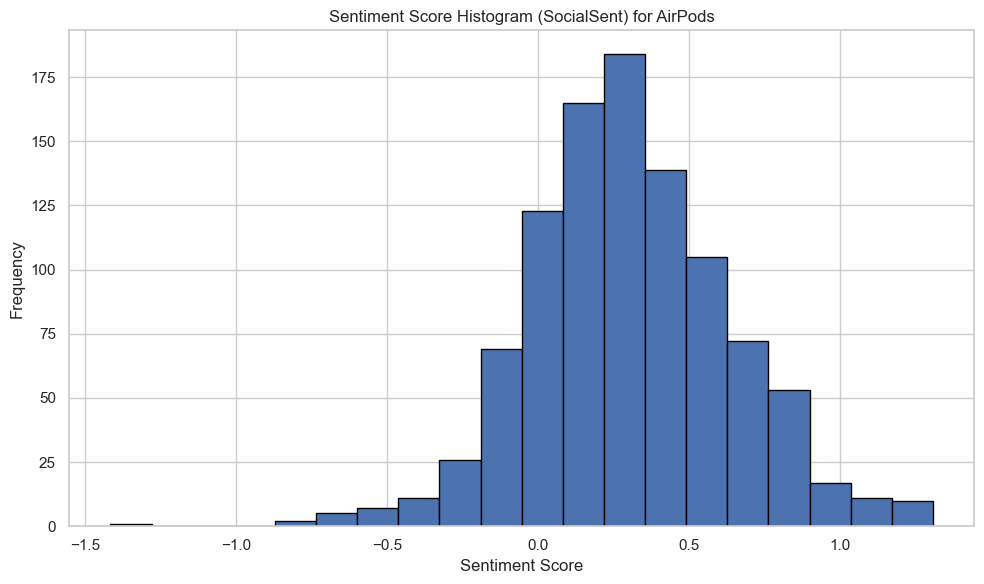

In [274]:
plt.figure(figsize=(10, 6))
plt.hist(df_airpods['SentimentScore_SocialSent'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (SocialSent) for AirPods')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [275]:
sorted_df = df_airpods.sort_values(by='SentimentScore_SocialSent', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 I like my Airpod pro enjoying it, thank you.
---------------------------------------------------------------------------------------------------
1 Great product , comfortable and easy to use.
---------------------------------------------------------------------------------------------------
2 The AirPods are amazing and I do recommend them 👍🏼😁🙏🏽
---------------------------------------------------------------------------------------------------
3 Perfectly fine in excellent condition happy with it
---------------------------------------------------------------------------------------------------
4 great headphones so easy to set up would recommend.
---------------------------------------------------------------------------------------------------
5 They fit ear well. Sound is amazing easy to transport.
---------------------------------------------------------------------------------------------------
6 Excellent product stylise easy to set up and some great features 👍🏽
---------------

In [276]:
sorted_df = df_airpods.sort_values(by='SentimentScore_SocialSent', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 The AirPods don’t connect and it only beeps. Feel cheap
---------------------------------------------------------------------------------------------------
1 Fantastic EarPods and the sound is excellent from them.
---------------------------------------------------------------------------------------------------
2 My granddaughter loved them. Has made a big change in isolation
---------------------------------------------------------------------------------------------------
3 I love these Airpods. Good sound and charge quickly and conveniently.
---------------------------------------------------------------------------------------------------
4 Waited for two weeks to have it but came it as defective. Case cannot be charged, highly disappointed.
---------------------------------------------------------------------------------------------------
5 One was fault and never worked and the other lasted about 20 minutes before the battery dying.
--------------------------------------------

In [277]:
# Categorize the sentiment based on the sentiment score
df_airpods['SentimentCategory_SocialSent'] = df_airpods['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))
df_airpods


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1346995673.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_airpods['SentimentCategory_SocialSent'] = df_airpods['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.99,1971,Cheap,"[bought, teenage, daughter, may, significantly...",4,0.9835,Positive,Positive,0.071702,Positive
1,AirPods,69.99,pre-owned,I bought these refurbished set of AirPods and ...,bought refurbished set airpods must say blown ...,I bought these refurbished set of AirPods and ...,69.99,1106,Cheap,"[bought, refurbished, set, airpods, must, say,...",2,0.8915,Positive,Positive,0.051519,Positive
2,AirPods,139.99,new,Pros: sound quality is excellent if you can ge...,pro sound quality excellent get good seal ear ...,Pros : sound quality is excellent if you can g...,139.99,846,Expensive,"[pro, sound, quality, excellent, get, good, se...",4,0.9576,Positive,Positive,0.262982,Positive
3,AirPods,139.99,new,"What a clever little set of earphones, without...",clever little set earphone without music noise...,"What a clever little set of earphones , withou...",139.99,782,Expensive,"[clever, little, set, earphone, without, music...",3,0.9100,Positive,Positive,0.053750,Positive
4,AirPods,139.99,new,The Apple AirPod Pro is a fantastic set of wir...,apple airpod pro fantastic set tireless headph...,The Apple AirPod Pro is a fantastic set of tir...,139.99,773,Expensive,"[apple, airpod, pro, fantastic, set, tireless,...",4,0.9257,Positive,Positive,0.405333,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,AirPods,139.99,new,Stopped working after a couple of weeks,stopped working couple week,Stopped working after a couple of weeks,139.99,39,Expensive,"[stopped, working, couple, week]",4,-0.2263,Negative,Neutral,0.030000,Neutral
996,AirPods,69.99,new,The product is as promised. Many thanks,product promised thanks,The product is as promised . Any thanks,69.99,39,Cheap,"[product, promised, thanks]",3,0.6597,Positive,Neutral,0.355000,Positive
997,AirPods,69.99,pre-owned,"Charger stopped eirking, waste my money",larger stopped firing waste money,"Larger stopped firing , waste my money",69.99,39,Cheap,"[larger, stopped, firing, waste, money]",1,-0.7269,Negative,Negative,-0.060000,Negative
998,AirPods,69.99,pre-owned,No faults at all happy with my purchase,fault happy purchase,No faults at all happy with my purchase,69.99,39,Cheap,"[fault, happy, purchase]",1,-0.1531,Negative,Positive,0.240000,Positive


***27.5. Apple Watch***

In [279]:
df_watch["SentimentScore_SocialSent"] = df_watch.apply(sentiment_score, axis=1)
df_watch

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/3320060839.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_watch["SentimentScore_SocialSent"] = df_watch.apply(sentiment_score, axis=1)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent
1000,Apple Watch,16.00,pre-owned,"A computer on your wrist. Apple high quality, ...",computer wrist apple high quality reliable one...,A computer on your wrist . Apple high quality ...,16.0000,1366,Cheap,"[computer, wrist, apple, high, quality, reliab...",3,0.9765,Positive,Positive,0.155755
1001,Apple Watch,419.95,pre-owned,I lived with an iwatch 2 for a bit even though...,lived watch size bit even though thought used ...,I lived with an watch [ SIZE ] for a bit even ...,331.7605,1094,Expensive,"[lived, watch, size, bit, even, though, though...",0,0.9695,Positive,Positive,0.245714
1002,Apple Watch,10.00,pre-owned,After purchasing a new s7 I felt my s3 was loo...,purchasing new felt looking little worse wear ...,After purchasing a new s I felt my s was looki...,10.0000,821,Cheap,"[purchasing, new, felt, looking, little, worse...",3,0.9912,Positive,Positive,0.249844
1003,Apple Watch,120.00,pre-owned,I really wanted to have a larger screen and I ...,really wanted larger screen got want pay full ...,I really wanted to have a larger screen and I ...,120.0000,686,Cheap,"[really, wanted, larger, screen, got, want, pa...",1,0.9539,Positive,Positive,0.139455
1004,Apple Watch,219.99,pre-owned,This watch is absolutely awesome! I could go o...,watch absolutely awesome could go forever talk...,This watch is absolutely awesome ! I could go ...,173.7921,672,Expensive,"[watch, absolutely, awesome, could, go, foreve...",3,0.9773,Positive,Positive,0.244074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Apple Watch,150.00,pre-owned,great as all Apple products!,great apple product,great as all Apple products !,150.0000,28,Cheap,"[great, apple, product]",4,0.6588,Positive,Neutral,0.733333
1996,Apple Watch,219.99,new,Brand new! I’m happy as hell,grand new happy hell,Grand new ! I am happy as hell,173.7921,28,Expensive,"[grand, new, happy, hell]",2,0.3382,Positive,Positive,-0.083333
1997,Apple Watch,219.99,new,All Apple products are good.,apple product good,All Apple products are good .,173.7921,28,Expensive,"[apple, product, good]",4,0.4404,Positive,Negative,0.360000
1998,Apple Watch,139.00,pre-owned,Good quality very nice watch,good quality nice watch,Good quality very nice watch,139.0000,28,Cheap,"[good, quality, nice, watch]",0,0.7178,Positive,Positive,0.805000


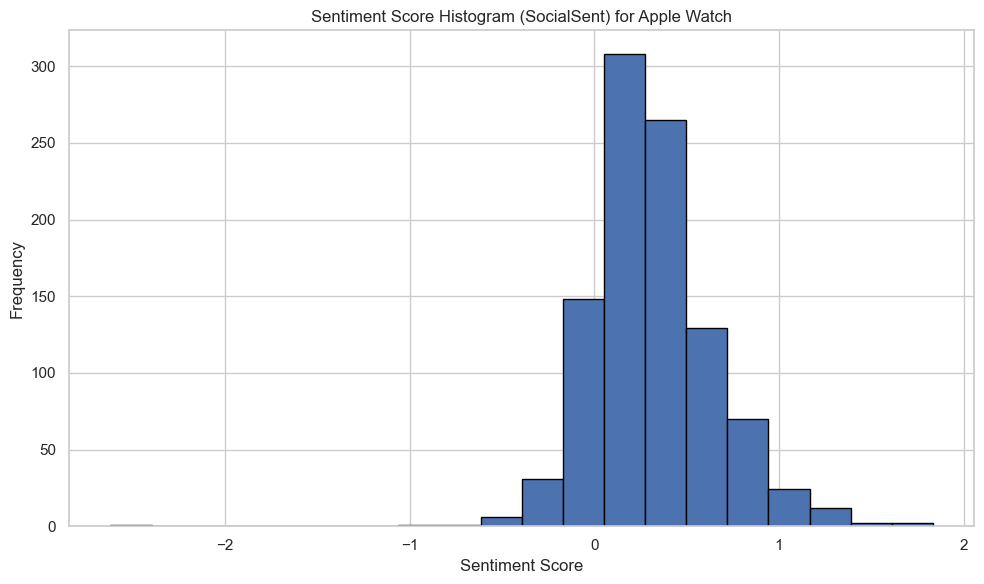

In [280]:
plt.figure(figsize=(10, 6))
plt.hist(df_watch['SentimentScore_SocialSent'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (SocialSent) for Apple Watch')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [281]:
sorted_df = df_watch.sort_values(by='SentimentScore_SocialSent', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Super slim and fits the imac aesthetic perfectly.
---------------------------------------------------------------------------------------------------
1 Just like new and works perfectly.
---------------------------------------------------------------------------------------------------
2 Was a gift  for a friend  and she love it
---------------------------------------------------------------------------------------------------
3 Great price and works perfectly!
---------------------------------------------------------------------------------------------------
4 excellent and functional ... thanks
---------------------------------------------------------------------------------------------------
5 It works great
It’s handy
Great features
---------------------------------------------------------------------------------------------------
6 Excellent watch, which interacts with my iPhone SE perfectly.
---------------------------------------------------------------------------------------

In [282]:
sorted_df = df_watch.sort_values(by='SentimentScore_SocialSent', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Was as advertised. Can’t fault.
---------------------------------------------------------------------------------------------------
1 A+ I recommend you all to deal with him
---------------------------------------------------------------------------------------------------
2 I love it, came in excellent conditions for a refurbished.
---------------------------------------------------------------------------------------------------
3 In good condition- many thanx
---------------------------------------------------------------------------------------------------
4 Wished I purchased one before now
---------------------------------------------------------------------------------------------------
5 My grandson loves the watch
It is perfect
---------------------------------------------------------------------------------------------------
6 Very good and very little damage to the box!
---------------------------------------------------------------------------------------------------
7 Wa

In [283]:
# Categorize the sentiment based on the sentiment score
df_watch['SentimentCategory_SocialSent'] = df_watch['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))
df_watch


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/4099690096.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_watch['SentimentCategory_SocialSent'] = df_watch['SentimentScore_SocialSent'].apply(lambda score: 'Positive' if score >= 0.05 else ('Negative' if score <= -0.05 else 'Neutral'))


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent
1000,Apple Watch,16.00,pre-owned,"A computer on your wrist. Apple high quality, ...",computer wrist apple high quality reliable one...,A computer on your wrist . Apple high quality ...,16.0000,1366,Cheap,"[computer, wrist, apple, high, quality, reliab...",3,0.9765,Positive,Positive,0.155755,Positive
1001,Apple Watch,419.95,pre-owned,I lived with an iwatch 2 for a bit even though...,lived watch size bit even though thought used ...,I lived with an watch [ SIZE ] for a bit even ...,331.7605,1094,Expensive,"[lived, watch, size, bit, even, though, though...",0,0.9695,Positive,Positive,0.245714,Positive
1002,Apple Watch,10.00,pre-owned,After purchasing a new s7 I felt my s3 was loo...,purchasing new felt looking little worse wear ...,After purchasing a new s I felt my s was looki...,10.0000,821,Cheap,"[purchasing, new, felt, looking, little, worse...",3,0.9912,Positive,Positive,0.249844,Positive
1003,Apple Watch,120.00,pre-owned,I really wanted to have a larger screen and I ...,really wanted larger screen got want pay full ...,I really wanted to have a larger screen and I ...,120.0000,686,Cheap,"[really, wanted, larger, screen, got, want, pa...",1,0.9539,Positive,Positive,0.139455,Positive
1004,Apple Watch,219.99,pre-owned,This watch is absolutely awesome! I could go o...,watch absolutely awesome could go forever talk...,This watch is absolutely awesome ! I could go ...,173.7921,672,Expensive,"[watch, absolutely, awesome, could, go, foreve...",3,0.9773,Positive,Positive,0.244074,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Apple Watch,150.00,pre-owned,great as all Apple products!,great apple product,great as all Apple products !,150.0000,28,Cheap,"[great, apple, product]",4,0.6588,Positive,Neutral,0.733333,Positive
1996,Apple Watch,219.99,new,Brand new! I’m happy as hell,grand new happy hell,Grand new ! I am happy as hell,173.7921,28,Expensive,"[grand, new, happy, hell]",2,0.3382,Positive,Positive,-0.083333,Negative
1997,Apple Watch,219.99,new,All Apple products are good.,apple product good,All Apple products are good .,173.7921,28,Expensive,"[apple, product, good]",4,0.4404,Positive,Negative,0.360000,Positive
1998,Apple Watch,139.00,pre-owned,Good quality very nice watch,good quality nice watch,Good quality very nice watch,139.0000,28,Cheap,"[good, quality, nice, watch]",0,0.7178,Positive,Positive,0.805000,Positive


**28. Sentiment analysis with TextBlob**

***28.1. iPhone***

In [339]:
#Conduct a sentiment analysis with TextBlob
def analyze_sentiment(comment):
    analysis = TextBlob(comment)
    return analysis.sentiment.polarity

df_iphone['SentimentScore_TextBlob'] = df_iphone['Sentiment_Comment'].apply(analyze_sentiment)

def categorize_sentiment(polarity):
    if polarity > 0:
        return 'Positive'
    elif polarity == 0:
        return 'Neutral'
    else:
        return 'Negative'

df_iphone['SentimentCategory_TextBlob'] = df_iphone['SentimentScore_TextBlob'].apply(categorize_sentiment)
df_iphone

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1198180241.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone['SentimentScore_TextBlob'] = df_iphone['Sentiment_Comment'].apply(analyze_sentiment)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1198180241.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone['SentimentCategory_TextBlob'] = df_iphone['SentimentScore_TextBlob'].apply(categorize_sentiment)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion,SentimentScore_TextBlob,SentimentCategory_TextBlob
2000,Iphone,183.00,pre-owned,I've owned and used an iPhone 6S (standard siz...,owned used iphone standard size since came alm...,I have owned and used an iPhone Of ( standard ...,183.00,1921,Expensive,"[owned, used, iphone, standard, size, since, c...",4,0.9936,Positive,Positive,0.107226,Positive,owned used iphone standard size since came alm...,anticipation,0.179996,Positive
2001,Iphone,159.99,new,The 2016 iPhone SE is one of the best products...,size iphone one best product apple ever made c...,The [ SIZE ] iPhone of is one of the best prod...,159.99,1534,Expensive,"[size, iphone, one, best, product, apple, ever...",4,0.9935,Positive,Positive,0.083393,Positive,size iphone one best products apple ever made ...,anticipation joy,0.238720,Positive
2002,Iphone,5.00,pre-owned,This is my first smartphone and because I am a...,first smartphone skinflint old unlocked model ...,This is my first smartphone and because I am a...,5.00,1478,Cheap,"[first, smartphone, skinflint, old, unlocked, ...",4,0.9452,Positive,Positive,0.029910,Neutral,first smartphone skinflint old unlocked model ...,fear,0.098557,Positive
2003,Iphone,339.99,pre-owned,My wife likes to hang onto things and is not o...,wife like hang onto thing one unnecessary chan...,My wife likes to hang onto things and is not o...,339.99,1417,Expensive,"[wife, like, hang, onto, thing, one, unnecessa...",3,0.9720,Positive,Positive,0.077732,Positive,wife likes hang onto things one unnecessary ch...,anticipation,0.140985,Positive
2004,Iphone,159.99,pre-owned,For the age of the phone It Is Quick and very ...,age phone quick unfordable able run latest sof...,For the age of the phone It Is Quick and very ...,159.99,1366,Expensive,"[age, phone, quick, unfordable, able, run, lat...",4,0.4245,Positive,Positive,0.005800,Neutral,age phone quick unfordable able run latest sof...,trust,0.138968,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,Iphone,580.00,new,Upgraded to the bigger iPhone from the iPhone ...,degraded bigger iphone iphone size pro believe...,Degraded to the bigger iPhone from the iPhone ...,580.00,213,Expensive,"[degraded, bigger, iphone, iphone, size, pro, ...",4,0.8169,Positive,Positive,0.116875,Positive,degraded bigger iphone iphone size pro cannot ...,anger anticipation disgust fear joy sadness su...,0.395833,Positive
2996,Iphone,5.00,pre-owned,I have bought 3 second iPhones one I sent back...,bought size second iphones one sent back terri...,I have bought [ SIZE ] second iPhones one I se...,5.00,213,Cheap,"[bought, size, second, iphones, one, sent, bac...",4,-0.2263,Negative,Negative,-0.128667,Negative,bought size second iphones one sent back terri...,anger anticipation disgust fear joy sadness su...,-0.125000,Negative
2997,Iphone,85.00,pre-owned,Battery is draining very fast from 100% to 1% ...,battery draining fast size size max size hour ...,Battery is draining very fast from [ SIZE ] % ...,85.00,213,Expensive,"[battery, draining, fast, size, size, max, siz...",4,0.5267,Positive,Negative,0.113000,Positive,battery draining fast size size max size hours...,anticipation joy surprise trust,0.025333,Positive
2998,Iphone,379.99,others,Near perfect condition. 5G. Much cheaper than ...,dear perfect condition cheaper latest inclinat...,Dear perfect condition . Of . Such cheaper tha...,379.99,213,Expensive,"[dear, perfect, condition, cheaper, latest, in...",4,-0.2439,Negative,Positive,0.227692,Positive,dear perfect condition cheaper latest inclinat...,anticipation,0.307143,Positive


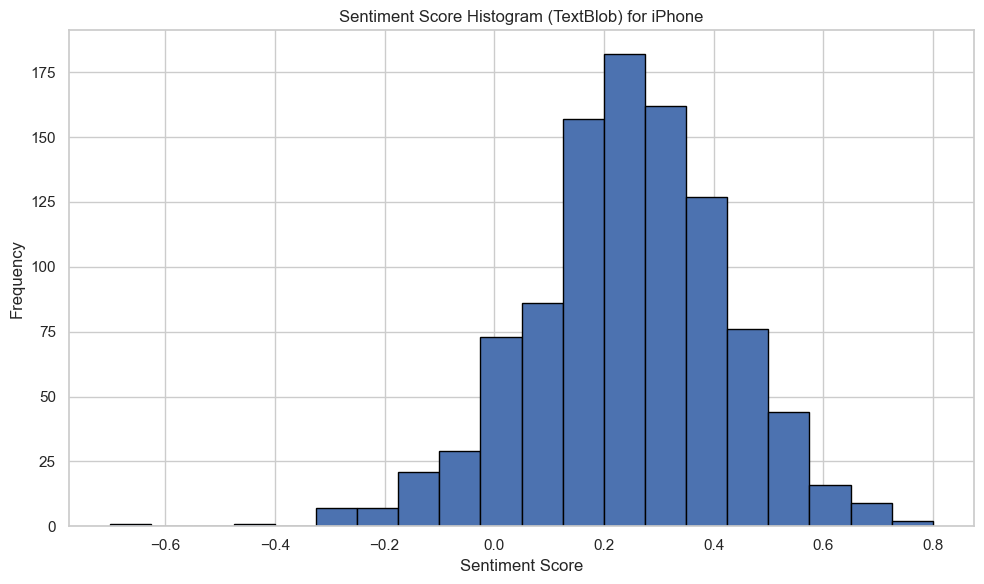

In [340]:
#Plot the sentiment scores of the comments with TextBlob
plt.figure(figsize=(10, 6))
plt.hist(df_iphone['SentimentScore_TextBlob'], bins=20, edgecolor='black')
plt.title('Sentiment Score Histogram (TextBlob) for iPhone')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [341]:
sorted_df = df_iphone.sort_values(by='SentimentScore_TextBlob', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Having used Samsung phones for some years now, it took me a couple of days to familiarise myself with this phone. Best phone I,ve had yet. Looking forward to trying out the camera on my forthcoming holiday soon. All in all its a great phone at a great price.
---------------------------------------------------------------------------------------------------
1 Delighted with the qulaity of the iphone 4 supplied. Its in excellent condition. Nice touch supplying the screen saver and phone wallet. And 12 months warranty gives you reassurance when buying a used phone, Cannot ask for more.
---------------------------------------------------------------------------------------------------
2 Went from the 4s to the Oneplus x to the IPhone 5c because I prefer the layout / Apps for IOS ... the is the perfect phone for me -an excellent camera is the main thing I wanted but I didn't want to spend a fortune (finger print ID doesn't always work but maybe that's just me?)
---------------------------

In [342]:
sorted_df = df_iphone.sort_values(by='SentimentScore_TextBlob', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 eBay you should start vetting ass holes like this. They are giving eBay a bad name. Joke is what she is trying to claim it’s just unwanted items from home. Why has she sold nothing but iPhones. Another lie from from queen twat.
---------------------------------------------------------------------------------------------------
1 He send me a phone ,  front camera dont work , phone si locked , he lie , he said he have a lot of phone and he didnt know if they work ( he said that when i ask him why he dont write about deffects ) , he is not serious and he dont know what he sell , dont trust him , dont buy from him , i am verry dissapointed !!!
---------------------------------------------------------------------------------------------------
2 When this product came the phone was fine, the actual phone is good. But the accessories in the other hand are terrible. They had given me FAKE headphones with it which are actually terrible quality and also a FAKE cable which Doesnt even work! A b

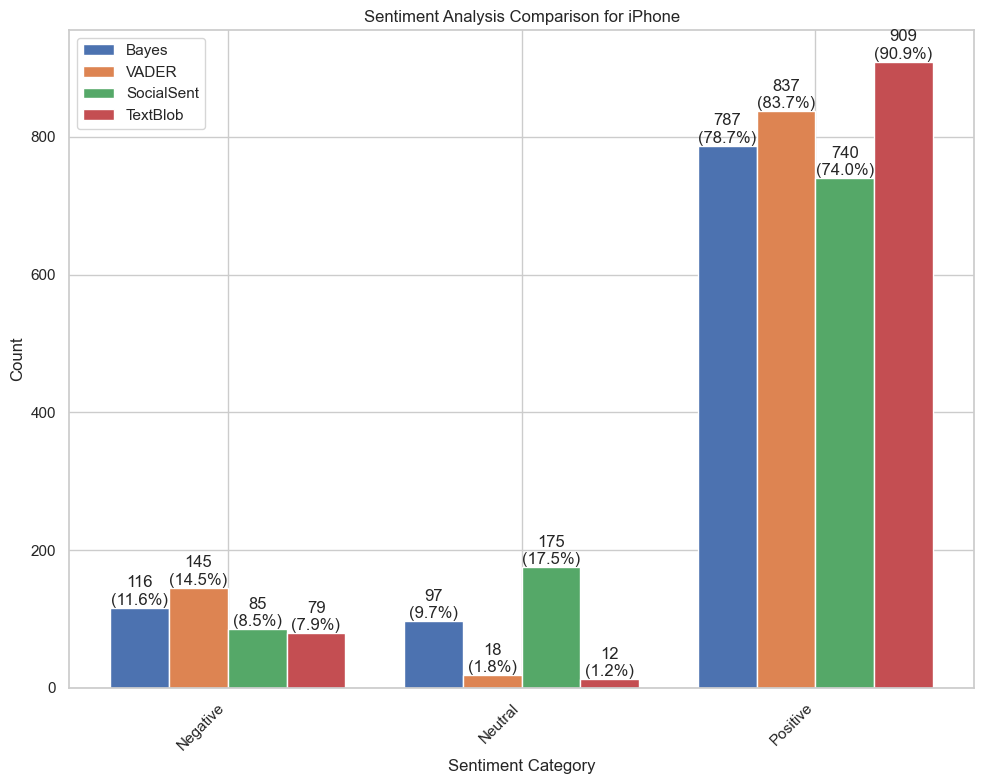

In [343]:
#Compare and contrast the sentiment results between models
vader_counts = df_iphone['SentimentCategory_VADER'].value_counts()
social_sent_counts = df_iphone['SentimentCategory_SocialSent'].value_counts()
bayes_counts = df_iphone['SentimentCategory_Bayes'].value_counts()
textblob_counts = df_iphone['SentimentCategory_TextBlob'].value_counts()

total_bayes = bayes_counts.sum()
total_vader = vader_counts.sum()
total_social_sent = social_sent_counts.sum()
total_textblob = textblob_counts.sum()

sentiment_categories = sorted(set(bayes_counts.index) | set(vader_counts.index) | set(social_sent_counts.index) | set(textblob_counts.index))

fig, ax = plt.subplots(figsize=(10, 8))

bar_width = 0.20

x_bayes = range(len(sentiment_categories))
x_vader = [pos + bar_width for pos in x_bayes]
x_social_sent = [pos + bar_width * 2 for pos in x_bayes]
x_textblob = [pos + bar_width * 3 for pos in x_bayes]

ax.bar(x_bayes, [bayes_counts.get(category, 0) for category in sentiment_categories], bar_width, label='Bayes')
ax.bar(x_vader, [vader_counts.get(category, 0) for category in sentiment_categories], bar_width, label='VADER')
ax.bar(x_social_sent, [social_sent_counts.get(category, 0) for category in sentiment_categories], bar_width, label='SocialSent')
ax.bar(x_textblob, [textblob_counts.get(category, 0) for category in sentiment_categories], bar_width, label='TextBlob')


ax.set_xticks([pos + bar_width for pos in x_bayes])
center_positions = [(vader + social_sent) / 2 for vader, social_sent in zip(x_vader, x_social_sent)]
ax.set_xticks(center_positions)
ax.set_xticklabels(sentiment_categories, rotation=45, ha='right')
ax.set_xlabel('Sentiment Category')
ax.set_ylabel('Count')
ax.set_title('Sentiment Analysis Comparison for iPhone')
ax.legend()

def calculate_percentage(count, total):
    return (count / total) * 100 if total > 0 else 0

for i in range(len(sentiment_categories)):
    bayes_count = bayes_counts.get(sentiment_categories[i], 0)
    vader_count = vader_counts.get(sentiment_categories[i], 0)
    social_sent_count = social_sent_counts.get(sentiment_categories[i], 0)
    textblob_count = textblob_counts.get(sentiment_categories[i], 0)

    ax.text(x_bayes[i], bayes_count, f'{bayes_count}\n({calculate_percentage(bayes_count, total_bayes):.1f}%)', ha='center', va='bottom')
    ax.text(x_vader[i], vader_count, f'{vader_count}\n({calculate_percentage(vader_count, total_vader):.1f}%)', ha='center', va='bottom')
    ax.text(x_social_sent[i], social_sent_count, f'{social_sent_count}\n({calculate_percentage(social_sent_count, total_social_sent):.1f}%)', ha='center', va='bottom')
    ax.text(x_textblob[i], textblob_count, f'{textblob_count}\n({calculate_percentage(textblob_count, total_textblob):.1f}%)', ha='center', va='bottom')
    
plt.tight_layout()
plt.show()


***28.2. Macbook***

In [345]:
# Apply sentiment analysis to calculate polarity
df_mac['SentimentScore_TextBlob'] = df_mac['Sentiment_Comment'].apply(analyze_sentiment)


df_mac['SentimentCategory_TextBlob'] = df_mac['SentimentScore_TextBlob'].apply(categorize_sentiment)
df_mac


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/4102494828.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac['SentimentScore_TextBlob'] = df_mac['Sentiment_Comment'].apply(analyze_sentiment)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/4102494828.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac['SentimentCategory_TextBlob'] = df_mac['SentimentScore_TextBlob'].apply(categorize_sentiment)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion,SentimentScore_TextBlob,SentimentCategory_TextBlob
3000,Macbook,0.00,others,"The 2019 MacBook Pro 16"" that I received was e...",size macbook pro size received exactly describ...,"The [ SIZE ] MacBook Pro [ SIZE ] "" that I rec...",0.00,3078,Cheap,"[size, macbook, pro, size, received, exactly, ...",2,0.9945,Positive,Positive,0.110290,Positive,size macbook pro size received exactly describ...,anticipation,0.243752,Positive
3001,Macbook,550.00,new,"Best value for money, not just from apple, but...",west value money apple compared existing lapto...,"West value for money , not just from apple , b...",434.50,1415,Expensive,"[west, value, money, apple, compared, existing...",0,0.9917,Positive,Positive,0.156446,Positive,west value money apple compared existing lapto...,trust,0.217210,Positive
3002,Macbook,0.00,pre-owned,"I have dived into the Mac walled garden, which...",dived sac walled garden avoided year good bad ...,"I have dived into the Sac walled garden , whic...",0.00,1181,Cheap,"[dived, sac, walled, garden, avoided, year, go...",0,0.9932,Positive,Positive,0.324051,Positive,dived sac walled garden avoided years good bad...,anticipation,0.102911,Positive
3003,Macbook,750.00,pre-owned,This laptop does exactly what it needs to do. ...,laptop exactly need apple processor delivers h...,This laptop does exactly what it needs to do ....,592.50,1121,Expensive,"[laptop, exactly, need, apple, processor, deli...",2,0.9907,Positive,Positive,0.029487,Neutral,laptop exactly needs apple processor delivers ...,anticipation joy,0.159804,Positive
3004,Macbook,179.00,refurbished,Very happy with my purchase. The Macbook Air 1...,happy purchase macbook air size arrived time c...,Very happy with my purchase . The Macbook Air ...,141.41,1084,Cheap,"[happy, purchase, macbook, air, size, arrived,...",4,0.9586,Positive,Positive,0.037500,Neutral,happy purchase macbook air size arrived time c...,sadness trust,0.239500,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,Macbook,850.00,new,Apple the best of the best,apple best best,Apple the best of the best,671.50,26,Expensive,"[apple, best, best]",0,0.8555,Positive,Positive,1.150000,Positive,apple best best,anger anticipation disgust fear joy sadness su...,1.000000,Positive
3996,Macbook,900.00,pre-owned,great color and protection,great color protection,great color and protection,711.00,26,Expensive,"[great, color, protection]",1,0.6249,Positive,Positive,0.453333,Positive,great color protection,anger anticipation disgust fear joy sadness su...,0.800000,Positive
3997,Macbook,159.99,pre-owned,Good quality for the price,good quality price,Good quality for the price,159.99,26,Cheap,"[good, quality, price]",1,0.4404,Positive,Neutral,0.915000,Positive,good quality price,anticipation joy surprise trust,0.700000,Positive
3998,Macbook,550.00,new,Brand new and came quickly,grand new came quickly,Grand new and came quickly,434.50,26,Expensive,"[grand, new, came, quickly]",4,0.4588,Positive,Positive,-0.070000,Negative,grand new came quickly,anger anticipation disgust fear joy sadness su...,0.323232,Positive


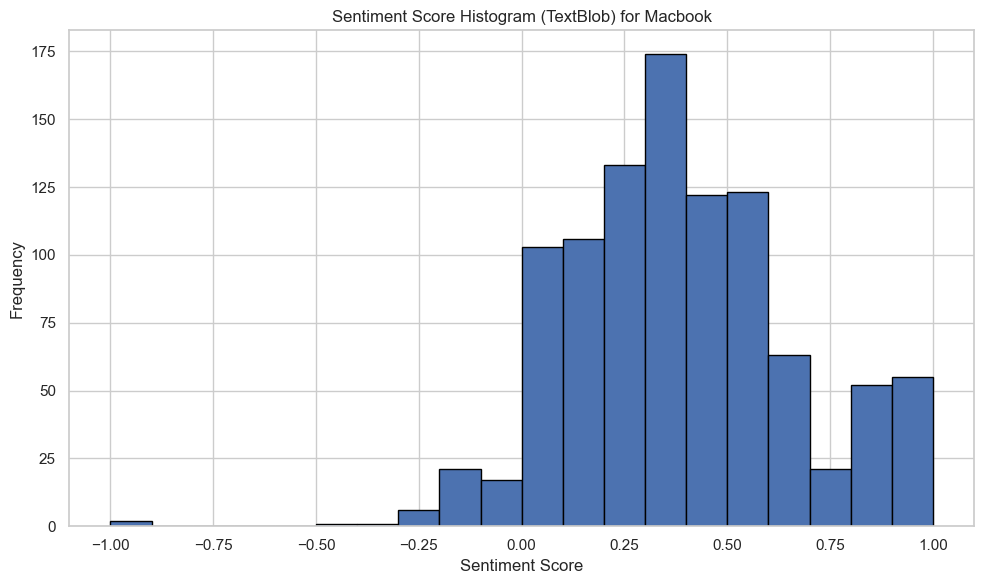

In [346]:
plt.figure(figsize=(10, 6))
plt.hist(df_mac['SentimentScore_TextBlob'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (TextBlob) for Macbook')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [347]:
sorted_df = df_mac.sort_values(by='SentimentScore_TextBlob', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Very happy with my laptop
---------------------------------------------------------------------------------------------------
1 Excellent Apple MacBook Pro 13", as described thank you!
---------------------------------------------------------------------------------------------------
2 EXCELLENT LAPTOP FOR GRAD SCHOOL!
---------------------------------------------------------------------------------------------------
3 Product was in perfect conditon.
---------------------------------------------------------------------------------------------------
4 It’s an excellent product. The cream of the crop of apple products, which is saying a lot.
---------------------------------------------------------------------------------------------------
5 A+.  I've been a Mac addict since 1991 and this machine/laptop is the best one I've owned.
---------------------------------------------------------------------------------------------------
6 The Laptop was in excellent condition and works perfec

In [348]:
sorted_df = df_mac.sort_values(by='SentimentScore_TextBlob', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Terrible terrible terrible.
---------------------------------------------------------------------------------------------------
1 Was very disappointed in this purchase.
---------------------------------------------------------------------------------------------------
2 Many people like to talk down on why the MacBook Pro is a horrible product due to the butterfly keys and having to buy a dongle for you to connect usb, memory, etc. But in reality it’s very slick and lightweight. I definitely recommend it!
---------------------------------------------------------------------------------------------------
3 The laptop had damage on the corner which was not included on the description of the product. It looks like it was forced into place. If I had the time I would return it, but I don’t.
---------------------------------------------------------------------------------------------------
4 Came with a bad battery with 950 cycles in addition to several dents
-----------------------------

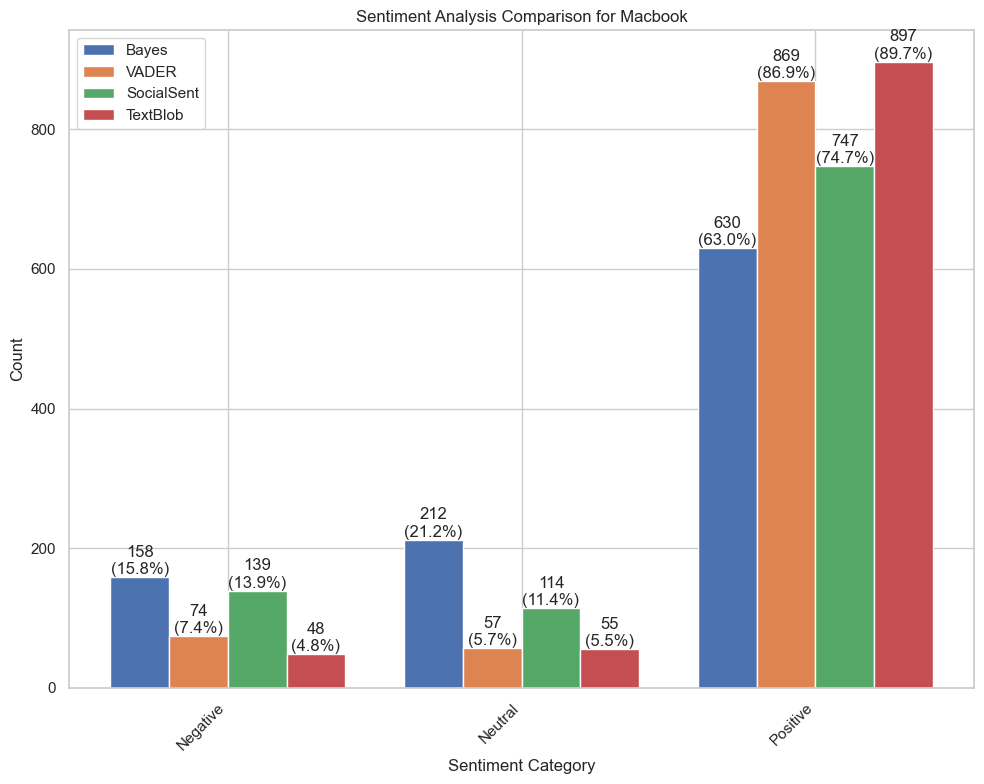

In [349]:
vader_counts = df_mac['SentimentCategory_VADER'].value_counts()
social_sent_counts = df_mac['SentimentCategory_SocialSent'].value_counts()
bayes_counts = df_mac['SentimentCategory_Bayes'].value_counts()
textblob_counts = df_mac['SentimentCategory_TextBlob'].value_counts()

# Calculate total counts for each analysis method
total_bayes = bayes_counts.sum()
total_vader = vader_counts.sum()
total_social_sent = social_sent_counts.sum()
total_textblob = textblob_counts.sum()

# Combine and sort the sentiment categories from all three columns
sentiment_categories = sorted(set(bayes_counts.index) | set(vader_counts.index) | set(social_sent_counts.index) | set(textblob_counts.index))

fig, ax = plt.subplots(figsize=(10, 8))

bar_width = 0.20

x_bayes = range(len(sentiment_categories))
x_vader = [pos + bar_width for pos in x_bayes]
x_social_sent = [pos + bar_width * 2 for pos in x_bayes]
x_textblob = [pos + bar_width * 3 for pos in x_bayes]

ax.bar(x_bayes, [bayes_counts.get(category, 0) for category in sentiment_categories], bar_width, label='Bayes')
ax.bar(x_vader, [vader_counts.get(category, 0) for category in sentiment_categories], bar_width, label='VADER')
ax.bar(x_social_sent, [social_sent_counts.get(category, 0) for category in sentiment_categories], bar_width, label='SocialSent')
ax.bar(x_textblob, [textblob_counts.get(category, 0) for category in sentiment_categories], bar_width, label='TextBlob')


ax.set_xticks([pos + bar_width for pos in x_bayes])
center_positions = [(vader + social_sent) / 2 for vader, social_sent in zip(x_vader, x_social_sent)]
ax.set_xticks(center_positions)
ax.set_xticklabels(sentiment_categories, rotation=45, ha='right')
ax.set_xlabel('Sentiment Category')
ax.set_ylabel('Count')
ax.set_title('Sentiment Analysis Comparison for Macbook')
ax.legend()

# New code for annotations
def calculate_percentage(count, total):
    return (count / total) * 100 if total > 0 else 0

for i in range(len(sentiment_categories)):
    bayes_count = bayes_counts.get(sentiment_categories[i], 0)
    vader_count = vader_counts.get(sentiment_categories[i], 0)
    social_sent_count = social_sent_counts.get(sentiment_categories[i], 0)
    textblob_count = textblob_counts.get(sentiment_categories[i], 0)

    ax.text(x_bayes[i], bayes_count, f'{bayes_count}\n({calculate_percentage(bayes_count, total_bayes):.1f}%)', ha='center', va='bottom')
    ax.text(x_vader[i], vader_count, f'{vader_count}\n({calculate_percentage(vader_count, total_vader):.1f}%)', ha='center', va='bottom')
    ax.text(x_social_sent[i], social_sent_count, f'{social_sent_count}\n({calculate_percentage(social_sent_count, total_social_sent):.1f}%)', ha='center', va='bottom')
    ax.text(x_textblob[i], textblob_count, f'{textblob_count}\n({calculate_percentage(textblob_count, total_textblob):.1f}%)', ha='center', va='bottom')
    
plt.tight_layout()
plt.show()


***28.3. iPad***

In [350]:
# Apply sentiment analysis to calculate polarity
df_ipad['SentimentScore_TextBlob'] = df_ipad['Sentiment_Comment'].apply(analyze_sentiment)

df_ipad['SentimentCategory_TextBlob'] = df_ipad['SentimentScore_TextBlob'].apply(categorize_sentiment)
df_ipad


/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/4060305146.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad['SentimentScore_TextBlob'] = df_ipad['Sentiment_Comment'].apply(analyze_sentiment)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/4060305146.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad['SentimentCategory_TextBlob'] = df_ipad['SentimentScore_TextBlob'].apply(categorize_sentiment)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion,SentimentScore_TextBlob,SentimentCategory_TextBlob
4000,iPad,410.00,pre-owned,Good product but still very pricey! The ipad a...,good product still price ipad air better chip ...,Good product but still very prices ! The ipad ...,410.0000,1284,Expensive,"[good, product, still, price, ipad, air, bette...",3,0.5308,Positive,Positive,0.048571,Neutral,good product still prices ipad air better chip...,anticipation trust,0.057891,Positive
4001,iPad,21.00,pre-owned,"My iPad 2 was getting slow thanks, probably, t...",ipad size getting slow thanks probably later a...,"My iPad [ SIZE ] was getting slow thanks , pro...",21.0000,1163,Cheap,"[ipad, size, getting, slow, thanks, probably, ...",1,0.9887,Positive,Positive,0.098298,Positive,ipad size getting slow thanks probably later a...,trust,0.254529,Positive
4002,iPad,5.00,pre-owned,My only criticism is that the charging lead in...,criticism charging lead picture suggests newer...,My only criticism is that the charging lead in...,5.0000,1011,Cheap,"[criticism, charging, lead, picture, suggests,...",3,0.9886,Positive,Positive,0.081000,Positive,criticism charging lead picture suggests newer...,trust,0.319366,Positive
4003,iPad,149.99,pre-owned,So I just opened the box and unwrapped my new ...,opened box unwrapped new ipad first look ipad ...,So I just opened the box and unwrapped my new ...,118.4921,938,Expensive,"[opened, box, unwrapped, new, ipad, first, loo...",2,0.9791,Positive,Positive,0.205424,Positive,opened box unwrapped new ipad first look ipad ...,anticipation,0.348405,Positive
4004,iPad,21.00,pre-owned,"The IPAD AIR 2 is still an OK IPAD. However, w...",ipad air size still ipad however whilst probab...,The IPAD AIR [ SIZE ] is still an of IPAD . Ho...,21.0000,779,Cheap,"[ipad, air, size, still, ipad, however, whilst...",0,-0.0119,Neutral,Positive,0.221964,Positive,ipad air size still ipad however whilst probab...,sadness,0.116970,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,iPad,5.00,refurbished,Brillant price and great ipad,brilliant price great ipad,Brilliant price and great ipad,5.0000,29,Cheap,"[brilliant, price, great, ipad]",0,0.8360,Positive,Positive,1.316667,Positive,brilliant price great ipad,anticipation joy trust,0.850000,Positive
4996,iPad,5.00,pre-owned,Fast delivery no cons perfect,last delivery son perfect,Last delivery no sons perfect,5.0000,29,Cheap,"[last, delivery, son, perfect]",0,0.3612,Positive,Positive,0.593333,Positive,last delivery sons perfect,anticipation joy trust,0.500000,Positive
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921,29,Expensive,"[excellent, tablet, recommend]",0,0.7351,Positive,Neutral,0.000000,Neutral,excellent tablet recommend,trust,1.000000,Positive
4998,iPad,149.99,pre-owned,Product was very acceptable.,product acceptable,Product was very acceptable .,118.4921,28,Expensive,"[product, acceptable]",0,0.3804,Positive,Negative,0.290000,Positive,product acceptable,anger anticipation disgust fear joy sadness su...,0.200000,Positive


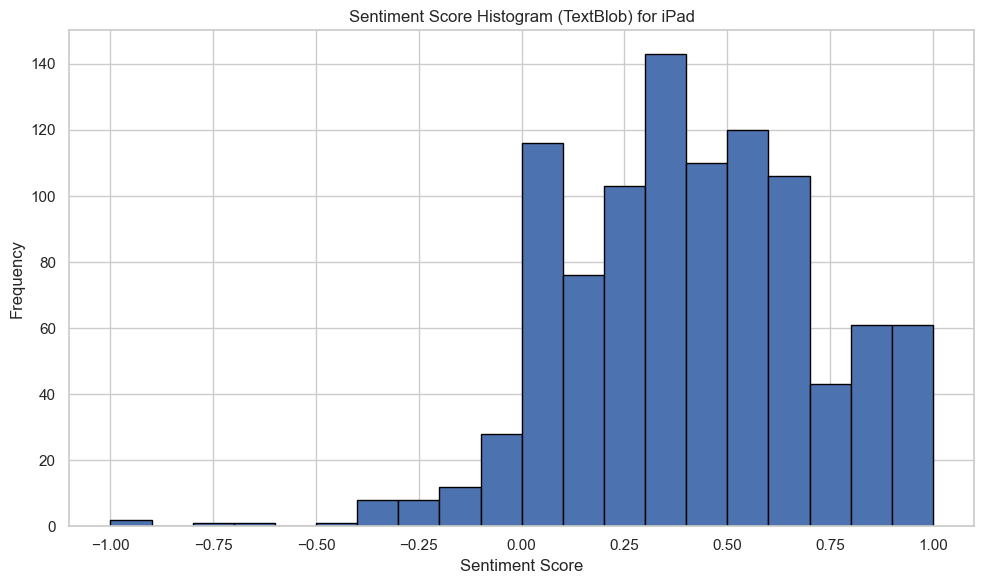

In [351]:
plt.figure(figsize=(10, 6))
plt.hist(df_ipad['SentimentScore_TextBlob'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (TextBlob) for iPad')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [352]:
sorted_df = df_ipad.sort_values(by='SentimentScore_TextBlob', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Because. It came on.time. And The package was excellent
---------------------------------------------------------------------------------------------------
1 Cheap. The best priced iPad with the value and spec
---------------------------------------------------------------------------------------------------
2 The best tablet cheaper on ebay
---------------------------------------------------------------------------------------------------
3 Exceeded expectations in terms of Product Quality . Very happy!
---------------------------------------------------------------------------------------------------
4 Arrived in excellent condition and had no issues with it.
---------------------------------------------------------------------------------------------------
5 Del as stated ... excellent condition 5*
---------------------------------------------------------------------------------------------------
6 One of the best in the market
-----------------------------------------------------

In [353]:
sorted_df = df_ipad.sort_values(by='SentimentScore_TextBlob', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 My account was hacked and someone else tried to buy it on my account! Terrible! Took days for a reply!
---------------------------------------------------------------------------------------------------
1 Very disappointed the was nothing like the photos
---------------------------------------------------------------------------------------------------
2 THE BIGGEST PIECE OF CRAP SOLD ON EBAY
---------------------------------------------------------------------------------------------------
3 As the supplier has supplied an incorrect item I am very disappointed with it and have complained to them
---------------------------------------------------------------------------------------------------
4 This iPad was unable to Google.
---------------------------------------------------------------------------------------------------
5 iPad 2 used once and now the battery will not charge despite several efforts to do so. Very unhappy and waiting for this to be rectified.
--------------------

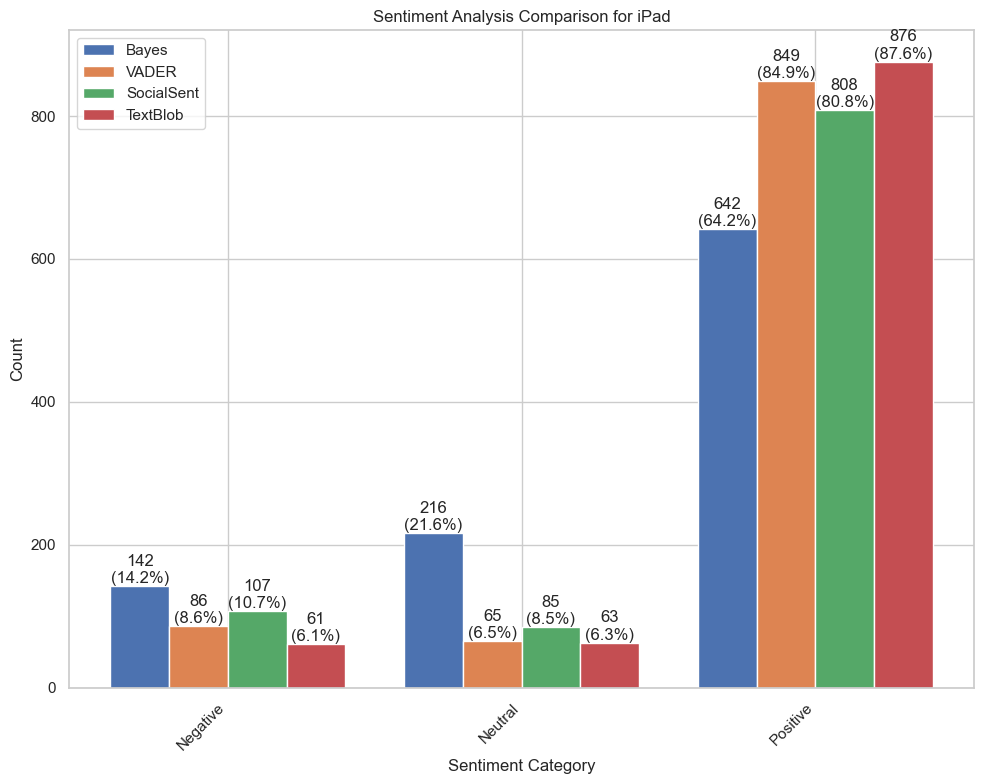

In [354]:
vader_counts = df_ipad['SentimentCategory_VADER'].value_counts()
social_sent_counts = df_ipad['SentimentCategory_SocialSent'].value_counts()
bayes_counts = df_ipad['SentimentCategory_Bayes'].value_counts()
textblob_counts = df_ipad['SentimentCategory_TextBlob'].value_counts()

# Calculate total counts for each analysis method
total_bayes = bayes_counts.sum()
total_vader = vader_counts.sum()
total_social_sent = social_sent_counts.sum()
total_textblob = textblob_counts.sum()

# Combine and sort the sentiment categories from all three columns
sentiment_categories = sorted(set(bayes_counts.index) | set(vader_counts.index) | set(social_sent_counts.index) | set(textblob_counts.index))

fig, ax = plt.subplots(figsize=(10, 8))

bar_width = 0.20

x_bayes = range(len(sentiment_categories))
x_vader = [pos + bar_width for pos in x_bayes]
x_social_sent = [pos + bar_width * 2 for pos in x_bayes]
x_textblob = [pos + bar_width * 3 for pos in x_bayes]

ax.bar(x_bayes, [bayes_counts.get(category, 0) for category in sentiment_categories], bar_width, label='Bayes')
ax.bar(x_vader, [vader_counts.get(category, 0) for category in sentiment_categories], bar_width, label='VADER')
ax.bar(x_social_sent, [social_sent_counts.get(category, 0) for category in sentiment_categories], bar_width, label='SocialSent')
ax.bar(x_textblob, [textblob_counts.get(category, 0) for category in sentiment_categories], bar_width, label='TextBlob')


ax.set_xticks([pos + bar_width for pos in x_bayes])
center_positions = [(vader + social_sent) / 2 for vader, social_sent in zip(x_vader, x_social_sent)]
ax.set_xticks(center_positions)
ax.set_xticklabels(sentiment_categories, rotation=45, ha='right')
ax.set_xlabel('Sentiment Category')
ax.set_ylabel('Count')
ax.set_title('Sentiment Analysis Comparison for iPad')
ax.legend()

# New code for annotations
def calculate_percentage(count, total):
    return (count / total) * 100 if total > 0 else 0

for i in range(len(sentiment_categories)):
    bayes_count = bayes_counts.get(sentiment_categories[i], 0)
    vader_count = vader_counts.get(sentiment_categories[i], 0)
    social_sent_count = social_sent_counts.get(sentiment_categories[i], 0)
    textblob_count = textblob_counts.get(sentiment_categories[i], 0)

    ax.text(x_bayes[i], bayes_count, f'{bayes_count}\n({calculate_percentage(bayes_count, total_bayes):.1f}%)', ha='center', va='bottom')
    ax.text(x_vader[i], vader_count, f'{vader_count}\n({calculate_percentage(vader_count, total_vader):.1f}%)', ha='center', va='bottom')
    ax.text(x_social_sent[i], social_sent_count, f'{social_sent_count}\n({calculate_percentage(social_sent_count, total_social_sent):.1f}%)', ha='center', va='bottom')
    ax.text(x_textblob[i], textblob_count, f'{textblob_count}\n({calculate_percentage(textblob_count, total_textblob):.1f}%)', ha='center', va='bottom')
    
plt.tight_layout()
plt.show()


***28.4. AirPods***

In [355]:
# Apply sentiment analysis to calculate polarity
df_airpods['SentimentScore_TextBlob'] = df_airpods['Sentiment_Comment'].apply(analyze_sentiment)

df_airpods['SentimentCategory_TextBlob'] = df_airpods['SentimentScore_TextBlob'].apply(categorize_sentiment)
df_airpods

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/927618517.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_airpods['SentimentScore_TextBlob'] = df_airpods['Sentiment_Comment'].apply(analyze_sentiment)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/927618517.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_airpods['SentimentCategory_TextBlob'] = df_airpods['SentimentScore_TextBlob'].apply(categorize_sentiment)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion,SentimentScore_TextBlob,SentimentCategory_TextBlob
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.99,1971,Cheap,"[bought, teenage, daughter, may, significantly...",4,0.9835,Positive,Positive,0.071702,Positive,bought teenage daughter may significantly rrp ...,fear trust,0.095428,Positive
1,AirPods,69.99,pre-owned,I bought these refurbished set of AirPods and ...,bought refurbished set airpods must say blown ...,I bought these refurbished set of AirPods and ...,69.99,1106,Cheap,"[bought, refurbished, set, airpods, must, say,...",2,0.8915,Positive,Positive,0.051519,Positive,bought refurbished set airpods must say blown ...,trust,0.277752,Positive
2,AirPods,139.99,new,Pros: sound quality is excellent if you can ge...,pro sound quality excellent get good seal ear ...,Pros : sound quality is excellent if you can g...,139.99,846,Expensive,"[pro, sound, quality, excellent, get, good, se...",4,0.9576,Positive,Positive,0.262982,Positive,pros sound quality excellent get good seal ear...,trust,0.343627,Positive
3,AirPods,139.99,new,"What a clever little set of earphones, without...",clever little set earphone without music noise...,"What a clever little set of earphones , withou...",139.99,782,Expensive,"[clever, little, set, earphone, without, music...",3,0.9100,Positive,Positive,0.053750,Positive,clever little set earphones without music nois...,sadness,0.189583,Positive
4,AirPods,139.99,new,The Apple AirPod Pro is a fantastic set of wir...,apple airpod pro fantastic set tireless headph...,The Apple AirPod Pro is a fantastic set of tir...,139.99,773,Expensive,"[apple, airpod, pro, fantastic, set, tireless,...",4,0.9257,Positive,Positive,0.405333,Positive,apple airpod pro fantastic set tireless headph...,trust,0.191111,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,AirPods,139.99,new,Stopped working after a couple of weeks,stopped working couple week,Stopped working after a couple of weeks,139.99,39,Expensive,"[stopped, working, couple, week]",4,-0.2263,Negative,Neutral,0.030000,Neutral,stopped working couple weeks,anger anticipation disgust fear joy sadness su...,0.000000,Neutral
996,AirPods,69.99,new,The product is as promised. Many thanks,product promised thanks,The product is as promised . Any thanks,69.99,39,Cheap,"[product, promised, thanks]",3,0.6597,Positive,Neutral,0.355000,Positive,product promised thanks,anger anticipation disgust fear joy sadness su...,0.200000,Positive
997,AirPods,69.99,pre-owned,"Charger stopped eirking, waste my money",larger stopped firing waste money,"Larger stopped firing , waste my money",69.99,39,Cheap,"[larger, stopped, firing, waste, money]",1,-0.7269,Negative,Negative,-0.060000,Negative,larger stopped firing waste money,surprise trust,-0.100000,Negative
998,AirPods,69.99,pre-owned,No faults at all happy with my purchase,fault happy purchase,No faults at all happy with my purchase,69.99,39,Cheap,"[fault, happy, purchase]",1,-0.1531,Negative,Positive,0.240000,Positive,faults happy purchase,sadness,0.800000,Positive


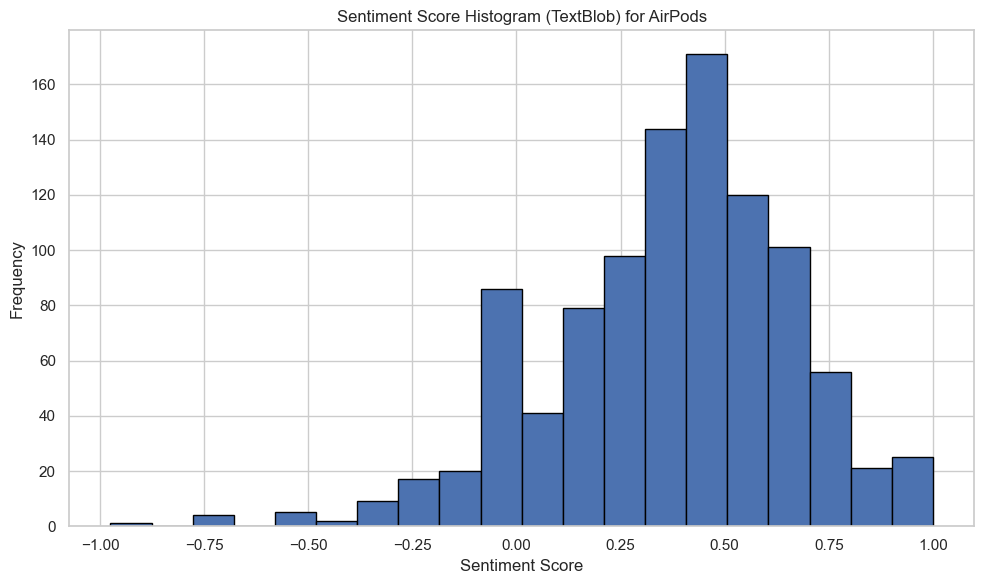

In [356]:
plt.figure(figsize=(10, 6))
plt.hist(df_airpods['SentimentScore_TextBlob'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (TextBlob) for AirPods')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [357]:
sorted_df = df_airpods.sort_values(by='SentimentScore_TextBlob', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Great noise cancellation earpods product ever! Worth the price
---------------------------------------------------------------------------------------------------
1 I’m very happy with my reconditioned AirPods.
---------------------------------------------------------------------------------------------------
2 I’ve never realised there was any difference between earphones until I got my AirPods one of the best purchases I’ve ever made.
---------------------------------------------------------------------------------------------------
3 Awesome, as described! Very happy thank you!
---------------------------------------------------------------------------------------------------
4 Fully working and a great bargain too!!!
---------------------------------------------------------------------------------------------------
5 work just perfectly, at a perfect price too.
---------------------------------------------------------------------------------------------------
6 I got what I paid 

In [358]:
sorted_df = df_airpods.sort_values(by='SentimentScore_TextBlob', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Stops my Spotify and won’t play and says no charge very disappointed
---------------------------------------------------------------------------------------------------
1 Not unused Like described, wouldn’t have bought them otherwise.....would have bought a cheaper refurbished pair instead ...very unhappy and disappointed
---------------------------------------------------------------------------------------------------
2 They are not Apple branded disappointed my daughter birthday on Saturday she will be devastated
---------------------------------------------------------------------------------------------------
3 Waited for two weeks to have it but came it as defective. Case cannot be charged, highly disappointed.
---------------------------------------------------------------------------------------------------
4 The is man are very bad ebuyer the sell something after is cancel it because the buy price hi don’t like it ,has lied when they say something is wrong with your address,

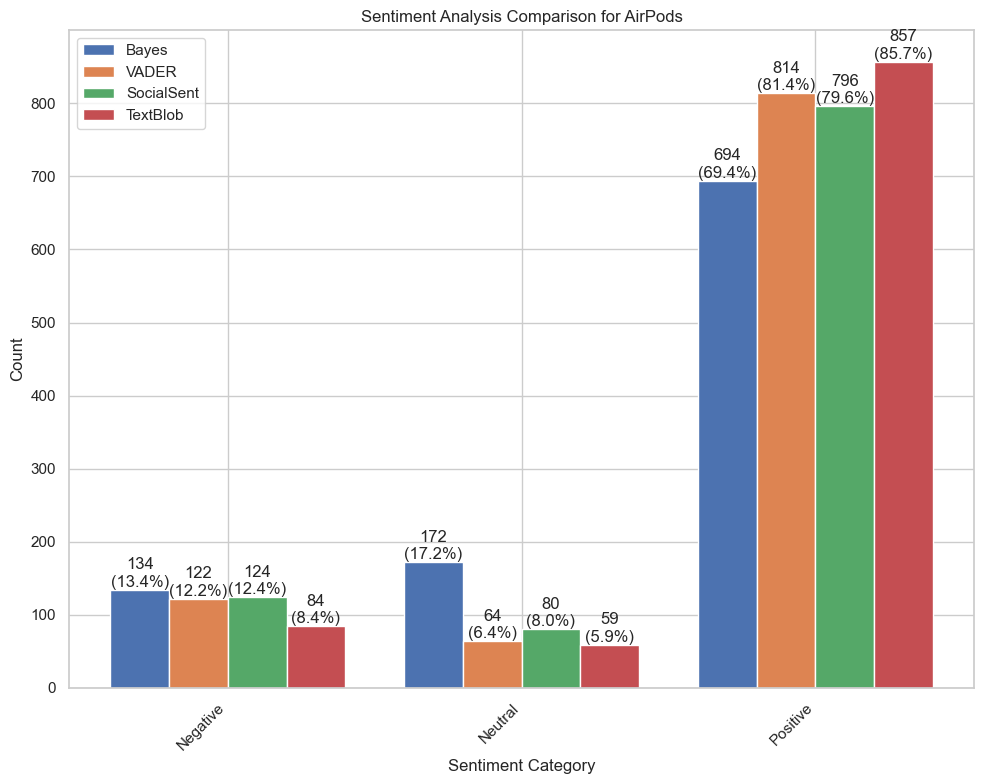

In [359]:
vader_counts = df_airpods['SentimentCategory_VADER'].value_counts()
social_sent_counts = df_airpods['SentimentCategory_SocialSent'].value_counts()
bayes_counts = df_airpods['SentimentCategory_Bayes'].value_counts()
textblob_counts = df_airpods['SentimentCategory_TextBlob'].value_counts()

# Calculate total counts for each analysis method
total_bayes = bayes_counts.sum()
total_vader = vader_counts.sum()
total_social_sent = social_sent_counts.sum()
total_textblob = textblob_counts.sum()

# Combine and sort the sentiment categories from all three columns
sentiment_categories = sorted(set(bayes_counts.index) | set(vader_counts.index) | set(social_sent_counts.index) | set(textblob_counts.index))

fig, ax = plt.subplots(figsize=(10, 8))

bar_width = 0.20

x_bayes = range(len(sentiment_categories))
x_vader = [pos + bar_width for pos in x_bayes]
x_social_sent = [pos + bar_width * 2 for pos in x_bayes]
x_textblob = [pos + bar_width * 3 for pos in x_bayes]

ax.bar(x_bayes, [bayes_counts.get(category, 0) for category in sentiment_categories], bar_width, label='Bayes')
ax.bar(x_vader, [vader_counts.get(category, 0) for category in sentiment_categories], bar_width, label='VADER')
ax.bar(x_social_sent, [social_sent_counts.get(category, 0) for category in sentiment_categories], bar_width, label='SocialSent')
ax.bar(x_textblob, [textblob_counts.get(category, 0) for category in sentiment_categories], bar_width, label='TextBlob')


ax.set_xticks([pos + bar_width for pos in x_bayes])
center_positions = [(vader + social_sent) / 2 for vader, social_sent in zip(x_vader, x_social_sent)]
ax.set_xticks(center_positions)
ax.set_xticklabels(sentiment_categories, rotation=45, ha='right')
ax.set_xlabel('Sentiment Category')
ax.set_ylabel('Count')
ax.set_title('Sentiment Analysis Comparison for AirPods')
ax.legend()

# New code for annotations
def calculate_percentage(count, total):
    return (count / total) * 100 if total > 0 else 0

for i in range(len(sentiment_categories)):
    bayes_count = bayes_counts.get(sentiment_categories[i], 0)
    vader_count = vader_counts.get(sentiment_categories[i], 0)
    social_sent_count = social_sent_counts.get(sentiment_categories[i], 0)
    textblob_count = textblob_counts.get(sentiment_categories[i], 0)

    ax.text(x_bayes[i], bayes_count, f'{bayes_count}\n({calculate_percentage(bayes_count, total_bayes):.1f}%)', ha='center', va='bottom')
    ax.text(x_vader[i], vader_count, f'{vader_count}\n({calculate_percentage(vader_count, total_vader):.1f}%)', ha='center', va='bottom')
    ax.text(x_social_sent[i], social_sent_count, f'{social_sent_count}\n({calculate_percentage(social_sent_count, total_social_sent):.1f}%)', ha='center', va='bottom')
    ax.text(x_textblob[i], textblob_count, f'{textblob_count}\n({calculate_percentage(textblob_count, total_textblob):.1f}%)', ha='center', va='bottom')
    
plt.tight_layout()
plt.show()


***28.5. Apple Watch***

In [361]:
# Apply sentiment analysis to calculate polarity
df_watch['SentimentScore_TextBlob'] = df_watch['Sentiment_Comment'].apply(analyze_sentiment)


df_watch['SentimentCategory_TextBlob'] = df_watch['SentimentScore_TextBlob'].apply(categorize_sentiment)
df_watch

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/3194960773.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_watch['SentimentScore_TextBlob'] = df_watch['Sentiment_Comment'].apply(analyze_sentiment)
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/3194960773.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_watch['SentimentCategory_TextBlob'] = df_watch['SentimentScore_TextBlob'].apply(categorize_sentiment)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion,SentimentScore_TextBlob,SentimentCategory_TextBlob
1000,Apple Watch,16.00,pre-owned,"A computer on your wrist. Apple high quality, ...",computer wrist apple high quality reliable one...,A computer on your wrist . Apple high quality ...,16.0000,1366,Cheap,"[computer, wrist, apple, high, quality, reliab...",3,0.9765,Positive,Positive,0.155755,Positive,computer wrist apple high quality reliable one...,anticipation,0.184167,Positive
1001,Apple Watch,419.95,pre-owned,I lived with an iwatch 2 for a bit even though...,lived watch size bit even though thought used ...,I lived with an watch [ SIZE ] for a bit even ...,331.7605,1094,Expensive,"[lived, watch, size, bit, even, though, though...",0,0.9695,Positive,Positive,0.245714,Positive,lived watch size bit even though thought used ...,anticipation,0.284315,Positive
1002,Apple Watch,10.00,pre-owned,After purchasing a new s7 I felt my s3 was loo...,purchasing new felt looking little worse wear ...,After purchasing a new s I felt my s was looki...,10.0000,821,Cheap,"[purchasing, new, felt, looking, little, worse...",3,0.9912,Positive,Positive,0.249844,Positive,purchasing new felt looking little worse wear ...,anticipation,0.301037,Positive
1003,Apple Watch,120.00,pre-owned,I really wanted to have a larger screen and I ...,really wanted larger screen got want pay full ...,I really wanted to have a larger screen and I ...,120.0000,686,Cheap,"[really, wanted, larger, screen, got, want, pa...",1,0.9539,Positive,Positive,0.139455,Positive,really wanted larger screen got want pay full ...,trust,0.199198,Positive
1004,Apple Watch,219.99,pre-owned,This watch is absolutely awesome! I could go o...,watch absolutely awesome could go forever talk...,This watch is absolutely awesome ! I could go ...,173.7921,672,Expensive,"[watch, absolutely, awesome, could, go, foreve...",3,0.9773,Positive,Positive,0.244074,Positive,watch absolutely awesome could go forever talk...,fear,0.359753,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Apple Watch,150.00,pre-owned,great as all Apple products!,great apple product,great as all Apple products !,150.0000,28,Cheap,"[great, apple, product]",4,0.6588,Positive,Neutral,0.733333,Positive,great apple products,anger anticipation disgust fear joy sadness su...,1.000000,Positive
1996,Apple Watch,219.99,new,Brand new! I’m happy as hell,grand new happy hell,Grand new ! I am happy as hell,173.7921,28,Expensive,"[grand, new, happy, hell]",2,0.3382,Positive,Positive,-0.083333,Negative,grand new happy hell,anger disgust fear sadness,0.490152,Positive
1997,Apple Watch,219.99,new,All Apple products are good.,apple product good,All Apple products are good .,173.7921,28,Expensive,"[apple, product, good]",4,0.4404,Positive,Negative,0.360000,Positive,apple products good,anticipation joy surprise trust,0.700000,Positive
1998,Apple Watch,139.00,pre-owned,Good quality very nice watch,good quality nice watch,Good quality very nice watch,139.0000,28,Cheap,"[good, quality, nice, watch]",0,0.7178,Positive,Positive,0.805000,Positive,good quality nice watch,anticipation,0.740000,Positive


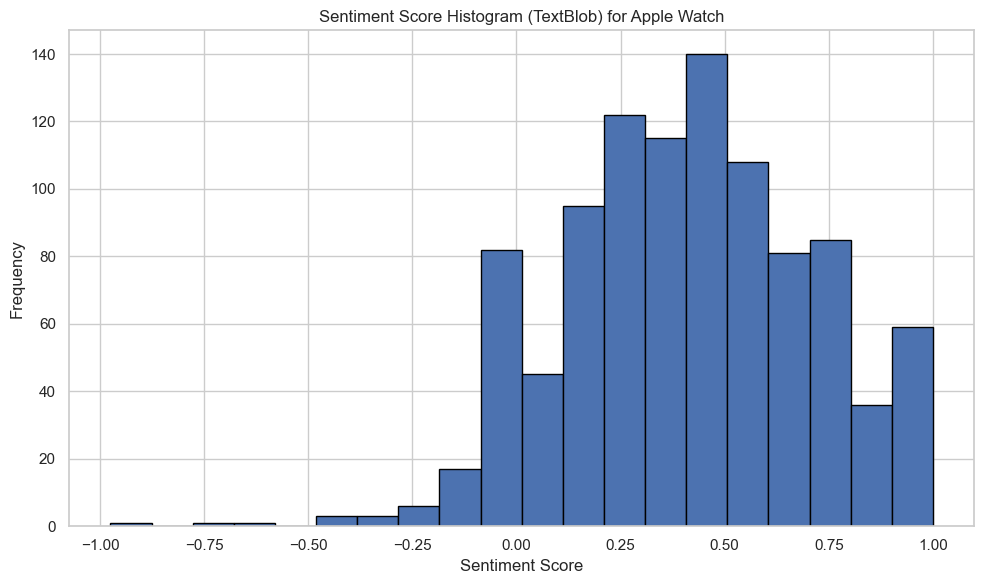

In [362]:
plt.figure(figsize=(10, 6))
plt.hist(df_watch['SentimentScore_TextBlob'], bins=20, edgecolor='black')  # You can adjust the number of bins as needed
plt.title('Sentiment Score Histogram (TextBlob) for Apple Watch')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


In [363]:
sorted_df = df_watch.sort_values(by='SentimentScore_TextBlob', ascending=False)
top_20_comments_SocialSent = sorted_df.head(20)
top_20_comments_SocialSent
for i, comment in enumerate(top_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Better than I thought! Great product!
---------------------------------------------------------------------------------------------------
1 Excellent watch, ticks all the boxes!
---------------------------------------------------------------------------------------------------
2 Battery is great too! Nice watch
---------------------------------------------------------------------------------------------------
3 My grandson loves the watch
It is perfect
---------------------------------------------------------------------------------------------------
4 Excellent product.  I would recommend to buy. Best investment ever.
---------------------------------------------------------------------------------------------------
5 The watch was just as described when I purchased it and works great!
---------------------------------------------------------------------------------------------------
6 I still use it till now.
Excellent
---------------------------------------------------------------

In [364]:
sorted_df = df_watch.sort_values(by='SentimentScore_TextBlob', ascending=True)
bad_20_comments_SocialSent = sorted_df.head(20)
bad_20_comments_SocialSent
for i, comment in enumerate(bad_20_comments_SocialSent['Comment']):
    print(i, comment)
    print("---------------------------------------------------------------------------------------------------")

0 Ordered an Apple Watch series 3 and the screen doesn’t work. Very disappointed. Would not recommend.
---------------------------------------------------------------------------------------------------
1 Wanted an Apple Watch, and haven’t been disappointed.
---------------------------------------------------------------------------------------------------
2 Sent to wrong person. So don’t know how it works!
---------------------------------------------------------------------------------------------------
3 I brought it for my daughter to replace the Fitbit I gave her for Christmas, the band on the Fitbit had broken and she ran over it by mistake
---------------------------------------------------------------------------------------------------
4 I have to admit…I always thought the Apple Watch was pointless. I thought I’d never be one of “those people”…That is until I took the plunge and tried one out. Now I’m addicted to the health side of it. I never leave home without it.
---------

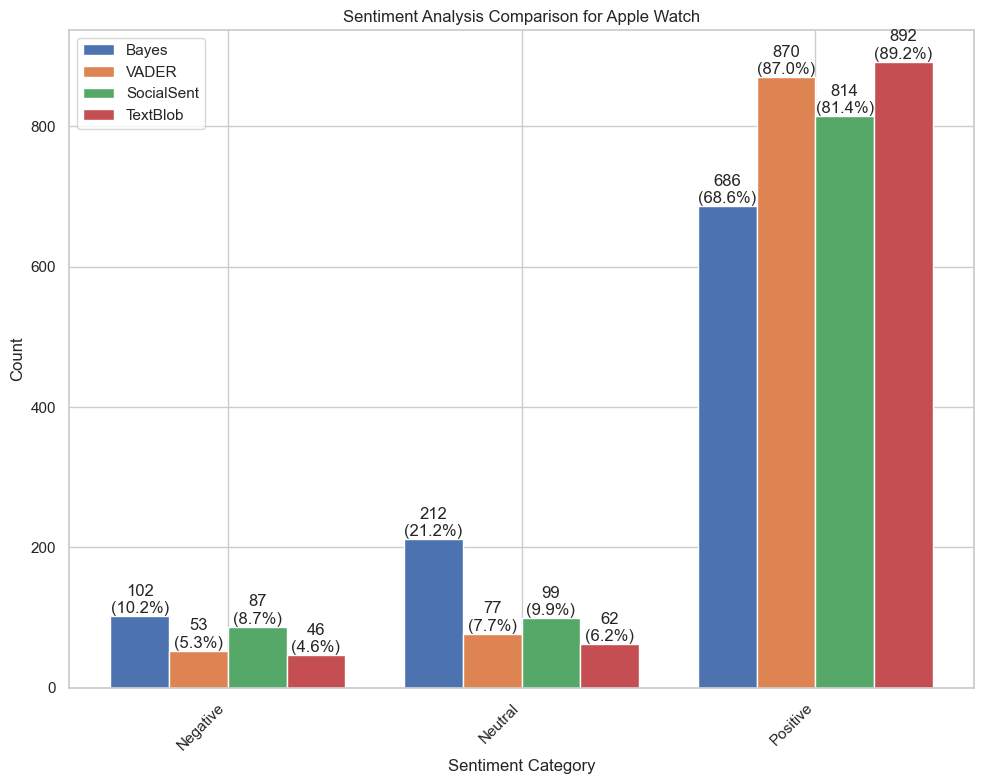

In [365]:
vader_counts = df_watch['SentimentCategory_VADER'].value_counts()
social_sent_counts = df_watch['SentimentCategory_SocialSent'].value_counts()
bayes_counts = df_watch['SentimentCategory_Bayes'].value_counts()
textblob_counts = df_watch['SentimentCategory_TextBlob'].value_counts()

# Calculate total counts for each analysis method
total_bayes = bayes_counts.sum()
total_vader = vader_counts.sum()
total_social_sent = social_sent_counts.sum()
total_textblob = textblob_counts.sum()

# Combine and sort the sentiment categories from all three columns
sentiment_categories = sorted(set(bayes_counts.index) | set(vader_counts.index) | set(social_sent_counts.index) | set(textblob_counts.index))

fig, ax = plt.subplots(figsize=(10, 8))

bar_width = 0.20

x_bayes = range(len(sentiment_categories))
x_vader = [pos + bar_width for pos in x_bayes]
x_social_sent = [pos + bar_width * 2 for pos in x_bayes]
x_textblob = [pos + bar_width * 3 for pos in x_bayes]

ax.bar(x_bayes, [bayes_counts.get(category, 0) for category in sentiment_categories], bar_width, label='Bayes')
ax.bar(x_vader, [vader_counts.get(category, 0) for category in sentiment_categories], bar_width, label='VADER')
ax.bar(x_social_sent, [social_sent_counts.get(category, 0) for category in sentiment_categories], bar_width, label='SocialSent')
ax.bar(x_textblob, [textblob_counts.get(category, 0) for category in sentiment_categories], bar_width, label='TextBlob')


ax.set_xticks([pos + bar_width for pos in x_bayes])
center_positions = [(vader + social_sent) / 2 for vader, social_sent in zip(x_vader, x_social_sent)]
ax.set_xticks(center_positions)
ax.set_xticklabels(sentiment_categories, rotation=45, ha='right')
ax.set_xlabel('Sentiment Category')
ax.set_ylabel('Count')
ax.set_title('Sentiment Analysis Comparison for Apple Watch')
ax.legend()

# New code for annotations
def calculate_percentage(count, total):
    return (count / total) * 100 if total > 0 else 0

for i in range(len(sentiment_categories)):
    bayes_count = bayes_counts.get(sentiment_categories[i], 0)
    vader_count = vader_counts.get(sentiment_categories[i], 0)
    social_sent_count = social_sent_counts.get(sentiment_categories[i], 0)
    textblob_count = textblob_counts.get(sentiment_categories[i], 0)

    ax.text(x_bayes[i], bayes_count, f'{bayes_count}\n({calculate_percentage(bayes_count, total_bayes):.1f}%)', ha='center', va='bottom')
    ax.text(x_vader[i], vader_count, f'{vader_count}\n({calculate_percentage(vader_count, total_vader):.1f}%)', ha='center', va='bottom')
    ax.text(x_social_sent[i], social_sent_count, f'{social_sent_count}\n({calculate_percentage(social_sent_count, total_social_sent):.1f}%)', ha='center', va='bottom')
    ax.text(x_textblob[i], textblob_count, f'{textblob_count}\n({calculate_percentage(textblob_count, total_textblob):.1f}%)', ha='center', va='bottom')
    
plt.tight_layout()
plt.show()


**29. Emotion analysis**

***29.1. iPhone***

In [305]:
#Conduct emotion analysis with LexMo
from LeXmo import LeXmo

def calculate_emotion(text):
    emo = LeXmo.LeXmo(text)
    emo.pop('text')
    emo.pop('negative')
    emo.pop('positive')
    max_value = max(emo.values())
    max_keys = [key for key, value in emo.items() if value == max_value]
    return " ".join(max_keys)

df_iphone['Emotion'] = df_iphone['Sentiment_Comment'].apply(calculate_emotion)
df_iphone

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/hasanenesguray/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1492879640.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_iphone['Emotion'] = df_iphone['Sentiment_Comment'].apply(calculate_emotion)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion
2000,Iphone,183.00,pre-owned,I've owned and used an iPhone 6S (standard siz...,owned used iphone standard size since came alm...,I have owned and used an iPhone Of ( standard ...,183.00,1921,Expensive,"[owned, used, iphone, standard, size, since, c...",4,0.9936,Positive,Positive,0.107226,Positive,owned used iphone standard size since came alm...,anticipation
2001,Iphone,159.99,new,The 2016 iPhone SE is one of the best products...,size iphone one best product apple ever made c...,The [ SIZE ] iPhone of is one of the best prod...,159.99,1534,Expensive,"[size, iphone, one, best, product, apple, ever...",4,0.9935,Positive,Positive,0.083393,Positive,size iphone one best products apple ever made ...,anticipation joy
2002,Iphone,5.00,pre-owned,This is my first smartphone and because I am a...,first smartphone skinflint old unlocked model ...,This is my first smartphone and because I am a...,5.00,1478,Cheap,"[first, smartphone, skinflint, old, unlocked, ...",4,0.9452,Positive,Positive,0.029910,Neutral,first smartphone skinflint old unlocked model ...,fear
2003,Iphone,339.99,pre-owned,My wife likes to hang onto things and is not o...,wife like hang onto thing one unnecessary chan...,My wife likes to hang onto things and is not o...,339.99,1417,Expensive,"[wife, like, hang, onto, thing, one, unnecessa...",3,0.9720,Positive,Positive,0.077732,Positive,wife likes hang onto things one unnecessary ch...,anticipation
2004,Iphone,159.99,pre-owned,For the age of the phone It Is Quick and very ...,age phone quick unfordable able run latest sof...,For the age of the phone It Is Quick and very ...,159.99,1366,Expensive,"[age, phone, quick, unfordable, able, run, lat...",4,0.4245,Positive,Positive,0.005800,Neutral,age phone quick unfordable able run latest sof...,trust
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,Iphone,580.00,new,Upgraded to the bigger iPhone from the iPhone ...,degraded bigger iphone iphone size pro believe...,Degraded to the bigger iPhone from the iPhone ...,580.00,213,Expensive,"[degraded, bigger, iphone, iphone, size, pro, ...",4,0.8169,Positive,Positive,0.116875,Positive,degraded bigger iphone iphone size pro cannot ...,anger anticipation disgust fear joy sadness su...
2996,Iphone,5.00,pre-owned,I have bought 3 second iPhones one I sent back...,bought size second iphones one sent back terri...,I have bought [ SIZE ] second iPhones one I se...,5.00,213,Cheap,"[bought, size, second, iphones, one, sent, bac...",4,-0.2263,Negative,Negative,-0.128667,Negative,bought size second iphones one sent back terri...,anger anticipation disgust fear joy sadness su...
2997,Iphone,85.00,pre-owned,Battery is draining very fast from 100% to 1% ...,battery draining fast size size max size hour ...,Battery is draining very fast from [ SIZE ] % ...,85.00,213,Expensive,"[battery, draining, fast, size, size, max, siz...",4,0.5267,Positive,Negative,0.113000,Positive,battery draining fast size size max size hours...,anticipation joy surprise trust
2998,Iphone,379.99,others,Near perfect condition. 5G. Much cheaper than ...,dear perfect condition cheaper latest inclinat...,Dear perfect condition . Of . Such cheaper tha...,379.99,213,Expensive,"[dear, perfect, condition, cheaper, latest, in...",4,-0.2439,Negative,Positive,0.227692,Positive,dear perfect condition cheaper latest inclinat...,anticipation


In [306]:
df_iphone[['Comment','Emotion']]

,Comment,Emotion
2000,I've owned and used an iPhone 6S (standard siz...,anticipation
2001,The 2016 iPhone SE is one of the best products...,anticipation joy
2002,This is my first smartphone and because I am a...,fear
2003,My wife likes to hang onto things and is not o...,anticipation
2004,For the age of the phone It Is Quick and very ...,trust
...,...,...
2995,Upgraded to the bigger iPhone from the iPhone ...,anger anticipation disgust fear joy sadness su...
2996,I have bought 3 second iPhones one I sent back...,anger anticipation disgust fear joy sadness su...
2997,Battery is draining very fast from 100% to 1% ...,anticipation joy surprise trust
2998,Near perfect condition. 5G. Much cheaper than ...,anticipation


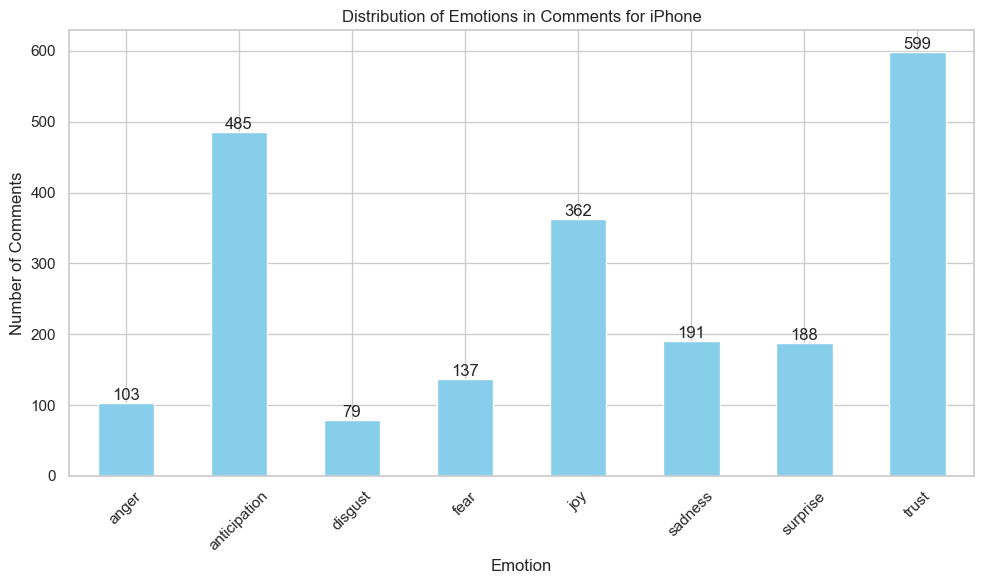

In [307]:
#Plot the distribution of emotions in comments
emotions = ["anger", "anticipation", "disgust", "fear", "joy", "sadness", "surprise", "trust"]

emotion_counts = {emotion: 0 for emotion in emotions}

for index, row in df_iphone.iterrows():
    comment_emotions = row['Emotion'].split()  # Split emotions in the comment
    for emotion in emotions:
        if emotion in comment_emotions:
            emotion_counts[emotion] += 1

emotion_counts_series = pd.Series(emotion_counts)

plt.figure(figsize=(10, 6))
emotion_counts_series.plot(kind='bar', color='skyblue')
plt.title('Distribution of Emotions in Comments for iPhone')
plt.xlabel('Emotion')
plt.ylabel('Number of Comments')
plt.xticks(rotation=45)
plt.tight_layout()

for index, value in enumerate(emotion_counts_series):
    plt.text(index, value, str(value), ha='center', va='bottom')

plt.show()


***29.2. Macbook***

In [308]:
df_mac['Emotion'] = df_mac['Sentiment_Comment'].apply(calculate_emotion)
df_mac

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/1581698278.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_mac['Emotion'] = df_mac['Sentiment_Comment'].apply(calculate_emotion)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion
3000,Macbook,0.00,others,"The 2019 MacBook Pro 16"" that I received was e...",size macbook pro size received exactly describ...,"The [ SIZE ] MacBook Pro [ SIZE ] "" that I rec...",0.00,3078,Cheap,"[size, macbook, pro, size, received, exactly, ...",2,0.9945,Positive,Positive,0.110290,Positive,size macbook pro size received exactly describ...,anticipation
3001,Macbook,550.00,new,"Best value for money, not just from apple, but...",west value money apple compared existing lapto...,"West value for money , not just from apple , b...",434.50,1415,Expensive,"[west, value, money, apple, compared, existing...",0,0.9917,Positive,Positive,0.156446,Positive,west value money apple compared existing lapto...,trust
3002,Macbook,0.00,pre-owned,"I have dived into the Mac walled garden, which...",dived sac walled garden avoided year good bad ...,"I have dived into the Sac walled garden , whic...",0.00,1181,Cheap,"[dived, sac, walled, garden, avoided, year, go...",0,0.9932,Positive,Positive,0.324051,Positive,dived sac walled garden avoided years good bad...,anticipation
3003,Macbook,750.00,pre-owned,This laptop does exactly what it needs to do. ...,laptop exactly need apple processor delivers h...,This laptop does exactly what it needs to do ....,592.50,1121,Expensive,"[laptop, exactly, need, apple, processor, deli...",2,0.9907,Positive,Positive,0.029487,Neutral,laptop exactly needs apple processor delivers ...,anticipation joy
3004,Macbook,179.00,refurbished,Very happy with my purchase. The Macbook Air 1...,happy purchase macbook air size arrived time c...,Very happy with my purchase . The Macbook Air ...,141.41,1084,Cheap,"[happy, purchase, macbook, air, size, arrived,...",4,0.9586,Positive,Positive,0.037500,Neutral,happy purchase macbook air size arrived time c...,sadness trust
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,Macbook,850.00,new,Apple the best of the best,apple best best,Apple the best of the best,671.50,26,Expensive,"[apple, best, best]",0,0.8555,Positive,Positive,1.150000,Positive,apple best best,anger anticipation disgust fear joy sadness su...
3996,Macbook,900.00,pre-owned,great color and protection,great color protection,great color and protection,711.00,26,Expensive,"[great, color, protection]",1,0.6249,Positive,Positive,0.453333,Positive,great color protection,anger anticipation disgust fear joy sadness su...
3997,Macbook,159.99,pre-owned,Good quality for the price,good quality price,Good quality for the price,159.99,26,Cheap,"[good, quality, price]",1,0.4404,Positive,Neutral,0.915000,Positive,good quality price,anticipation joy surprise trust
3998,Macbook,550.00,new,Brand new and came quickly,grand new came quickly,Grand new and came quickly,434.50,26,Expensive,"[grand, new, came, quickly]",4,0.4588,Positive,Positive,-0.070000,Negative,grand new came quickly,anger anticipation disgust fear joy sadness su...


In [309]:
df_mac[['Comment','Emotion']]

,Comment,Emotion
3000,"The 2019 MacBook Pro 16"" that I received was e...",anticipation
3001,"Best value for money, not just from apple, but...",trust
3002,"I have dived into the Mac walled garden, which...",anticipation
3003,This laptop does exactly what it needs to do. ...,anticipation joy
3004,Very happy with my purchase. The Macbook Air 1...,sadness trust
...,...,...
3995,Apple the best of the best,anger anticipation disgust fear joy sadness su...
3996,great color and protection,anger anticipation disgust fear joy sadness su...
3997,Good quality for the price,anticipation joy surprise trust
3998,Brand new and came quickly,anger anticipation disgust fear joy sadness su...


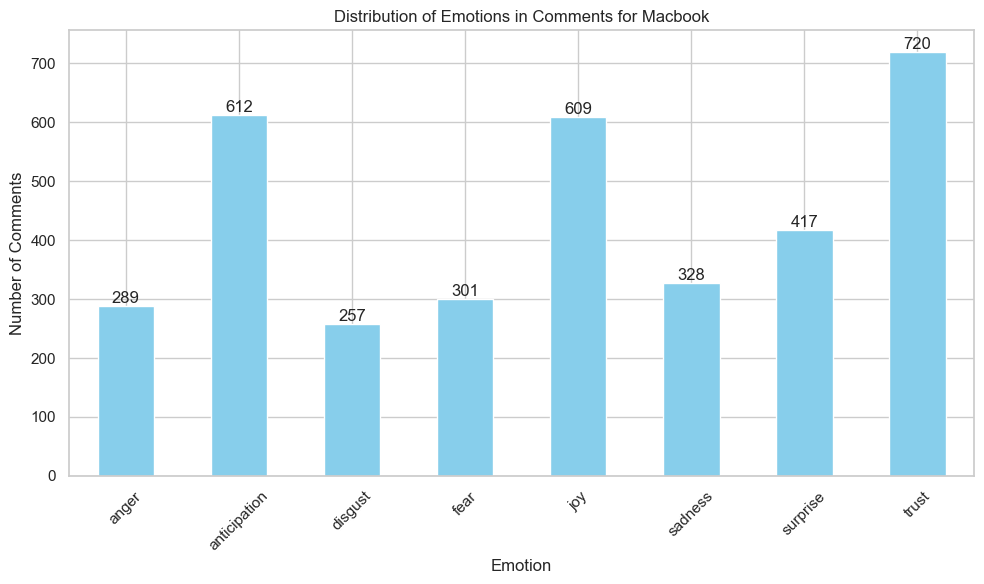

In [310]:
# Initialize a dictionary to store emotion counts
emotion_counts = {emotion: 0 for emotion in emotions}

# Iterate through each row and count the emotions
for index, row in df_mac.iterrows():
    comment_emotions = row['Emotion'].split()  # Split emotions in the comment
    for emotion in emotions:
        if emotion in comment_emotions:
            emotion_counts[emotion] += 1

# Convert the dictionary to a Pandas Series for plotting
emotion_counts_series = pd.Series(emotion_counts)

# Create a bar chart
plt.figure(figsize=(10, 6))
emotion_counts_series.plot(kind='bar', color='skyblue')
plt.title('Distribution of Emotions in Comments for Macbook')
plt.xlabel('Emotion')
plt.ylabel('Number of Comments')
plt.xticks(rotation=45)
plt.tight_layout()

# Adding exact values on top of each bar
for index, value in enumerate(emotion_counts_series):
    plt.text(index, value, str(value), ha='center', va='bottom')

plt.show()

***29.3. iPad***

In [311]:
df_ipad['Emotion'] = df_ipad['Sentiment_Comment'].apply(calculate_emotion)
df_ipad

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/3321922518.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ipad['Emotion'] = df_ipad['Sentiment_Comment'].apply(calculate_emotion)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion
4000,iPad,410.00,pre-owned,Good product but still very pricey! The ipad a...,good product still price ipad air better chip ...,Good product but still very prices ! The ipad ...,410.0000,1284,Expensive,"[good, product, still, price, ipad, air, bette...",3,0.5308,Positive,Positive,0.048571,Neutral,good product still prices ipad air better chip...,anticipation trust
4001,iPad,21.00,pre-owned,"My iPad 2 was getting slow thanks, probably, t...",ipad size getting slow thanks probably later a...,"My iPad [ SIZE ] was getting slow thanks , pro...",21.0000,1163,Cheap,"[ipad, size, getting, slow, thanks, probably, ...",1,0.9887,Positive,Positive,0.098298,Positive,ipad size getting slow thanks probably later a...,trust
4002,iPad,5.00,pre-owned,My only criticism is that the charging lead in...,criticism charging lead picture suggests newer...,My only criticism is that the charging lead in...,5.0000,1011,Cheap,"[criticism, charging, lead, picture, suggests,...",3,0.9886,Positive,Positive,0.081000,Positive,criticism charging lead picture suggests newer...,trust
4003,iPad,149.99,pre-owned,So I just opened the box and unwrapped my new ...,opened box unwrapped new ipad first look ipad ...,So I just opened the box and unwrapped my new ...,118.4921,938,Expensive,"[opened, box, unwrapped, new, ipad, first, loo...",2,0.9791,Positive,Positive,0.205424,Positive,opened box unwrapped new ipad first look ipad ...,anticipation
4004,iPad,21.00,pre-owned,"The IPAD AIR 2 is still an OK IPAD. However, w...",ipad air size still ipad however whilst probab...,The IPAD AIR [ SIZE ] is still an of IPAD . Ho...,21.0000,779,Cheap,"[ipad, air, size, still, ipad, however, whilst...",0,-0.0119,Neutral,Positive,0.221964,Positive,ipad air size still ipad however whilst probab...,sadness
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,iPad,5.00,refurbished,Brillant price and great ipad,brilliant price great ipad,Brilliant price and great ipad,5.0000,29,Cheap,"[brilliant, price, great, ipad]",0,0.8360,Positive,Positive,1.316667,Positive,brilliant price great ipad,anticipation joy trust
4996,iPad,5.00,pre-owned,Fast delivery no cons perfect,last delivery son perfect,Last delivery no sons perfect,5.0000,29,Cheap,"[last, delivery, son, perfect]",0,0.3612,Positive,Positive,0.593333,Positive,last delivery sons perfect,anticipation joy trust
4997,iPad,149.99,others,Excellent tablet\nRecommend it,excellent tablet recommend,Excellent tablet Recommend it,118.4921,29,Expensive,"[excellent, tablet, recommend]",0,0.7351,Positive,Neutral,0.000000,Neutral,excellent tablet recommend,trust
4998,iPad,149.99,pre-owned,Product was very acceptable.,product acceptable,Product was very acceptable .,118.4921,28,Expensive,"[product, acceptable]",0,0.3804,Positive,Negative,0.290000,Positive,product acceptable,anger anticipation disgust fear joy sadness su...


In [312]:
df_ipad[['Comment','Emotion']]

,Comment,Emotion
4000,Good product but still very pricey! The ipad a...,anticipation trust
4001,"My iPad 2 was getting slow thanks, probably, t...",trust
4002,My only criticism is that the charging lead in...,trust
4003,So I just opened the box and unwrapped my new ...,anticipation
4004,"The IPAD AIR 2 is still an OK IPAD. However, w...",sadness
...,...,...
4995,Brillant price and great ipad,anticipation joy trust
4996,Fast delivery no cons perfect,anticipation joy trust
4997,Excellent tablet\nRecommend it,trust
4998,Product was very acceptable.,anger anticipation disgust fear joy sadness su...


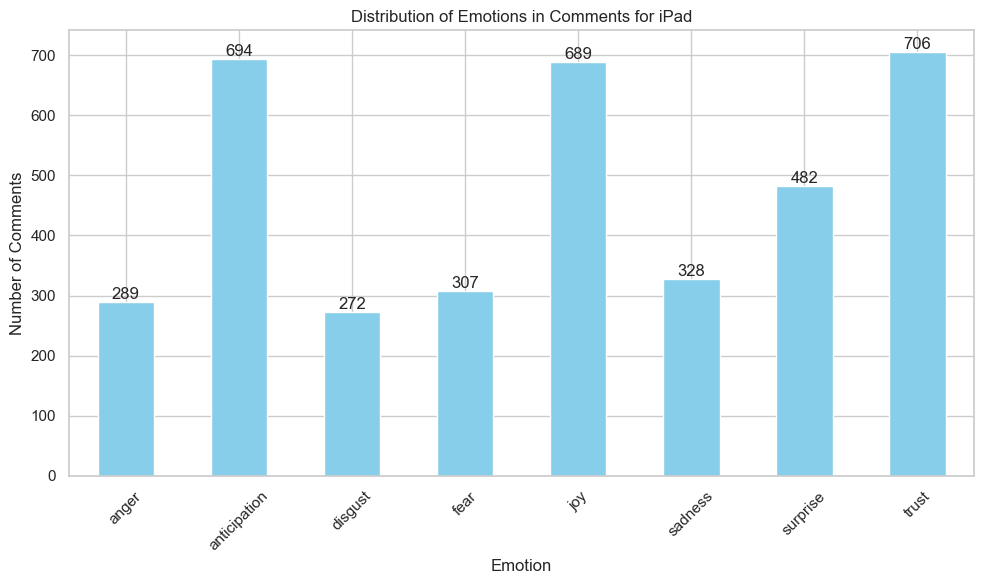

In [313]:
# Initialize a dictionary to store emotion counts
emotion_counts = {emotion: 0 for emotion in emotions}

# Iterate through each row and count the emotions
for index, row in df_ipad.iterrows():
    comment_emotions = row['Emotion'].split()  # Split emotions in the comment
    for emotion in emotions:
        if emotion in comment_emotions:
            emotion_counts[emotion] += 1

# Convert the dictionary to a Pandas Series for plotting
emotion_counts_series = pd.Series(emotion_counts)

# Create a bar chart
plt.figure(figsize=(10, 6))
emotion_counts_series.plot(kind='bar', color='skyblue')
plt.title('Distribution of Emotions in Comments for iPad')
plt.xlabel('Emotion')
plt.ylabel('Number of Comments')
plt.xticks(rotation=45)
plt.tight_layout()

# Adding exact values on top of each bar
for index, value in enumerate(emotion_counts_series):
    plt.text(index, value, str(value), ha='center', va='bottom')

plt.show()

***29.4. AirPods***

In [314]:
df_airpods['Emotion'] = df_airpods['Sentiment_Comment'].apply(calculate_emotion)
df_airpods

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/2632544429.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_airpods['Emotion'] = df_airpods['Sentiment_Comment'].apply(calculate_emotion)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion
0,AirPods,69.99,pre-owned,"Bought these for teenage daughter on eBay, sig...",bought teenage daughter may significantly rrp ...,"Bought these for teenage daughter on may , sig...",69.99,1971,Cheap,"[bought, teenage, daughter, may, significantly...",4,0.9835,Positive,Positive,0.071702,Positive,bought teenage daughter may significantly rrp ...,fear trust
1,AirPods,69.99,pre-owned,I bought these refurbished set of AirPods and ...,bought refurbished set airpods must say blown ...,I bought these refurbished set of AirPods and ...,69.99,1106,Cheap,"[bought, refurbished, set, airpods, must, say,...",2,0.8915,Positive,Positive,0.051519,Positive,bought refurbished set airpods must say blown ...,trust
2,AirPods,139.99,new,Pros: sound quality is excellent if you can ge...,pro sound quality excellent get good seal ear ...,Pros : sound quality is excellent if you can g...,139.99,846,Expensive,"[pro, sound, quality, excellent, get, good, se...",4,0.9576,Positive,Positive,0.262982,Positive,pros sound quality excellent get good seal ear...,trust
3,AirPods,139.99,new,"What a clever little set of earphones, without...",clever little set earphone without music noise...,"What a clever little set of earphones , withou...",139.99,782,Expensive,"[clever, little, set, earphone, without, music...",3,0.9100,Positive,Positive,0.053750,Positive,clever little set earphones without music nois...,sadness
4,AirPods,139.99,new,The Apple AirPod Pro is a fantastic set of wir...,apple airpod pro fantastic set tireless headph...,The Apple AirPod Pro is a fantastic set of tir...,139.99,773,Expensive,"[apple, airpod, pro, fantastic, set, tireless,...",4,0.9257,Positive,Positive,0.405333,Positive,apple airpod pro fantastic set tireless headph...,trust
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,AirPods,139.99,new,Stopped working after a couple of weeks,stopped working couple week,Stopped working after a couple of weeks,139.99,39,Expensive,"[stopped, working, couple, week]",4,-0.2263,Negative,Neutral,0.030000,Neutral,stopped working couple weeks,anger anticipation disgust fear joy sadness su...
996,AirPods,69.99,new,The product is as promised. Many thanks,product promised thanks,The product is as promised . Any thanks,69.99,39,Cheap,"[product, promised, thanks]",3,0.6597,Positive,Neutral,0.355000,Positive,product promised thanks,anger anticipation disgust fear joy sadness su...
997,AirPods,69.99,pre-owned,"Charger stopped eirking, waste my money",larger stopped firing waste money,"Larger stopped firing , waste my money",69.99,39,Cheap,"[larger, stopped, firing, waste, money]",1,-0.7269,Negative,Negative,-0.060000,Negative,larger stopped firing waste money,surprise trust
998,AirPods,69.99,pre-owned,No faults at all happy with my purchase,fault happy purchase,No faults at all happy with my purchase,69.99,39,Cheap,"[fault, happy, purchase]",1,-0.1531,Negative,Positive,0.240000,Positive,faults happy purchase,sadness


In [315]:
df_airpods[['Comment','Emotion']]

,Comment,Emotion
0,"Bought these for teenage daughter on eBay, sig...",fear trust
1,I bought these refurbished set of AirPods and ...,trust
2,Pros: sound quality is excellent if you can ge...,trust
3,"What a clever little set of earphones, without...",sadness
4,The Apple AirPod Pro is a fantastic set of wir...,trust
...,...,...
995,Stopped working after a couple of weeks,anger anticipation disgust fear joy sadness su...
996,The product is as promised. Many thanks,anger anticipation disgust fear joy sadness su...
997,"Charger stopped eirking, waste my money",surprise trust
998,No faults at all happy with my purchase,sadness


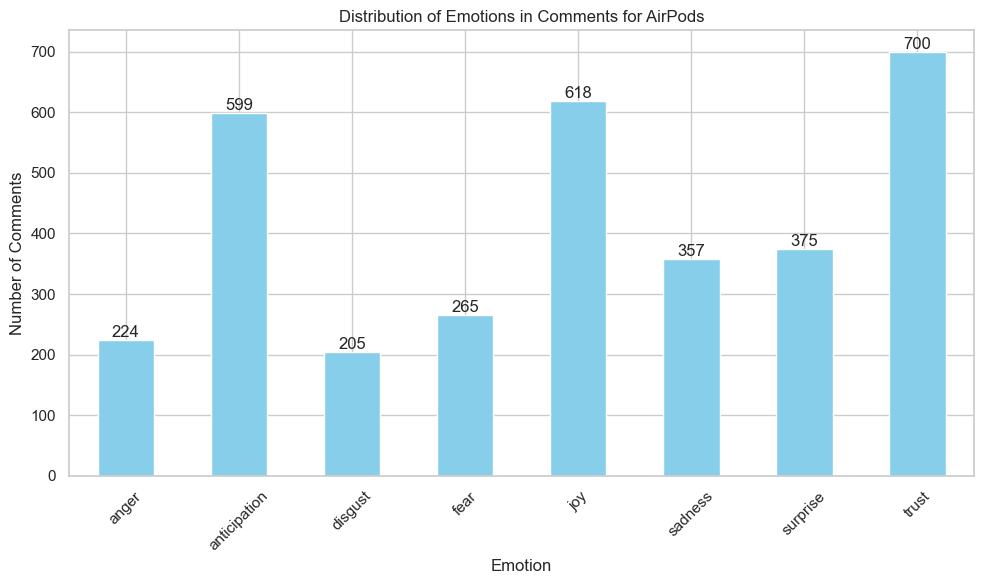

In [316]:
# Initialize a dictionary to store emotion counts
emotion_counts = {emotion: 0 for emotion in emotions}

# Iterate through each row and count the emotions
for index, row in df_airpods.iterrows():
    comment_emotions = row['Emotion'].split()  # Split emotions in the comment
    for emotion in emotions:
        if emotion in comment_emotions:
            emotion_counts[emotion] += 1

# Convert the dictionary to a Pandas Series for plotting
emotion_counts_series = pd.Series(emotion_counts)

# Create a bar chart
plt.figure(figsize=(10, 6))
emotion_counts_series.plot(kind='bar', color='skyblue')
plt.title('Distribution of Emotions in Comments for AirPods')
plt.xlabel('Emotion')
plt.ylabel('Number of Comments')
plt.xticks(rotation=45)
plt.tight_layout()

# Adding exact values on top of each bar
for index, value in enumerate(emotion_counts_series):
    plt.text(index, value, str(value), ha='center', va='bottom')

plt.show()

***29.5. Apple Watch***

In [320]:
df_watch['Emotion'] = df_watch['Sentiment_Comment'].apply(calculate_emotion)
df_watch

/var/folders/_k/_rt6thqx6mj63rxtq_q_l7j00000gn/T/ipykernel_99637/164227614.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_watch['Emotion'] = df_watch['Sentiment_Comment'].apply(calculate_emotion)


,Search,Price,Condition,Comment,Cleaned_Comment,Sentiment_Comment,Price_GBP(30Nov23),Length,Price_Segment,Tokenized_Comment,Topic,SentimentScore_VADER,SentimentCategory_VADER,SentimentCategory_Bayes,SentimentScore_SocialSent,SentimentCategory_SocialSent,cleaned_text,Emotion
1000,Apple Watch,16.00,pre-owned,"A computer on your wrist. Apple high quality, ...",computer wrist apple high quality reliable one...,A computer on your wrist . Apple high quality ...,16.0000,1366,Cheap,"[computer, wrist, apple, high, quality, reliab...",3,0.9765,Positive,Positive,0.155755,Positive,computer wrist apple high quality reliable one...,anticipation
1001,Apple Watch,419.95,pre-owned,I lived with an iwatch 2 for a bit even though...,lived watch size bit even though thought used ...,I lived with an watch [ SIZE ] for a bit even ...,331.7605,1094,Expensive,"[lived, watch, size, bit, even, though, though...",0,0.9695,Positive,Positive,0.245714,Positive,lived watch size bit even though thought used ...,anticipation
1002,Apple Watch,10.00,pre-owned,After purchasing a new s7 I felt my s3 was loo...,purchasing new felt looking little worse wear ...,After purchasing a new s I felt my s was looki...,10.0000,821,Cheap,"[purchasing, new, felt, looking, little, worse...",3,0.9912,Positive,Positive,0.249844,Positive,purchasing new felt looking little worse wear ...,anticipation
1003,Apple Watch,120.00,pre-owned,I really wanted to have a larger screen and I ...,really wanted larger screen got want pay full ...,I really wanted to have a larger screen and I ...,120.0000,686,Cheap,"[really, wanted, larger, screen, got, want, pa...",1,0.9539,Positive,Positive,0.139455,Positive,really wanted larger screen got want pay full ...,trust
1004,Apple Watch,219.99,pre-owned,This watch is absolutely awesome! I could go o...,watch absolutely awesome could go forever talk...,This watch is absolutely awesome ! I could go ...,173.7921,672,Expensive,"[watch, absolutely, awesome, could, go, foreve...",3,0.9773,Positive,Positive,0.244074,Positive,watch absolutely awesome could go forever talk...,fear
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Apple Watch,150.00,pre-owned,great as all Apple products!,great apple product,great as all Apple products !,150.0000,28,Cheap,"[great, apple, product]",4,0.6588,Positive,Neutral,0.733333,Positive,great apple products,anger anticipation disgust fear joy sadness su...
1996,Apple Watch,219.99,new,Brand new! I’m happy as hell,grand new happy hell,Grand new ! I am happy as hell,173.7921,28,Expensive,"[grand, new, happy, hell]",2,0.3382,Positive,Positive,-0.083333,Negative,grand new happy hell,anger disgust fear sadness
1997,Apple Watch,219.99,new,All Apple products are good.,apple product good,All Apple products are good .,173.7921,28,Expensive,"[apple, product, good]",4,0.4404,Positive,Negative,0.360000,Positive,apple products good,anticipation joy surprise trust
1998,Apple Watch,139.00,pre-owned,Good quality very nice watch,good quality nice watch,Good quality very nice watch,139.0000,28,Cheap,"[good, quality, nice, watch]",0,0.7178,Positive,Positive,0.805000,Positive,good quality nice watch,anticipation


In [321]:
df_watch[['Comment','Emotion']]

,Comment,Emotion
1000,"A computer on your wrist. Apple high quality, ...",anticipation
1001,I lived with an iwatch 2 for a bit even though...,anticipation
1002,After purchasing a new s7 I felt my s3 was loo...,anticipation
1003,I really wanted to have a larger screen and I ...,trust
1004,This watch is absolutely awesome! I could go o...,fear
...,...,...
1995,great as all Apple products!,anger anticipation disgust fear joy sadness su...
1996,Brand new! I’m happy as hell,anger disgust fear sadness
1997,All Apple products are good.,anticipation joy surprise trust
1998,Good quality very nice watch,anticipation


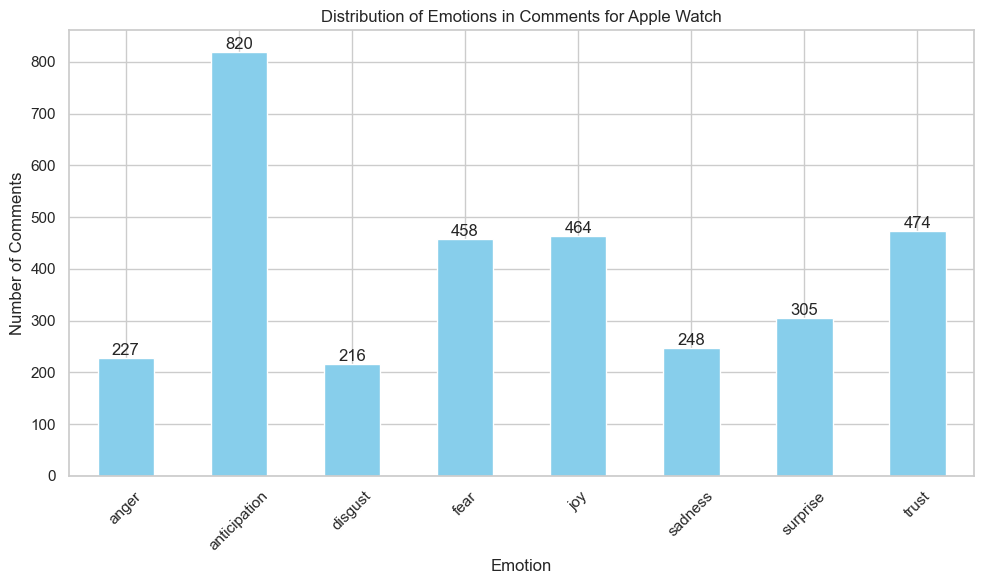

In [322]:
# Initialize a dictionary to store emotion counts
emotion_counts = {emotion: 0 for emotion in emotions}

# Iterate through each row and count the emotions
for index, row in df_watch.iterrows():
    comment_emotions = row['Emotion'].split()  # Split emotions in the comment
    for emotion in emotions:
        if emotion in comment_emotions:
            emotion_counts[emotion] += 1

# Convert the dictionary to a Pandas Series for plotting
emotion_counts_series = pd.Series(emotion_counts)

# Create a bar chart
plt.figure(figsize=(10, 6))
emotion_counts_series.plot(kind='bar', color='skyblue')
plt.title('Distribution of Emotions in Comments for Apple Watch')
plt.xlabel('Emotion')
plt.ylabel('Number of Comments')
plt.xticks(rotation=45)
plt.tight_layout()

# Adding exact values on top of each bar
for index, value in enumerate(emotion_counts_series):
    plt.text(index, value, str(value), ha='center', va='bottom')

plt.show()

In [372]:
#Export the EDA result
df_iphone.to_excel('Output/eBay/ebay_iphone.xlsx', index=False)
df_airpods.to_excel('Output/eBay/ebay_airpods.xlsx', index=False)
df_ipad.to_excel('Output/eBay/ebay_ipad.xlsx', index=False)
df_mac.to_excel('Output/eBay/ebay_mac.xlsx', index=False)
df_watch.to_excel('Output/eBay/ebay_watch.xlsx', index=False)